# Notebook 2: Data Mastery - EDA, Cleaning & Feature Engineering
**ML Master Series | The 80% of Machine Learning Work**

---

## 📋 Table of Contents

1. [Introduction: Why Data Matters](#1-introduction)
2. [Understanding Your Dataset](#2-understanding-dataset)
3. [Exploratory Data Analysis (EDA)](#3-exploratory-data-analysis)
4. [Missing Values](#4-missing-values)
5. [Outlier Detection & Treatment](#5-outliers)
6. [Encoding Categorical Variables](#6-encoding)
7. [Feature Scaling](#7-feature-scaling)
8. [Feature Engineering](#8-feature-engineering)
9. [Data Leakage Prevention](#9-data-leakage)
10. [Creating Model-Ready Datasets](#10-model-ready-datasets)
11. [Summary & Key Takeaways](#11-summary)

---

## 1. Introduction: Why Data Matters

**The Most Important Truth in Machine Learning:**
```
Good Data + Simple Model > Bad Data + Complex Model
```

Data quality is the single most important factor determining machine learning success. No amount of algorithmic sophistication can compensate for poor data. This notebook focuses on the critical skills that consume 80% of a data scientist's time but deliver 80% of the value.

### 1.1 The Data-Centric View of ML

Traditional ML education focuses heavily on algorithms, but real-world success depends on:

| Factor | Impact on Model Performance | Time Investment |
|--------|---------------------------|-----------------|
| **Data Quality** | 70-80% | 60-70% of project time |
| **Feature Engineering** | 10-20% | 20-30% of project time |
| **Algorithm Selection** | 5-10% | 5-10% of project time |
| **Hyperparameter Tuning** | 2-5% | 5-10% of project time |

**Key Insight:** Improving data quality yields far better returns than optimizing algorithms.

---

### 1.2 What This Notebook Covers

**Core Skills:**

✅ **Exploratory Data Analysis (EDA)**
- Understand data distributions, relationships, and patterns
- Identify data quality issues before modeling
- Generate hypotheses for feature engineering

✅ **Data Cleaning**
- Handle missing values appropriately (not just .fillna())
- Detect and treat outliers
- Deal with duplicates and inconsistencies

✅ **Feature Engineering**
- Transform raw features into model-ready inputs
- Create new features from domain knowledge
- Select informative features

✅ **Encoding & Scaling**
- Convert categorical variables to numerical
- Scale features appropriately for different algorithms
- Understand when scaling is (and isn't) needed

✅ **Data Leakage Prevention**
- Recognize and avoid subtle leakage patterns
- Properly structure preprocessing pipelines
- Maintain train-test separation

---

### 1.3 Learning Objectives

By the end of this notebook, you will be able to:

| Objective | Skill Level |
|-----------|-------------|
| **Diagnose data quality issues** | Identify missing values, outliers, distributions |
| **Perform comprehensive EDA** | Univariate, bivariate, multivariate analysis |
| **Handle missing values systematically** | MCAR vs MAR vs MNAR, imputation strategies |
| **Encode categorical variables** | Choose between one-hot, label, target encoding |
| **Scale features appropriately** | Know when/how to use standardization vs normalization |
| **Engineer informative features** | Create interaction terms, polynomial features, domain features |
| **Prevent data leakage** | Structure preprocessing to avoid contamination |
| **Build preprocessing pipelines** | Create reproducible, modular data transformations |

---

### 1.4 Real-World Context

**Why These Skills Matter:**

In production ML systems:
- **90% of failures** stem from data issues, not model issues
- **Most model improvements** come from better features, not better algorithms
- **Data drift** (changing distributions) breaks models over time
- **Data leakage** causes models to fail catastrophically in production

**Case Study - Kaggle Competition Pattern:**
```
Typical winning approach:
1. Extensive EDA (10-20 hours)
2. Creative feature engineering (20-30 hours)
3. Careful validation setup (5-10 hours)
4. Model selection & tuning (5-10 hours)

NOT:
1. Download data
2. Try 50 algorithms
3. Pick best score
4. Submit
```

Winners invest heavily in understanding data, not just in algorithms.

---

### 1.5 Dataset for This Notebook

We will use the **House Prices - Advanced Regression Techniques** dataset from Kaggle.

**Why This Dataset?**

| Characteristic | Educational Value |
|----------------|-------------------|
| **79 features** | Practice feature selection and engineering |
| **Mixed types** | Numerical (continuous, discrete) + Categorical (nominal, ordinal) |
| **Missing values** | Real-world missingness patterns (not random) |
| **Outliers** | Extreme values requiring treatment |
| **Domain richness** | Opportunities for creative feature engineering |
| **Well-documented** | Clear data dictionary for understanding features |

**Dataset Overview:**
```
Goal: Predict house sale prices
Samples: ~1,460 training, ~1,459 test
Features: 79 (43 categorical, 36 numerical)
Target: SalePrice (continuous, $)
```

**Feature Categories:**

- **Location:** Neighborhood, conditions, zoning
- **Size:** Square footage, rooms, garage
- **Quality:** Overall quality, condition ratings
- **Age:** Year built, year remodeled
- **Amenities:** Pool, fireplace, fence, etc.

---

### 1.6 Notebook Structure

**Section Flow:**
```
Data Loading & Understanding
         ↓
Exploratory Data Analysis (EDA)
         ↓
Data Cleaning (Missing Values, Outliers)
         ↓
Feature Transformation (Encoding, Scaling)
         ↓
Feature Engineering (New Features)
         ↓
Data Leakage Prevention
         ↓
Final Model-Ready Dataset
```

**Progressive Approach:**

We build understanding incrementally:
1. First, understand what we have (EDA)
2. Then, clean what's broken (missing, outliers)
3. Next, transform for models (encoding, scaling)
4. Finally, enhance with engineering (new features)

Each step builds on previous ones, creating a reproducible pipeline.

---

### 1.7 Key Principles

**Guiding Principles for This Notebook:**

✅ **Understand Before Transforming**
- Never blindly apply transformations
- Always visualize before and after
- Question why each step is necessary

✅ **Preserve Information**
- Avoid throwing away data unnecessarily
- Document all transformations
- Keep track of what's lost

✅ **Think About Production**
- Can this preprocessing be automated?
- Will it work on new data?
- Is it computationally feasible?

✅ **Prevent Leakage**
- Fit transformations only on training data
- Apply fitted transformations to test data
- Never peek at test set during preprocessing

✅ **Iterate and Validate**
- Check results after each step
- Validate transformations make sense
- Re-examine decisions as you learn more

---

In [8]:
# ============================================================
# ENVIRONMENT SETUP
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import skew, kurtosis
import warnings
warnings.filterwarnings('ignore')

# Scikit-learn imports
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error, r2_score

# Load utility functions from ml-handbook-utils dataset
import sys
sys.path.append('/kaggle/input/ml-handbook-utils')
exec(open('/kaggle/input/ml-handbook-utils/utils.py').read())

# Lock random seed for reproducibility
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)

# Configure plotting style
setup_plotting()

# Pandas display options for better readability
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
pd.set_option('display.float_format', lambda x: f'{x:.2f}')

print("✅ Environment configured successfully")
print(f"🎲 Random seed: {RANDOM_STATE}")
print(f"📊 Pandas version: {pd.__version__}")
print(f"🔢 NumPy version: {np.__version__}")

✅ Environment configured successfully
🎲 Random seed: 42
📊 Pandas version: 2.2.2
🔢 NumPy version: 2.0.2


In [9]:
# ============================================================
# LOAD DATASET
# House Prices - Advanced Regression Techniques
# ============================================================

# Note: This assumes you've added the House Prices dataset to your Kaggle notebook
# Add data: Kaggle Competitions → House Prices → Add to Notebook

# Load training and test data
train_data = pd.read_csv('/kaggle/input/house-prices-advanced-regression-techniques/train.csv')
test_data = pd.read_csv('/kaggle/input/house-prices-advanced-regression-techniques/test.csv')

print("="*70)
print("DATASET LOADED SUCCESSFULLY")
print("="*70)
print(f"\n📊 Training set shape: {train_data.shape}")
print(f"📊 Test set shape: {test_data.shape}")
print(f"\n✅ Total features: {train_data.shape[1] - 1} (excluding target)")
print(f"✅ Training samples: {train_data.shape[0]:,}")
print(f"✅ Test samples: {test_data.shape[0]:,}")
print("="*70)

# Quick peek at the data
print("\n🔍 First Few Rows:")
print(train_data.head())

DATASET LOADED SUCCESSFULLY

📊 Training set shape: (1460, 81)
📊 Test set shape: (1459, 80)

✅ Total features: 80 (excluding target)
✅ Training samples: 1,460
✅ Test samples: 1,459

🔍 First Few Rows:
   Id  MSSubClass MSZoning  LotFrontage  LotArea Street Alley LotShape  \
0   1          60       RL        65.00     8450   Pave   NaN      Reg   
1   2          20       RL        80.00     9600   Pave   NaN      Reg   
2   3          60       RL        68.00    11250   Pave   NaN      IR1   
3   4          70       RL        60.00     9550   Pave   NaN      IR1   
4   5          60       RL        84.00    14260   Pave   NaN      IR1   

  LandContour Utilities LotConfig LandSlope Neighborhood Condition1  \
0         Lvl    AllPub    Inside       Gtl      CollgCr       Norm   
1         Lvl    AllPub       FR2       Gtl      Veenker      Feedr   
2         Lvl    AllPub    Inside       Gtl      CollgCr       Norm   
3         Lvl    AllPub    Corner       Gtl      Crawfor       Norm   
4

## 2. Understanding Your Dataset

Before any analysis or transformation, we must thoroughly understand our dataset's structure, types, and basic characteristics. This foundational understanding guides all subsequent decisions.

---

### 2.1 Dataset Structure

**Key Questions to Answer:**

| Question | Why It Matters |
|----------|----------------|
| How many samples? | Determines if we have sufficient data for complex models |
| How many features? | Affects curse of dimensionality, computational cost |
| What are feature types? | Determines preprocessing strategies |
| What is the target variable? | Defines problem type (regression vs classification) |
| Are there missing values? | Requires imputation strategy |
| Are there duplicates? | May indicate data quality issues |

---

### 2.2 Feature Types

Understanding feature types is critical for choosing appropriate preprocessing methods.

**Numerical Features:**

| Subtype | Description | Examples | Preprocessing |
|---------|-------------|----------|---------------|
| **Continuous** | Can take any value in a range | Area (1450.5 sqft), Price ($234,567.89) | Scaling, outlier treatment |
| **Discrete** | Countable integers | Bedrooms (3), Year (2005) | May treat as categorical if few values |

**Categorical Features:**

| Subtype | Description | Examples | Encoding |
|---------|-------------|----------|----------|
| **Nominal** | No inherent order | Neighborhood (OldTown, Downtown), Color (Red, Blue) | One-hot encoding |
| **Ordinal** | Has meaningful order | Quality (Poor < Fair < Good < Excellent) | Label encoding, ordinal encoding |
| **Binary** | Two categories | HasPool (Yes/No), Gender (M/F) | Binary encoding (0/1) |

**Other Types:**

| Type | Description | Examples | Handling |
|------|-------------|----------|----------|
| **Datetime** | Temporal information | SaleDate (2008-05-31) | Extract features (year, month, day) |
| **Text** | Free-form text | Description ("Beautiful 3BR home...") | NLP techniques (TF-IDF, embeddings) |
| **ID** | Unique identifier | HouseID (12345) | Drop (not predictive) |

---

### 2.3 Target Variable Analysis

**For Regression Problems:**

Understanding target distribution is crucial:

| Aspect | Importance |
|--------|------------|
| **Range** | Determines if scaling is needed |
| **Distribution** | Skewed targets may need transformation (log, sqrt) |
| **Outliers** | Extreme values affect loss function sensitivity |
| **Zero values** | May require special handling |

**Common Target Transformations:**
```python
# Right-skewed (common for prices, counts)
y_log = np.log1p(y)  # log(1+y) handles zeros

# Left-skewed (rare)
y_squared = y ** 2

# Normalize to [0, 1]
y_normalized = (y - y.min()) / (y.max() - y.min())
```

---

### 2.4 Data Quality Indicators

**Red Flags to Check:**

✅ **Missing Values:**
- What percentage is missing per feature?
- Is missingness random or systematic?
- Can we impute or should we drop?

✅ **Duplicates:**
- Exact duplicates (entire row identical)
- Near-duplicates (high similarity)
- Multiple entries for same entity

✅ **Outliers:**
- Statistical outliers (z-score > 3)
- Domain-based outliers (age = 200 years)
- Measurement errors vs legitimate extremes

✅ **Inconsistencies:**
- Categorical levels (e.g., "Male", "male", "M")
- Date formats (MM/DD/YYYY vs DD/MM/YYYY)
- Units (meters vs feet)
- Typos and misspellings

✅ **Cardinality:**
- High cardinality categoricals (>50 unique values)
- Low variance features (95%+ same value)
- Constants (all same value)

---

### 2.5 Initial Data Profiling Checklist

**Step-by-Step Profiling:**
```
1. Load data ✓
2. Check shape (rows, columns)
3. Examine first/last rows
4. Check data types
5. Identify target variable
6. Count missing values
7. Check for duplicates
8. Examine basic statistics
9. Identify feature types
10. Document findings
```

**Questions to Ask:**

- Does the data make sense?
- Are there unexpected patterns?
- What story does the data tell?
- What might be wrong or missing?
- What domain knowledge applies?

---

In [10]:
# ============================================================
# DATASET STRUCTURE ANALYSIS
# Understanding shape, types, and basic characteristics
# ============================================================

print("="*70)
print("DATASET STRUCTURE ANALYSIS")
print("="*70)

# 1. Basic Information
print("\n📊 BASIC INFORMATION:")
print(f"  Training set: {train_data.shape[0]:,} samples × {train_data.shape[1]} features")
print(f"  Test set: {test_data.shape[0]:,} samples × {test_data.shape[1]} features")
print(f"  Total samples: {train_data.shape[0] + test_data.shape[0]:,}")

# 2. Memory Usage
train_memory = train_data.memory_usage(deep=True).sum() / 1024**2  # MB
test_memory = test_data.memory_usage(deep=True).sum() / 1024**2
print(f"\n💾 MEMORY USAGE:")
print(f"  Training set: {train_memory:.2f} MB")
print(f"  Test set: {test_memory:.2f} MB")
print(f"  Total: {train_memory + test_memory:.2f} MB")

# 3. Feature Types
print(f"\n📋 FEATURE TYPES:")
print(train_data.dtypes.value_counts())

# 4. Target Variable
print(f"\n🎯 TARGET VARIABLE (SalePrice):")
print(f"  Min: ${train_data['SalePrice'].min():,.0f}")
print(f"  Max: ${train_data['SalePrice'].max():,.0f}")
print(f"  Mean: ${train_data['SalePrice'].mean():,.0f}")
print(f"  Median: ${train_data['SalePrice'].median():,.0f}")
print(f"  Std Dev: ${train_data['SalePrice'].std():,.0f}")

# 5. Column Names
print(f"\n📝 ALL FEATURES ({len(train_data.columns)} total):")
for i, col in enumerate(train_data.columns, 1):
    print(f"  {i:2d}. {col}")

print("="*70)

DATASET STRUCTURE ANALYSIS

📊 BASIC INFORMATION:
  Training set: 1,460 samples × 81 features
  Test set: 1,459 samples × 80 features
  Total samples: 2,919

💾 MEMORY USAGE:
  Training set: 3.43 MB
  Test set: 3.42 MB
  Total: 6.85 MB

📋 FEATURE TYPES:
object     43
int64      35
float64     3
Name: count, dtype: int64

🎯 TARGET VARIABLE (SalePrice):
  Min: $34,900
  Max: $755,000
  Mean: $180,921
  Median: $163,000
  Std Dev: $79,443

📝 ALL FEATURES (81 total):
   1. Id
   2. MSSubClass
   3. MSZoning
   4. LotFrontage
   5. LotArea
   6. Street
   7. Alley
   8. LotShape
   9. LandContour
  10. Utilities
  11. LotConfig
  12. LandSlope
  13. Neighborhood
  14. Condition1
  15. Condition2
  16. BldgType
  17. HouseStyle
  18. OverallQual
  19. OverallCond
  20. YearBuilt
  21. YearRemodAdd
  22. RoofStyle
  23. RoofMatl
  24. Exterior1st
  25. Exterior2nd
  26. MasVnrType
  27. MasVnrArea
  28. ExterQual
  29. ExterCond
  30. Foundation
  31. BsmtQual
  32. BsmtCond
  33. BsmtExposure


In [11]:
# ============================================================
# DATA TYPES CLASSIFICATION
# Separating numerical and categorical features
# ============================================================

# Identify feature types
numerical_features = train_data.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_features = train_data.select_dtypes(include=['object']).columns.tolist()

# Remove target from numerical features
if 'SalePrice' in numerical_features:
    numerical_features.remove('SalePrice')

# Remove ID column if present
if 'Id' in numerical_features:
    numerical_features.remove('Id')

print("="*70)
print("FEATURE TYPE CLASSIFICATION")
print("="*70)

print(f"\n🔢 NUMERICAL FEATURES ({len(numerical_features)} total):")
for i, feat in enumerate(numerical_features, 1):
    n_unique = train_data[feat].nunique()
    print(f"  {i:2d}. {feat:<20s} - {n_unique:4d} unique values")

print(f"\n🏷️  CATEGORICAL FEATURES ({len(categorical_features)} total):")
for i, feat in enumerate(categorical_features, 1):
    n_unique = train_data[feat].nunique()
    print(f"  {i:2d}. {feat:<20s} - {n_unique:4d} unique values")

# Identify potential ordinal features (based on common naming patterns)
potential_ordinal = [col for col in categorical_features 
                     if any(x in col.lower() for x in ['qual', 'cond', 'qu', 'qc'])]

print(f"\n⚡ POTENTIAL ORDINAL FEATURES ({len(potential_ordinal)} identified):")
for feat in potential_ordinal:
    unique_vals = train_data[feat].unique()
    print(f"  {feat}: {unique_vals}")

print("="*70)

FEATURE TYPE CLASSIFICATION

🔢 NUMERICAL FEATURES (36 total):
   1. MSSubClass           -   15 unique values
   2. LotFrontage          -  110 unique values
   3. LotArea              - 1073 unique values
   4. OverallQual          -   10 unique values
   5. OverallCond          -    9 unique values
   6. YearBuilt            -  112 unique values
   7. YearRemodAdd         -   61 unique values
   8. MasVnrArea           -  327 unique values
   9. BsmtFinSF1           -  637 unique values
  10. BsmtFinSF2           -  144 unique values
  11. BsmtUnfSF            -  780 unique values
  12. TotalBsmtSF          -  721 unique values
  13. 1stFlrSF             -  753 unique values
  14. 2ndFlrSF             -  417 unique values
  15. LowQualFinSF         -   24 unique values
  16. GrLivArea            -  861 unique values
  17. BsmtFullBath         -    4 unique values
  18. BsmtHalfBath         -    3 unique values
  19. FullBath             -    4 unique values
  20. HalfBath            

In [12]:
# ============================================================
# MISSING VALUES ANALYSIS
# Comprehensive overview of data completeness
# ============================================================

# Calculate missing values
missing_count = train_data.isnull().sum()
missing_percent = (missing_count / len(train_data)) * 100
missing_df = pd.DataFrame({
    'Feature': missing_count.index,
    'Missing_Count': missing_count.values,
    'Missing_Percent': missing_percent.values
})

# Filter to only features with missing values
missing_df = missing_df[missing_df['Missing_Count'] > 0].sort_values('Missing_Percent', ascending=False)

print("="*70)
print("MISSING VALUES ANALYSIS")
print("="*70)

print(f"\n📊 OVERALL STATISTICS:")
total_cells = np.prod(train_data.shape)  # FIXED: np.product → np.prod
total_missing = train_data.isnull().sum().sum()
print(f"  Total cells: {total_cells:,}")
print(f"  Missing cells: {total_missing:,}")
print(f"  Missing percentage: {(total_missing/total_cells)*100:.2f}%")
print(f"  Features with missing values: {len(missing_df)}/{len(train_data.columns)}")

print(f"\n⚠️  FEATURES WITH MISSING VALUES:")
print(f"\n{'Feature':<20s} {'Missing':<10s} {'Percent':<10s} {'Type':<15s}")
print("-"*70)

for _, row in missing_df.iterrows():
    feat = row['Feature']
    missing = int(row['Missing_Count'])
    percent = row['Missing_Percent']
    feat_type = 'Numerical' if feat in numerical_features else 'Categorical'
    print(f"{feat:<20s} {missing:<10d} {percent:<10.2f} {feat_type:<15s}")

# Categorize by severity
print(f"\n🎯 MISSING VALUE SEVERITY:")
high_missing = missing_df[missing_df['Missing_Percent'] > 50]
medium_missing = missing_df[(missing_df['Missing_Percent'] > 15) & (missing_df['Missing_Percent'] <= 50)]
low_missing = missing_df[missing_df['Missing_Percent'] <= 15]

print(f"  High (>50%): {len(high_missing)} features - Consider dropping")
print(f"  Medium (15-50%): {len(medium_missing)} features - Careful imputation needed")
print(f"  Low (<15%): {len(low_missing)} features - Simple imputation acceptable")

print("="*70)

MISSING VALUES ANALYSIS

📊 OVERALL STATISTICS:
  Total cells: 118,260
  Missing cells: 7,829
  Missing percentage: 6.62%
  Features with missing values: 19/81

⚠️  FEATURES WITH MISSING VALUES:

Feature              Missing    Percent    Type           
----------------------------------------------------------------------
PoolQC               1453       99.52      Categorical    
MiscFeature          1406       96.30      Categorical    
Alley                1369       93.77      Categorical    
Fence                1179       80.75      Categorical    
MasVnrType           872        59.73      Categorical    
FireplaceQu          690        47.26      Categorical    
LotFrontage          259        17.74      Numerical      
GarageType           81         5.55       Categorical    
GarageYrBlt          81         5.55       Numerical      
GarageFinish         81         5.55       Categorical    
GarageQual           81         5.55       Categorical    
GarageCond           81   

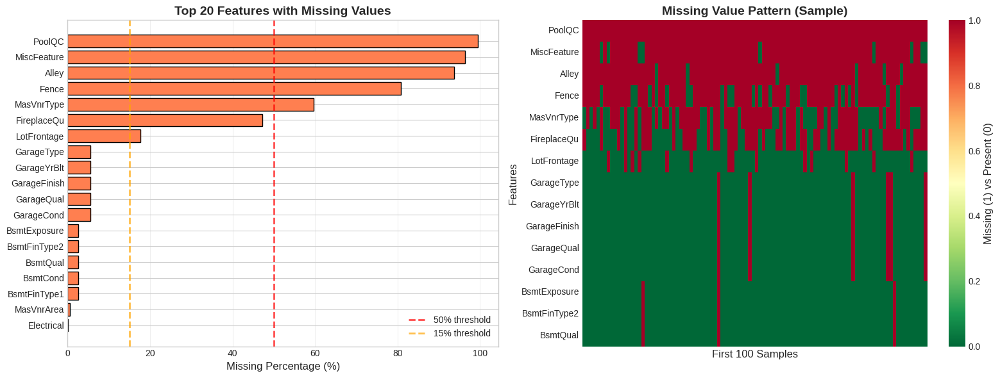


💡 Interpretation Guide:
  Red bars/cells: Missing values
  Green cells: Present values
  Patterns in heatmap indicate systematic missingness (not random)


In [13]:
# ============================================================
# VISUALIZATION: MISSING VALUES PATTERN
# Visual representation of data completeness
# ============================================================

# Create missing value visualization
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Missing value counts
ax1 = axes[0]
if len(missing_df) > 0:
    top_missing = missing_df.head(20)  # Top 20 features with most missing
    ax1.barh(range(len(top_missing)), top_missing['Missing_Percent'], color='coral', edgecolor='black')
    ax1.set_yticks(range(len(top_missing)))
    ax1.set_yticklabels(top_missing['Feature'])
    ax1.set_xlabel('Missing Percentage (%)', fontsize=12)
    ax1.set_title('Top 20 Features with Missing Values', fontsize=14, fontweight='bold')
    ax1.axvline(x=50, color='red', linestyle='--', linewidth=2, alpha=0.7, label='50% threshold')
    ax1.axvline(x=15, color='orange', linestyle='--', linewidth=2, alpha=0.7, label='15% threshold')
    ax1.legend()
    ax1.grid(True, alpha=0.3, axis='x')
    ax1.invert_yaxis()
else:
    ax1.text(0.5, 0.5, 'No Missing Values!', ha='center', va='center', 
             fontsize=16, transform=ax1.transAxes)
    ax1.set_title('Missing Values Analysis', fontsize=14, fontweight='bold')

# Plot 2: Missing value heatmap (sample of data)
ax2 = axes[1]
sample_size = min(100, len(train_data))
sample_data = train_data.head(sample_size)

# Select features with missing values for heatmap
if len(missing_df) > 0:
    features_to_plot = missing_df.head(15)['Feature'].tolist()
    missing_matrix = sample_data[features_to_plot].isnull().astype(int)
    
    sns.heatmap(missing_matrix.T, cmap='RdYlGn_r', cbar=True, 
                yticklabels=features_to_plot, xticklabels=False,
                ax=ax2, cbar_kws={'label': 'Missing (1) vs Present (0)'})
    ax2.set_xlabel(f'First {sample_size} Samples', fontsize=12)
    ax2.set_ylabel('Features', fontsize=12)
    ax2.set_title('Missing Value Pattern (Sample)', fontsize=14, fontweight='bold')
else:
    ax2.text(0.5, 0.5, 'No Missing Values!', ha='center', va='center',
             fontsize=16, transform=ax2.transAxes)
    ax2.set_title('Missing Value Heatmap', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

print("\n💡 Interpretation Guide:")
print("  Red bars/cells: Missing values")
print("  Green cells: Present values")
print("  Patterns in heatmap indicate systematic missingness (not random)")

In [14]:
# ============================================================
# DUPLICATE DETECTION
# Checking for exact and near-duplicate rows
# ============================================================

print("="*70)
print("DUPLICATE DETECTION")
print("="*70)

# Check for exact duplicates
duplicates_all = train_data.duplicated().sum()
duplicates_features = train_data.duplicated(subset=[col for col in train_data.columns if col not in ['Id', 'SalePrice']]).sum()

print(f"\n🔍 EXACT DUPLICATES:")
print(f"  Duplicates (all columns): {duplicates_all}")
print(f"  Duplicates (features only, excluding ID and target): {duplicates_features}")

if duplicates_all > 0:
    print(f"\n⚠️  Found {duplicates_all} duplicate rows!")
    duplicate_rows = train_data[train_data.duplicated(keep=False)]
    print("\nDuplicate rows:")
    print(duplicate_rows[['Id', 'SalePrice']].head(10))
else:
    print("\n✅ No exact duplicates found")

# Check for constant features (all same value)
print(f"\n🔍 CONSTANT FEATURES (no variance):")
constant_features = []
for col in train_data.columns:
    if train_data[col].nunique() == 1:
        constant_features.append(col)

if constant_features:
    print(f"  Found {len(constant_features)} constant features:")
    for feat in constant_features:
        print(f"    - {feat}: all values = {train_data[feat].iloc[0]}")
else:
    print("  ✅ No constant features")

# Check for low-variance features
print(f"\n🔍 LOW-VARIANCE FEATURES (>95% same value):")
low_variance_features = []
for col in train_data.columns:
    if col == 'SalePrice':
        continue
    value_counts = train_data[col].value_counts(normalize=True)
    if len(value_counts) > 0 and value_counts.iloc[0] > 0.95:
        low_variance_features.append((col, value_counts.iloc[0], value_counts.index[0]))

if low_variance_features:
    print(f"  Found {len(low_variance_features)} low-variance features:")
    for feat, percent, value in low_variance_features[:10]:
        print(f"    - {feat}: {percent*100:.1f}% are '{value}'")
else:
    print("  ✅ No low-variance features")

print("="*70)

DUPLICATE DETECTION

🔍 EXACT DUPLICATES:
  Duplicates (all columns): 0
  Duplicates (features only, excluding ID and target): 0

✅ No exact duplicates found

🔍 CONSTANT FEATURES (no variance):
  ✅ No constant features

🔍 LOW-VARIANCE FEATURES (>95% same value):
  Found 12 low-variance features:
    - Street: 99.6% are 'Pave'
    - Utilities: 99.9% are 'AllPub'
    - Condition2: 99.0% are 'Norm'
    - RoofMatl: 98.2% are 'CompShg'
    - Heating: 97.8% are 'GasA'
    - LowQualFinSF: 98.2% are '0'
    - KitchenAbvGr: 95.3% are '1'
    - GarageQual: 95.1% are 'TA'
    - GarageCond: 96.2% are 'TA'
    - 3SsnPorch: 98.4% are '0'


## 3. Exploratory Data Analysis (EDA)
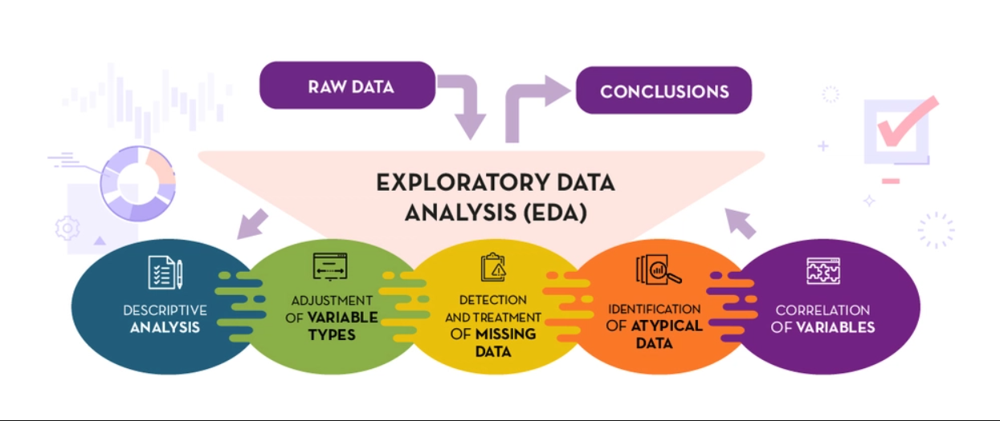
Exploratory Data Analysis is the process of investigating datasets to discover patterns, spot anomalies, test hypotheses, and check assumptions through visual and statistical methods. EDA is not optional—it's the foundation of all subsequent decisions.

---

### 3.1 Why EDA Matters

**EDA Answers Critical Questions:**

| Question | Impact on Modeling |
|----------|-------------------|
| What are the distributions? | Determines if transformations needed |
| Are features correlated? | Identifies multicollinearity, redundancy |
| Are there outliers? | Affects model robustness |
| Are relationships linear? | Guides algorithm selection |
| Do features relate to target? | Prioritizes feature importance |
| Are there data quality issues? | Prevents garbage in, garbage out |

**Without EDA:**
- ❌ Blind preprocessing decisions
- ❌ Missed data quality issues
- ❌ Ineffective feature engineering
- ❌ Poor model performance
- ❌ Unexplainable results

**With EDA:**
- ✅ Informed preprocessing strategy
- ✅ Early problem detection
- ✅ Targeted feature engineering
- ✅ Better model selection
- ✅ Interpretable insights

---

### 3.2 Three Levels of EDA

**1. Univariate Analysis (Single Variable)**

Examine each feature independently:

| Analysis Type | Purpose | Methods |
|--------------|---------|---------|
| **Distribution** | Understand central tendency, spread, shape | Histogram, boxplot, density plot |
| **Statistics** | Quantify properties | Mean, median, std, skewness, kurtosis |
| **Outliers** | Identify extreme values | Z-score, IQR method |
| **Cardinality** | Count unique values | `.nunique()`, value counts |

---

**2. Bivariate Analysis (Two Variables)**

Explore relationships between pairs:

| Analysis Type | Purpose | Methods |
|--------------|---------|---------|
| **Correlation** | Measure linear relationships | Correlation matrix, scatter plots |
| **Association** | Categorical relationships | Chi-square test, cramér's V |
| **Feature-Target** | Feature importance signals | Scatter plots, box plots by target |
| **Distributions by Group** | Compare subgroups | Grouped histograms, violin plots |

---

**3. Multivariate Analysis (Multiple Variables)**

Understand complex interactions:

| Analysis Type | Purpose | Methods |
|--------------|---------|---------|
| **Feature Interactions** | Identify combined effects | Interaction plots, 3D visualizations |
| **Dimensionality Reduction** | Visualize high-dimensional data | PCA, t-SNE (for visualization) |
| **Clustering** | Discover natural groupings | K-means on feature space |
| **Correlation Networks** | Feature relationship structure | Network graphs |

---

### 3.3 Target Variable Analysis (SalePrice)

**Critical for Regression:**

Understanding target distribution guides:
- Loss function selection (MSE sensitive to outliers)
- Transformation needs (log transform for right-skew)
- Evaluation metric choice (MAE vs RMSE)
- Model selection (robust vs standard models)

**Key Metrics:**

| Metric | Interpretation |
|--------|----------------|
| **Skewness** | 0 = symmetric, >1 = right-skewed, <-1 = left-skewed |
| **Kurtosis** | 3 = normal, >3 = heavy tails (outliers), <3 = light tails |
| **Range** | Max - Min, indicates scale |
| **IQR** | Q3 - Q1, robust measure of spread |

**Common Issues:**

- **Right-skewed prices:** Log transform often helps
- **Outliers:** Consider robust regression or winsorization
- **Bimodal distribution:** May indicate distinct subgroups

---

### 3.4 Numerical Feature Analysis

**Distribution Shapes:**

| Shape | Characteristics | Common Causes | Action |
|-------|----------------|---------------|--------|
| **Normal** | Symmetric, bell-shaped | Natural variation, CLT | No transformation needed |
| **Right-skewed** | Long tail to right | Prices, income, counts | Log, sqrt transform |
| **Left-skewed** | Long tail to left | Percentages near 100% | Square, exponential transform |
| **Bimodal** | Two peaks | Mixed populations | Consider splitting feature |
| **Uniform** | Flat distribution | Random processes | May lack information |

**Outlier Detection Methods:**
```
1. Z-Score Method:
   Outlier if |z| > 3 (or 2.5 for stricter)
   z = (x - μ) / σ

2. IQR Method:
   Q1 = 25th percentile
   Q3 = 75th percentile
   IQR = Q3 - Q1
   Outlier if x < Q1 - 1.5×IQR or x > Q3 + 1.5×IQR

3. Domain-Based:
   Values impossible in real world (e.g., age = 200)
```

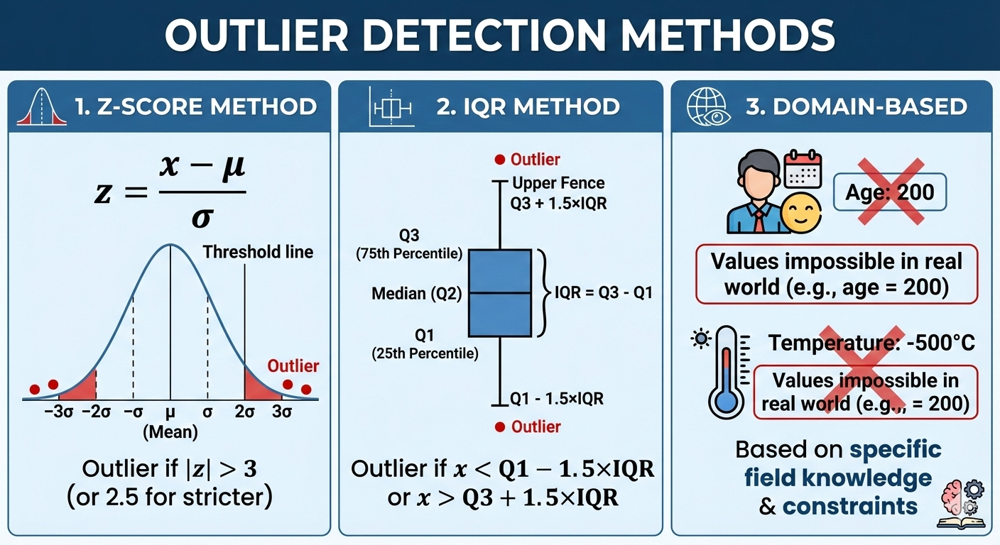
---

### 3.5 Categorical Feature Analysis

**Key Questions:**

| Question | Method | Decision |
|----------|--------|----------|
| How many unique values? | `.nunique()` | High cardinality → grouping needed |
| What's the frequency? | `.value_counts()` | Rare categories → combine or drop |
| Is there order? | Domain knowledge | Ordinal → label encode; Nominal → one-hot |
| Do levels predict target? | Group means | High predictive → keep; Low → drop |

**Cardinality Guidelines:**

| Cardinality | Action | Reasoning |
|-------------|--------|-----------|
| 2-5 values | One-hot encode | Low dimensionality increase |
| 5-20 values | One-hot or target encode | Moderate expansion acceptable |
| 20-50 values | Target encode, frequency encode | One-hot too expensive |
| 50+ values | Group rare categories, hash encoding | High cardinality problem |

---

### 3.6 Correlation Analysis
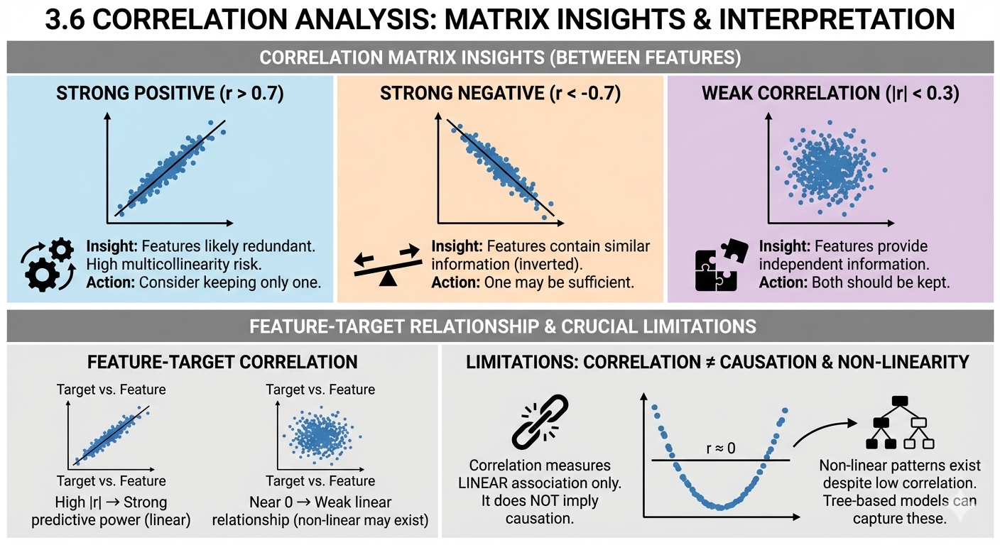
**Correlation Matrix Insights:**

**Strong Positive Correlation (r > 0.7):**
- Features likely redundant
- Consider keeping only one
- May indicate multicollinearity

**Strong Negative Correlation (r < -0.7):**
- Features contain similar information (inverted)
- One may be sufficient

**Weak Correlation (|r| < 0.3):**
- Features provide independent information
- Both should be kept

**Feature-Target Correlation:**
- High |r| → Strong predictive power
- Near 0 → Weak linear relationship (non-linear may exist)

**Correlation ≠ Causation:**
- Correlation measures linear association only
- Non-linear relationships may exist despite low correlation
- Tree-based models can capture non-linear patterns

---

### 3.7 Visual EDA Checklist

**Must-Have Visualizations:**

✅ **Target Variable:**
- [ ] Histogram (distribution shape)
- [ ] Box plot (outliers)
- [ ] Q-Q plot (normality check)

✅ **Numerical Features:**
- [ ] Distribution plots (top 10 important features)
- [ ] Correlation heatmap
- [ ] Scatter plots vs target (top predictors)
- [ ] Pair plot (selected features)

✅ **Categorical Features:**
- [ ] Count plots (frequency)
- [ ] Box plots by category (target relationship)
- [ ] Bar plots of mean target by category

✅ **Missing Values:**
- [ ] Missing value bar chart
- [ ] Missing value heatmap

---

### 3.8 Statistical Tests

**When to Use:**

| Test | Purpose | When to Apply |
|------|---------|---------------|
| **Shapiro-Wilk** | Test normality | Before assuming normal distribution |
| **Levene's Test** | Test equal variances | Before ANOVA, t-tests |
| **Chi-Square** | Test categorical independence | Feature-target association |
| **ANOVA** | Compare means across groups | Categorical feature effect on numerical target |
| **T-Test** | Compare two group means | Binary feature effect on target |

**P-Value Interpretation:**
```
p < 0.05: Reject null hypothesis (significant relationship)
p ≥ 0.05: Fail to reject null hypothesis (no significant evidence)
```

**Caution:** With large samples, even tiny effects become "significant". Always consider effect size, not just p-values.

---

In [15]:
# ============================================================
# TARGET VARIABLE ANALYSIS (SalePrice)
# Comprehensive analysis of distribution and statistics
# ============================================================

target = train_data['SalePrice']

print("="*70)
print("TARGET VARIABLE ANALYSIS: SalePrice")
print("="*70)

# Descriptive statistics
print("\n📊 DESCRIPTIVE STATISTICS:")
print(f"  Count: {target.count():,}")
print(f"  Mean: ${target.mean():,.2f}")
print(f"  Median: ${target.median():,.2f}")
print(f"  Std Dev: ${target.std():,.2f}")
print(f"  Min: ${target.min():,.2f}")
print(f"  Max: ${target.max():,.2f}")
print(f"  Range: ${target.max() - target.min():,.2f}")

# Quartiles
print(f"\n📈 QUARTILES:")
print(f"  Q1 (25%): ${target.quantile(0.25):,.2f}")
print(f"  Q2 (50%): ${target.quantile(0.50):,.2f}")
print(f"  Q3 (75%): ${target.quantile(0.75):,.2f}")
print(f"  IQR: ${target.quantile(0.75) - target.quantile(0.25):,.2f}")

# Skewness and Kurtosis
skewness = target.skew()
kurt = target.kurtosis()

print(f"\n📐 DISTRIBUTION SHAPE:")
print(f"  Skewness: {skewness:.4f}", end="")
if skewness > 1:
    print(" → Highly right-skewed")
elif skewness > 0.5:
    print(" → Moderately right-skewed")
elif skewness < -1:
    print(" → Highly left-skewed")
elif skewness < -0.5:
    print(" → Moderately left-skewed")
else:
    print(" → Approximately symmetric")

print(f"  Kurtosis: {kurt:.4f}", end="")
if kurt > 3:
    print(" → Heavy tails (more outliers than normal)")
elif kurt < 3:
    print(" → Light tails (fewer outliers than normal)")
else:
    print(" → Normal-like tails")

# Outliers using IQR method
Q1 = target.quantile(0.25)
Q3 = target.quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers = target[(target < lower_bound) | (target > upper_bound)]

print(f"\n⚠️  OUTLIERS (IQR Method):")
print(f"  Lower bound: ${lower_bound:,.2f}")
print(f"  Upper bound: ${upper_bound:,.2f}")
print(f"  Number of outliers: {len(outliers)} ({len(outliers)/len(target)*100:.2f}%)")

if len(outliers) > 0:
    print(f"  Min outlier: ${outliers.min():,.2f}")
    print(f"  Max outlier: ${outliers.max():,.2f}")

print("="*70)

TARGET VARIABLE ANALYSIS: SalePrice

📊 DESCRIPTIVE STATISTICS:
  Count: 1,460
  Mean: $180,921.20
  Median: $163,000.00
  Std Dev: $79,442.50
  Min: $34,900.00
  Max: $755,000.00
  Range: $720,100.00

📈 QUARTILES:
  Q1 (25%): $129,975.00
  Q2 (50%): $163,000.00
  Q3 (75%): $214,000.00
  IQR: $84,025.00

📐 DISTRIBUTION SHAPE:
  Skewness: 1.8829 → Highly right-skewed
  Kurtosis: 6.5363 → Heavy tails (more outliers than normal)

⚠️  OUTLIERS (IQR Method):
  Lower bound: $3,937.50
  Upper bound: $340,037.50
  Number of outliers: 61 (4.18%)
  Min outlier: $341,000.00
  Max outlier: $755,000.00


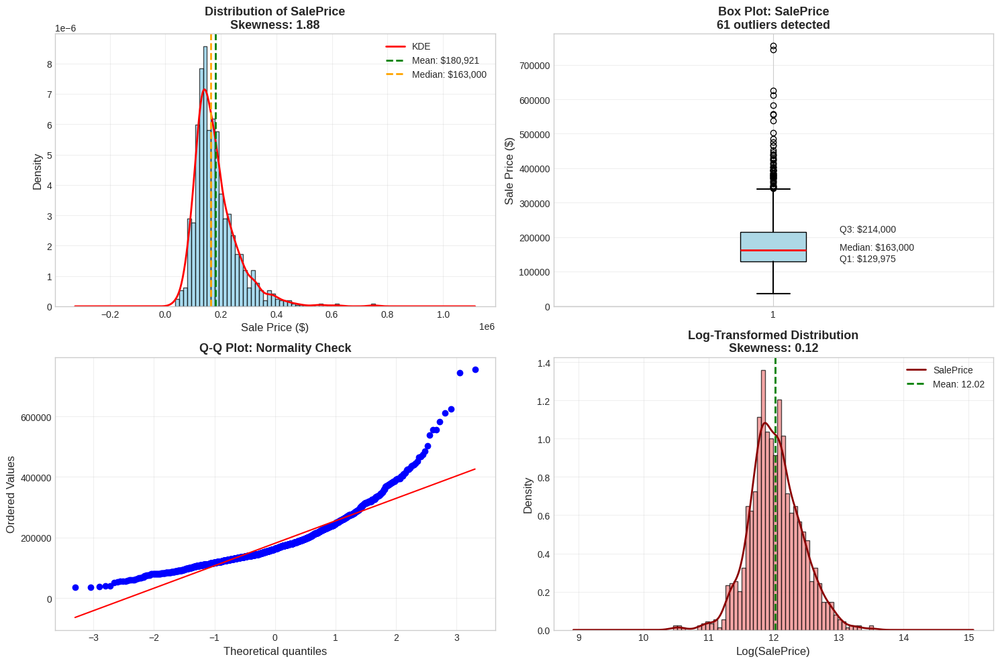


💡 Interpretation:
  - Original skewness: 1.88 (right-skewed)
  - Log-transformed skewness: 0.12 (closer to normal)
  - Q-Q plot: Points deviate from line → not perfectly normal
  - Recommendation: Consider log transformation for modeling


In [16]:
# ============================================================
# VISUALIZATION: TARGET VARIABLE DISTRIBUTION
# Multiple views of SalePrice distribution
# ============================================================

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Plot 1: Histogram with KDE
ax1 = axes[0, 0]
ax1.hist(target, bins=50, color='skyblue', edgecolor='black', alpha=0.7, density=True)
target.plot(kind='kde', ax=ax1, color='red', linewidth=2, label='KDE')
ax1.axvline(target.mean(), color='green', linestyle='--', linewidth=2, label=f'Mean: ${target.mean():,.0f}')
ax1.axvline(target.median(), color='orange', linestyle='--', linewidth=2, label=f'Median: ${target.median():,.0f}')
ax1.set_xlabel('Sale Price ($)', fontsize=12)
ax1.set_ylabel('Density', fontsize=12)
ax1.set_title(f'Distribution of SalePrice\nSkewness: {skewness:.2f}', fontsize=13, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Plot 2: Box plot
ax2 = axes[0, 1]
box = ax2.boxplot(target, vert=True, patch_artist=True, 
                   boxprops=dict(facecolor='lightblue', color='black'),
                   medianprops=dict(color='red', linewidth=2),
                   whiskerprops=dict(color='black', linewidth=1.5),
                   capprops=dict(color='black', linewidth=1.5))
ax2.set_ylabel('Sale Price ($)', fontsize=12)
ax2.set_title(f'Box Plot: SalePrice\n{len(outliers)} outliers detected', fontsize=13, fontweight='bold')
ax2.grid(True, alpha=0.3, axis='y')

# Add annotations
Q1_val = target.quantile(0.25)
Q3_val = target.quantile(0.75)
median_val = target.median()
ax2.text(1.15, median_val, f'Median: ${median_val:,.0f}', fontsize=10)
ax2.text(1.15, Q1_val, f'Q1: ${Q1_val:,.0f}', fontsize=10)
ax2.text(1.15, Q3_val, f'Q3: ${Q3_val:,.0f}', fontsize=10)

# Plot 3: Q-Q plot (Quantile-Quantile)
ax3 = axes[1, 0]
stats.probplot(target, dist="norm", plot=ax3)
ax3.set_title('Q-Q Plot: Normality Check', fontsize=13, fontweight='bold')
ax3.grid(True, alpha=0.3)

# Plot 4: Log-transformed distribution
ax4 = axes[1, 1]
target_log = np.log1p(target)  # log(1 + x) to handle zeros
ax4.hist(target_log, bins=50, color='lightcoral', edgecolor='black', alpha=0.7, density=True)
target_log.plot(kind='kde', ax=ax4, color='darkred', linewidth=2)
skewness_log = target_log.skew()
ax4.axvline(target_log.mean(), color='green', linestyle='--', linewidth=2, label=f'Mean: {target_log.mean():.2f}')
ax4.set_xlabel('Log(SalePrice)', fontsize=12)
ax4.set_ylabel('Density', fontsize=12)
ax4.set_title(f'Log-Transformed Distribution\nSkewness: {skewness_log:.2f}', fontsize=13, fontweight='bold')
ax4.legend()
ax4.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 Interpretation:")
print(f"  - Original skewness: {skewness:.2f} (right-skewed)")
print(f"  - Log-transformed skewness: {skewness_log:.2f} (closer to normal)")
print(f"  - Q-Q plot: Points deviate from line → not perfectly normal")
print(f"  - Recommendation: Consider log transformation for modeling")

In [17]:
# ============================================================
# NUMERICAL FEATURES: DISTRIBUTION ANALYSIS
# Analyze top numerical features by correlation with target
# ============================================================

# Calculate correlations with target
correlations = train_data[numerical_features].corrwith(train_data['SalePrice']).abs().sort_values(ascending=False)

# Select top 10 features most correlated with target
top_features = correlations.head(10).index.tolist()

print("="*70)
print("TOP 10 NUMERICAL FEATURES (by correlation with SalePrice)")
print("="*70)

for i, feat in enumerate(top_features, 1):
    corr_value = train_data[feat].corr(train_data['SalePrice'])
    print(f"  {i:2d}. {feat:<20s} - Correlation: {corr_value:+.4f}")

print("="*70)

# Analyze distribution characteristics of top features
print("\n📊 DISTRIBUTION CHARACTERISTICS:")
print(f"\n{'Feature':<20s} {'Mean':<12s} {'Median':<12s} {'Std':<12s} {'Skewness':<12s}")
print("-"*70)

for feat in top_features:
    mean_val = train_data[feat].mean()
    median_val = train_data[feat].median()
    std_val = train_data[feat].std()
    skew_val = train_data[feat].skew()
    print(f"{feat:<20s} {mean_val:<12.2f} {median_val:<12.2f} {std_val:<12.2f} {skew_val:<12.2f}")

TOP 10 NUMERICAL FEATURES (by correlation with SalePrice)
   1. OverallQual          - Correlation: +0.7910
   2. GrLivArea            - Correlation: +0.7086
   3. GarageCars           - Correlation: +0.6404
   4. GarageArea           - Correlation: +0.6234
   5. TotalBsmtSF          - Correlation: +0.6136
   6. 1stFlrSF             - Correlation: +0.6059
   7. FullBath             - Correlation: +0.5607
   8. TotRmsAbvGrd         - Correlation: +0.5337
   9. YearBuilt            - Correlation: +0.5229
  10. YearRemodAdd         - Correlation: +0.5071

📊 DISTRIBUTION CHARACTERISTICS:

Feature              Mean         Median       Std          Skewness    
----------------------------------------------------------------------
OverallQual          6.10         6.00         1.38         0.22        
GrLivArea            1515.46      1464.00      525.48       1.37        
GarageCars           1.77         2.00         0.75         -0.34       
GarageArea           472.98       480.00     

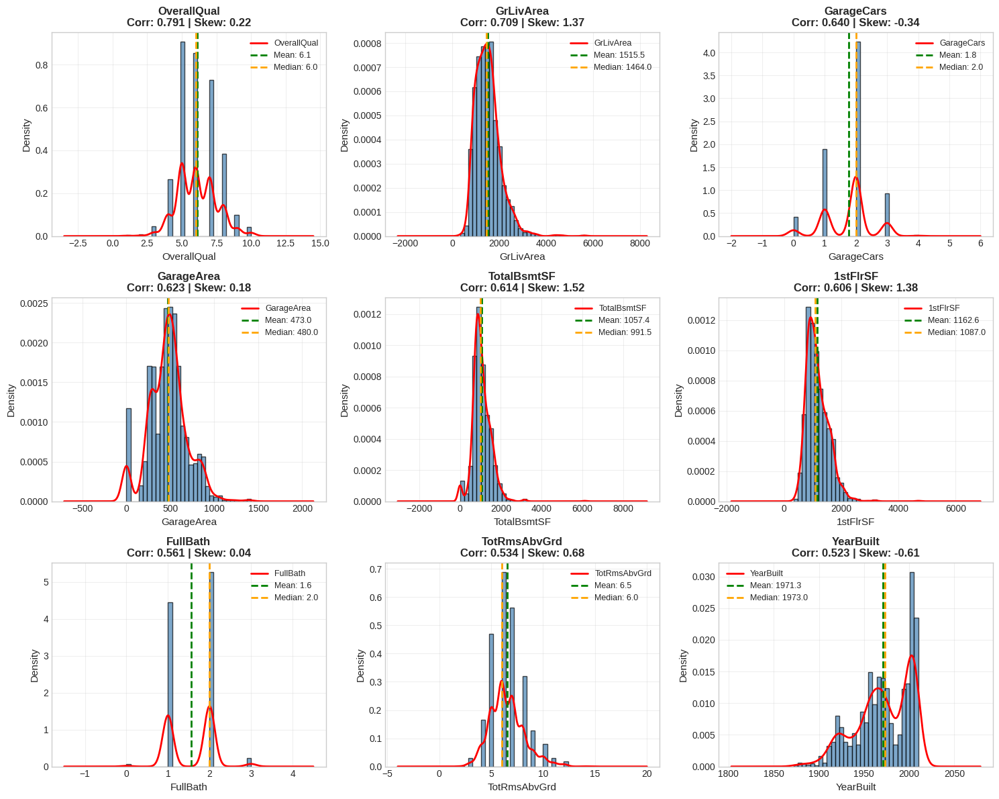

In [18]:
# ============================================================
# VISUALIZATION: NUMERICAL FEATURES DISTRIBUTIONS
# Histograms of top correlated features
# ============================================================

n_features = min(9, len(top_features))
n_cols = 3
n_rows = (n_features + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows*4))
axes = axes.flatten() if n_features > 1 else [axes]

for idx, feat in enumerate(top_features[:n_features]):
    ax = axes[idx]
    
    # Plot histogram with KDE
    ax.hist(train_data[feat].dropna(), bins=30, color='steelblue', 
            edgecolor='black', alpha=0.7, density=True)
    train_data[feat].dropna().plot(kind='kde', ax=ax, color='red', linewidth=2)
    
    # Add mean and median lines
    mean_val = train_data[feat].mean()
    median_val = train_data[feat].median()
    ax.axvline(mean_val, color='green', linestyle='--', linewidth=2, 
               label=f'Mean: {mean_val:.1f}')
    ax.axvline(median_val, color='orange', linestyle='--', linewidth=2,
               label=f'Median: {median_val:.1f}')
    
    # Statistics
    skew_val = train_data[feat].skew()
    corr_val = train_data[feat].corr(train_data['SalePrice'])
    
    ax.set_xlabel(feat, fontsize=11)
    ax.set_ylabel('Density', fontsize=11)
    ax.set_title(f'{feat}\nCorr: {corr_val:.3f} | Skew: {skew_val:.2f}', 
                 fontsize=12, fontweight='bold')
    ax.legend(fontsize=9)
    ax.grid(True, alpha=0.3)

# Hide unused subplots
for idx in range(n_features, len(axes)):
    axes[idx].set_visible(False)

plt.tight_layout()
plt.show()

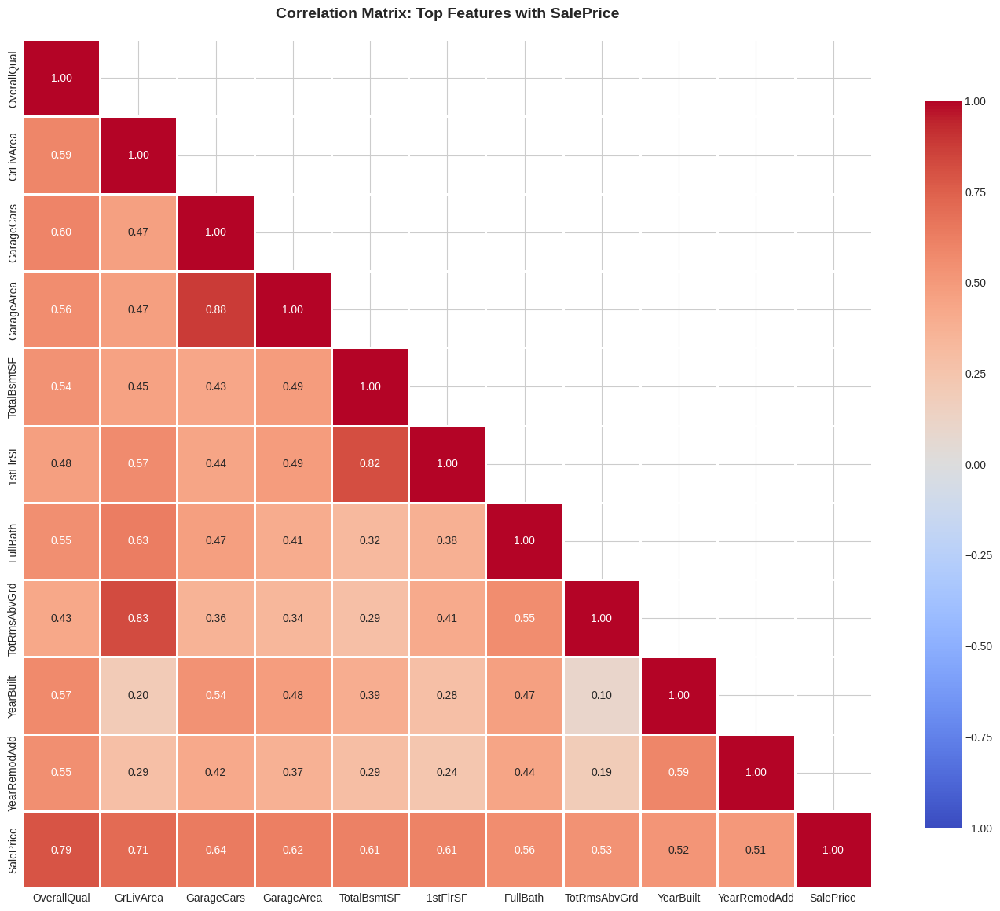


HIGH CORRELATION PAIRS (|r| > 0.7)
  GarageCars           ↔ GarageArea          : +0.8825
  GrLivArea            ↔ TotRmsAbvGrd        : +0.8255
  TotalBsmtSF          ↔ 1stFlrSF            : +0.8195
  OverallQual          ↔ SalePrice           : +0.7910
  GrLivArea            ↔ SalePrice           : +0.7086

⚠️  5 pairs with high correlation detected
  → Consider removing one from each pair to reduce multicollinearity


In [19]:
# ============================================================
# CORRELATION MATRIX ANALYSIS
# Heatmap of feature correlations
# ============================================================

# Calculate correlation matrix for top features + target
features_for_corr = top_features[:15] + ['SalePrice']
corr_matrix = train_data[features_for_corr].corr()

# Create correlation heatmap
fig, ax = plt.subplots(figsize=(14, 12))

# Create mask for upper triangle (to avoid redundancy)
mask = np.triu(np.ones_like(corr_matrix, dtype=bool), k=1)

sns.heatmap(corr_matrix, mask=mask, annot=True, fmt='.2f', 
            cmap='coolwarm', center=0, square=True,
            linewidths=1, cbar_kws={"shrink": 0.8},
            ax=ax, vmin=-1, vmax=1)

ax.set_title('Correlation Matrix: Top Features with SalePrice', 
             fontsize=14, fontweight='bold', pad=20)

plt.tight_layout()
plt.show()

# Identify highly correlated feature pairs (potential multicollinearity)
print("\n" + "="*70)
print("HIGH CORRELATION PAIRS (|r| > 0.7)")
print("="*70)

high_corr_pairs = []
for i in range(len(corr_matrix.columns)):
    for j in range(i+1, len(corr_matrix.columns)):
        corr_val = corr_matrix.iloc[i, j]
        if abs(corr_val) > 0.7:
            feat1 = corr_matrix.columns[i]
            feat2 = corr_matrix.columns[j]
            high_corr_pairs.append((feat1, feat2, corr_val))

if high_corr_pairs:
    for feat1, feat2, corr_val in sorted(high_corr_pairs, key=lambda x: abs(x[2]), reverse=True):
        print(f"  {feat1:<20s} ↔ {feat2:<20s}: {corr_val:+.4f}")
    print(f"\n⚠️  {len(high_corr_pairs)} pairs with high correlation detected")
    print("  → Consider removing one from each pair to reduce multicollinearity")
else:
    print("  ✅ No highly correlated pairs found")

print("="*70)

In [20]:
# ============================================================
# CATEGORICAL FEATURES ANALYSIS
# Understanding cardinality and distribution
# ============================================================

print("="*70)
print("CATEGORICAL FEATURES ANALYSIS")
print("="*70)

# Analyze each categorical feature
categorical_info = []

for feat in categorical_features:
    n_unique = train_data[feat].nunique()
    n_missing = train_data[feat].isnull().sum()
    missing_pct = (n_missing / len(train_data)) * 100
    top_value = train_data[feat].mode()[0] if len(train_data[feat].mode()) > 0 else None
    top_freq = (train_data[feat] == top_value).sum() if top_value else 0
    top_pct = (top_freq / len(train_data)) * 100
    
    categorical_info.append({
        'Feature': feat,
        'Unique': n_unique,
        'Missing': n_missing,
        'Missing_%': missing_pct,
        'Top_Value': top_value,
        'Top_Freq_%': top_pct
    })

cat_df = pd.DataFrame(categorical_info).sort_values('Unique', ascending=False)

print(f"\n{'Feature':<20s} {'Unique':<8s} {'Missing':<10s} {'Miss_%':<8s} {'Top_Value':<15s} {'Top_%':<8s}")
print("-"*70)

for _, row in cat_df.iterrows():
    feat = row['Feature']
    unique = int(row['Unique'])
    missing = int(row['Missing'])
    miss_pct = row['Missing_%']
    top_val = str(row['Top_Value'])[:12]
    top_pct = row['Top_Freq_%']
    print(f"{feat:<20s} {unique:<8d} {missing:<10d} {miss_pct:<8.1f} {top_val:<15s} {top_pct:<8.1f}")

# Categorize by cardinality
print("\n📊 CARDINALITY CATEGORIES:")
low_card = cat_df[cat_df['Unique'] <= 5]
med_card = cat_df[(cat_df['Unique'] > 5) & (cat_df['Unique'] <= 20)]
high_card = cat_df[cat_df['Unique'] > 20]

print(f"  Low Cardinality (≤5): {len(low_card)} features → One-hot encoding")
print(f"  Medium Cardinality (6-20): {len(med_card)} features → One-hot or target encoding")
print(f"  High Cardinality (>20): {len(high_card)} features → Target/frequency encoding")

print("="*70)

CATEGORICAL FEATURES ANALYSIS

Feature              Unique   Missing    Miss_%   Top_Value       Top_%   
----------------------------------------------------------------------
Neighborhood         25       0          0.0      NAmes           15.4    
Exterior2nd          16       0          0.0      VinylSd         34.5    
Exterior1st          15       0          0.0      VinylSd         35.3    
Condition1           9        0          0.0      Norm            86.3    
SaleType             9        0          0.0      WD              86.8    
HouseStyle           8        0          0.0      1Story          49.7    
RoofMatl             8        0          0.0      CompShg         98.2    
Condition2           8        0          0.0      Norm            99.0    
Functional           7        0          0.0      Typ             93.2    
BsmtFinType2         6        38         2.6      Unf             86.0    
RoofStyle            6        0          0.0      Gable           78.2   

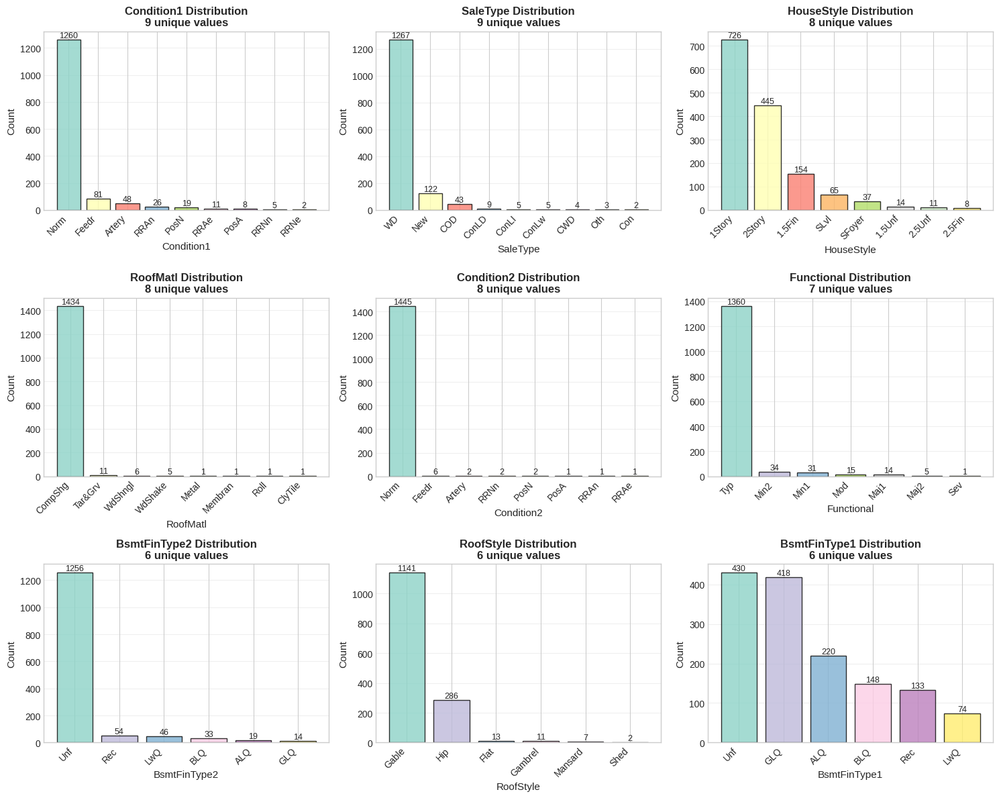

In [21]:
# ============================================================
# VISUALIZATION: CATEGORICAL FEATURES
# Count plots for selected categorical features
# ============================================================

# Select interesting categorical features (low-medium cardinality)
selected_cats = cat_df[cat_df['Unique'] <= 10]['Feature'].head(9).tolist()

n_features = len(selected_cats)
n_cols = 3
n_rows = (n_features + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows*4))
axes = axes.flatten() if n_features > 1 else [axes]

for idx, feat in enumerate(selected_cats):
    ax = axes[idx]
    
    # Count plot
    value_counts = train_data[feat].value_counts().sort_values(ascending=False)
    
    colors = plt.cm.Set3(np.linspace(0, 1, len(value_counts)))
    bars = ax.bar(range(len(value_counts)), value_counts.values, 
                   color=colors, edgecolor='black', alpha=0.8)
    
    ax.set_xticks(range(len(value_counts)))
    ax.set_xticklabels(value_counts.index, rotation=45, ha='right')
    ax.set_xlabel(feat, fontsize=11)
    ax.set_ylabel('Count', fontsize=11)
    ax.set_title(f'{feat} Distribution\n{len(value_counts)} unique values', 
                 fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3, axis='y')
    
    # Add value labels on bars
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height)}',
                ha='center', va='bottom', fontsize=9)

# Hide unused subplots
for idx in range(n_features, len(axes)):
    axes[idx].set_visible(False)

plt.tight_layout()
plt.show()

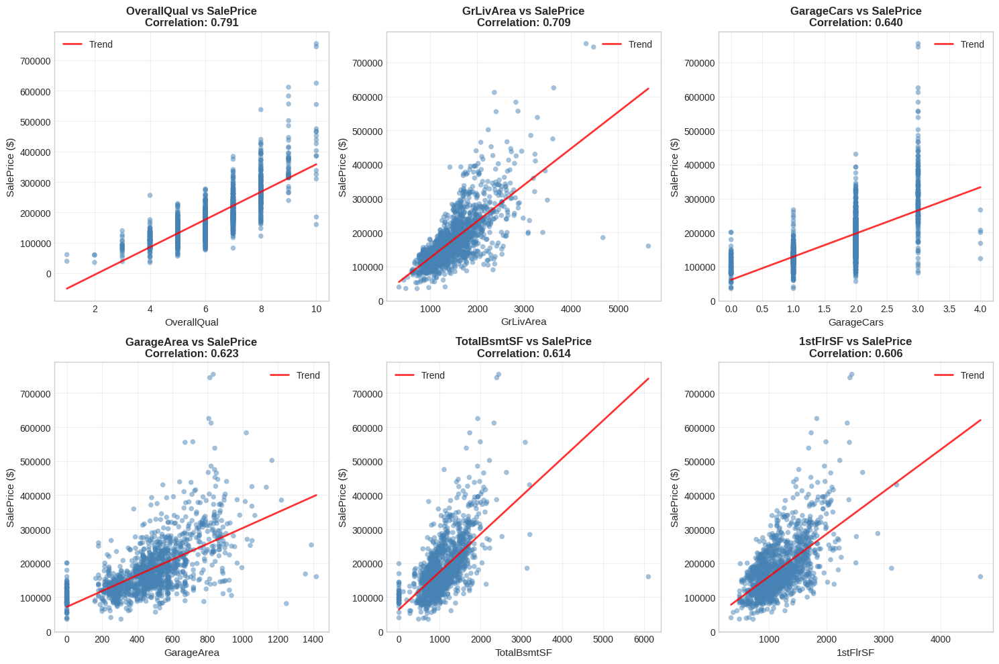


💡 Interpretation:
  - Strong positive slope: Feature increases → Price increases
  - Tight clustering around line: Strong linear relationship
  - Scattered points: Weak or non-linear relationship


In [22]:
# ============================================================
# FEATURE-TARGET RELATIONSHIP: NUMERICAL FEATURES
# Scatter plots showing relationship with SalePrice
# ============================================================

# Select top 6 features by correlation
top_6_features = correlations.head(6).index.tolist()

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for idx, feat in enumerate(top_6_features):
    ax = axes[idx]
    
    # Scatter plot
    x = train_data[feat]
    y = train_data['SalePrice']
    
    # Remove NaN values for plotting
    mask = ~(x.isnull() | y.isnull())
    x_clean = x[mask]
    y_clean = y[mask]
    
    ax.scatter(x_clean, y_clean, alpha=0.5, s=30, color='steelblue', edgecolor='none')
    
    # Add trend line
    if len(x_clean) > 0:
        z = np.polyfit(x_clean, y_clean, 1)
        p = np.poly1d(z)
        ax.plot(x_clean.sort_values(), p(x_clean.sort_values()), 
                "r-", linewidth=2, alpha=0.8, label='Trend')
    
    # Calculate correlation
    corr_val = x.corr(y)
    
    ax.set_xlabel(feat, fontsize=11)
    ax.set_ylabel('SalePrice ($)', fontsize=11)
    ax.set_title(f'{feat} vs SalePrice\nCorrelation: {corr_val:.3f}', 
                 fontsize=12, fontweight='bold')
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 Interpretation:")
print("  - Strong positive slope: Feature increases → Price increases")
print("  - Tight clustering around line: Strong linear relationship")
print("  - Scattered points: Weak or non-linear relationship")

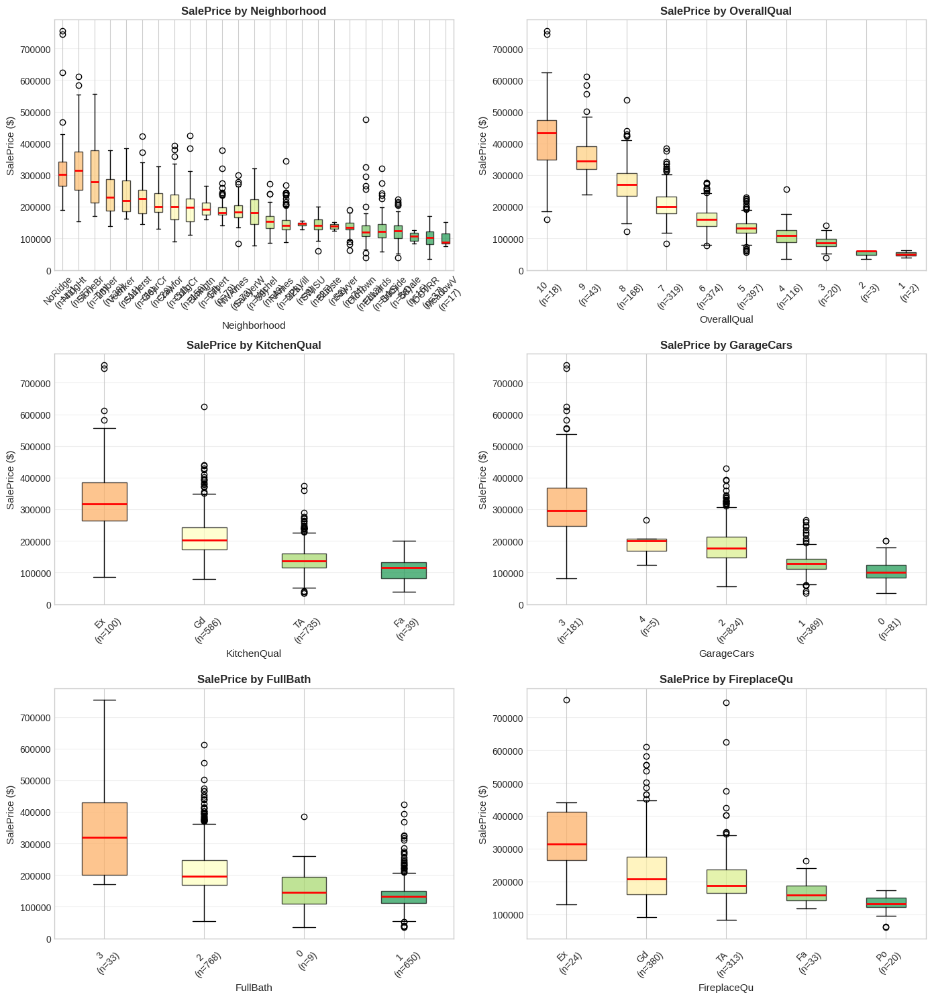


💡 Interpretation:
  - Higher boxes: Higher price ranges
  - Box width (IQR): Price variability within category
  - Outliers (dots): Unusual prices for that category
  - Categories sorted by mean price (left to right)


In [23]:
# ============================================================
# FEATURE-TARGET RELATIONSHIP: CATEGORICAL FEATURES
# Box plots showing SalePrice distribution by category
# ============================================================

# Select categorical features with reasonable cardinality
selected_cats_analysis = ['Neighborhood', 'OverallQual', 'KitchenQual', 
                          'GarageCars', 'FullBath', 'FireplaceQu']

# Filter to features that exist in dataset
selected_cats_analysis = [f for f in selected_cats_analysis if f in train_data.columns][:6]

n_features = len(selected_cats_analysis)
n_cols = 2
n_rows = (n_features + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, n_rows*5))
axes = axes.flatten() if n_features > 1 else [axes]

for idx, feat in enumerate(selected_cats_analysis):
    ax = axes[idx]
    
    # Prepare data
    data_to_plot = train_data[[feat, 'SalePrice']].dropna()
    
    # Calculate mean price per category
    mean_prices = data_to_plot.groupby(feat)['SalePrice'].mean().sort_values(ascending=False)
    
    # Create box plot with categories sorted by mean price
    data_to_plot_sorted = []
    labels = []
    for cat in mean_prices.index:
        data_to_plot_sorted.append(data_to_plot[data_to_plot[feat] == cat]['SalePrice'].values)
        labels.append(f"{cat}\n(n={len(data_to_plot[data_to_plot[feat] == cat])})")
    
    bp = ax.boxplot(data_to_plot_sorted, labels=labels, patch_artist=True,
                     boxprops=dict(facecolor='lightblue', alpha=0.7),
                     medianprops=dict(color='red', linewidth=2))
    
    ax.set_xlabel(feat, fontsize=11)
    ax.set_ylabel('SalePrice ($)', fontsize=11)
    ax.set_title(f'SalePrice by {feat}', fontsize=12, fontweight='bold')
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True, alpha=0.3, axis='y')
    
    # Color boxes by mean price (darker = higher price)
    colors = plt.cm.RdYlGn(np.linspace(0.3, 0.9, len(mean_prices)))
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)

# Hide unused subplots
for idx in range(n_features, len(axes)):
    axes[idx].set_visible(False)

plt.tight_layout()
plt.show()

print("\n💡 Interpretation:")
print("  - Higher boxes: Higher price ranges")
print("  - Box width (IQR): Price variability within category")
print("  - Outliers (dots): Unusual prices for that category")
print("  - Categories sorted by mean price (left to right)")

In [24]:
# ============================================================
# CATEGORICAL FEATURE IMPORTANCE
# Calculate mean target value per category
# ============================================================

print("="*70)
print("CATEGORICAL FEATURE PREDICTIVE POWER")
print("="*70)

# Calculate variance of mean prices across categories for each feature
cat_importance = []

for feat in categorical_features[:15]:  # Analyze first 15 categorical features
    if train_data[feat].isnull().all():
        continue
    
    # Calculate mean price per category
    mean_by_cat = train_data.groupby(feat)['SalePrice'].mean()
    
    # Variance of means (higher = more discriminative)
    variance_of_means = mean_by_cat.var()
    
    # Coefficient of variation
    cv = mean_by_cat.std() / mean_by_cat.mean() if mean_by_cat.mean() > 0 else 0
    
    cat_importance.append({
        'Feature': feat,
        'Variance_of_Means': variance_of_means,
        'CoV': cv,
        'N_Categories': train_data[feat].nunique()
    })

importance_df = pd.DataFrame(cat_importance).sort_values('Variance_of_Means', ascending=False)

print(f"\n{'Feature':<20s} {'Variance':<15s} {'CoV':<10s} {'N_Cat':<8s} {'Power'}")
print("-"*70)

for _, row in importance_df.head(15).iterrows():
    feat = row['Feature']
    var = row['Variance_of_Means']
    cov = row['CoV']
    n_cat = int(row['N_Categories'])
    
    # Determine predictive power
    if var > 1e10:
        power = "Very High"
    elif var > 1e9:
        power = "High"
    elif var > 1e8:
        power = "Medium"
    else:
        power = "Low"
    
    print(f"{feat:<20s} {var:<15.2e} {cov:<10.4f} {n_cat:<8d} {power}")

print("\n💡 Interpretation:")
print("  Variance of Means: How much mean price varies across categories")
print("  High variance → Feature strongly predicts price")
print("  Low variance → Feature weakly predicts price")

print("="*70)

CATEGORICAL FEATURE PREDICTIVE POWER

Feature              Variance        CoV        N_Cat    Power
----------------------------------------------------------------------
Condition2           7.11e+09        0.4677     8        High
RoofMatl             6.37e+09        0.3721     8        High
Neighborhood         4.45e+09        0.3627     25       High
MSZoning             3.09e+09        0.3767     5        High
LandContour          1.40e+09        0.1975     4        High
HouseStyle           1.37e+09        0.2249     8        High
Street               1.30e+09        0.2314     2        High
Condition1           1.21e+09        0.1923     9        High
Alley                1.05e+09        0.2231     2        High
LotShape             9.82e+08        0.1516     4        Medium
Utilities            9.44e+08        0.1930     2        Medium
RoofStyle            8.40e+08        0.1526     6        Medium
BldgType             7.97e+08        0.1843     5        Medium
LotConfig     

## 4. Missing Values - Deep Dive

Missing data is one of the most common data quality issues and requires careful handling. The approach depends on the type of missingness and the context.

---

### 4.1 Types of Missingness

**Understanding WHY data is missing is crucial for choosing the right imputation strategy.**

| Type | Full Name | Description | Example | Handling |
|------|-----------|-------------|---------|----------|
| **MCAR** | Missing Completely At Random | Missing values are random, no pattern | Sensor malfunction randomly | Simple imputation safe |
| **MAR** | Missing At Random | Missingness depends on observed data | Young people less likely to report income | Model-based imputation |
| **MNAR** | Missing Not At Random | Missingness depends on unobserved data | High earners hide income | Difficult, may need domain knowledge |

---

### 4.2 Missingness Detection Strategies

**How to Diagnose Missingness Type:**
```python
# MCAR Test: Chi-square test
# If p > 0.05, likely MCAR

# MAR Detection: 
# Check if missingness correlates with other variables

# MNAR Detection:
# Domain knowledge, patterns in what's missing
```

**Real-World Patterns:**

- **Structural Missingness:** Feature doesn't apply (e.g., "GarageArea" missing when "HasGarage" = No)
- **Intentional Missing:** Survey questions skipped intentionally
- **Data Collection Issue:** Systematic problems during data gathering
- **Encoding Issue:** Missing represented as special values (999, -1, "NA")

---

### 4.3 Handling Strategies

**Decision Tree:**
```
Is missingness > 50%?
  YES → Consider dropping feature
  NO → Continue
    ↓
Is it MCAR?
  YES → Simple imputation (mean/median/mode)
  NO → Continue
    ↓
Is it MAR?
  YES → Model-based imputation (KNN, iterative)
  NO → MNAR
    ↓
Domain knowledge available?
  YES → Custom imputation based on domain
  NO → Flag as missing (create indicator variable)
```

---

### 4.4 Imputation Methods

**For Numerical Features:**

| Method | When to Use | Pros | Cons |
|--------|-------------|------|------|
| **Mean** | MCAR, symmetric distribution | Simple, fast | Reduces variance, sensitive to outliers |
| **Median** | MCAR, skewed distribution | Robust to outliers | Reduces variance |
| **Mode** | Discrete, few unique values | Preserves most common value | Ignores distribution |
| **Forward Fill** | Time series | Preserves temporal logic | Propagates errors |
| **Interpolation** | Time series, ordered data | Smooth transitions | Assumes linearity |
| **KNN Imputation** | MAR, correlated features | Uses feature relationships | Computationally expensive |
| **Iterative (MICE)** | MAR, complex relationships | Most sophisticated | Slow, complex |

**For Categorical Features:**

| Method | When to Use | Pros | Cons |
|--------|-------------|------|------|
| **Mode** | Low missingness | Simple | Ignores relationships |
| **New Category** | MNAR, informative missingness | Preserves information | Increases cardinality |
| **Model-Based** | MAR, predictable from other features | Uses relationships | Complex |

---

### 4.5 Special Considerations

**When to Drop:**

- Feature has >50% missing values AND low importance
- Missingness is MNAR and can't be modeled
- Feature is not critical to problem

**When to Create Indicator:**
```python
# Create "was_missing" indicator
df['Feature_was_missing'] = df['Feature'].isnull().astype(int)
```

Useful when:
- Missingness itself is predictive
- MNAR suspected
- Want to preserve information about missingness

**Domain-Specific Imputation:**

House Prices example:
- `GarageArea` missing → Likely no garage → Impute with 0
- `PoolQC` missing → Likely no pool → Impute with "None"
- `LotFrontage` missing → Impute with neighborhood median (houses in same area similar)

---

### 4.6 Imputation Best Practices

✅ **DO:**
- Understand WHY data is missing
- Visualize missingness patterns
- Impute separately on train and test (fit on train, apply to test)
- Document all imputation decisions
- Check distribution before and after imputation
- Create indicators for informative missingness

❌ **DON'T:**
- Fit imputation on entire dataset (causes leakage)
- Use mean imputation blindly
- Ignore missingness patterns
- Drop features without investigation
- Assume all missingness is MCAR

---

### 4.7 House Prices Dataset - Missing Value Strategy

Based on data dictionary and domain knowledge:

| Feature | Missing % | Type | Strategy |
|---------|-----------|------|----------|
| **PoolQC** | 99.5% | Structural | "None" (no pool) |
| **MiscFeature** | 96% | Structural | "None" |
| **Alley** | 93% | Structural | "None" (no alley access) |
| **Fence** | 80% | Structural | "None" (no fence) |
| **FireplaceQu** | 47% | Structural | "None" (no fireplace) |
| **LotFrontage** | 17% | MAR | Median by neighborhood |
| **GarageX** | 5-6% | Structural | 0 or "None" if no garage |
| **BasementX** | 2-3% | Structural | 0 or "None" if no basement |

**Key Insight:** Many "missing" values are actually "None" - the feature doesn't apply!

---

In [25]:
# ============================================================
# MISSING VALUES: DETAILED ANALYSIS
# Checking patterns and relationships
# ============================================================

# Re-examine missing values with more detail
missing_analysis = []

for col in train_data.columns:
    if train_data[col].isnull().sum() > 0:
        missing_count = train_data[col].isnull().sum()
        missing_pct = (missing_count / len(train_data)) * 100
        dtype = train_data[col].dtype
        
        # Check if all missing values in one category (structural)
        if col in categorical_features:
            # Most common non-null value
            mode_val = train_data[col].mode()[0] if len(train_data[col].dropna()) > 0 else None
        else:
            mode_val = None
        
        missing_analysis.append({
            'Feature': col,
            'Missing': missing_count,
            'Percent': missing_pct,
            'Type': 'Categorical' if dtype == 'object' else 'Numerical',
            'Mode': mode_val
        })

missing_detail_df = pd.DataFrame(missing_analysis).sort_values('Percent', ascending=False)

print("="*80)
print("MISSING VALUES - DETAILED ANALYSIS")
print("="*80)

print(f"\n{'Feature':<20s} {'Missing':<10s} {'%':<8s} {'Type':<15s} {'Likely Reason'}")
print("-"*80)

for _, row in missing_detail_df.iterrows():
    feat = row['Feature']
    missing = int(row['Missing'])
    pct = row['Percent']
    ftype = row['Type']
    
    # Guess reason based on percentage and name
    if pct > 80:
        reason = "Structural (rare feature)"
    elif pct > 40:
        reason = "Structural or MAR"
    elif pct > 15:
        reason = "Likely MAR"
    else:
        reason = "MCAR or MAR"
    
    print(f"{feat:<20s} {missing:<10d} {pct:<8.1f} {ftype:<15s} {reason}")

print("="*80)

MISSING VALUES - DETAILED ANALYSIS

Feature              Missing    %        Type            Likely Reason
--------------------------------------------------------------------------------
PoolQC               1453       99.5     Categorical     Structural (rare feature)
MiscFeature          1406       96.3     Categorical     Structural (rare feature)
Alley                1369       93.8     Categorical     Structural (rare feature)
Fence                1179       80.8     Categorical     Structural (rare feature)
MasVnrType           872        59.7     Categorical     Structural or MAR
FireplaceQu          690        47.3     Categorical     Structural or MAR
LotFrontage          259        17.7     Numerical       Likely MAR
GarageType           81         5.5      Categorical     MCAR or MAR
GarageYrBlt          81         5.5      Numerical       MCAR or MAR
GarageFinish         81         5.5      Categorical     MCAR or MAR
GarageQual           81         5.5      Categorical   

## 5. Outlier Detection and Treatment

Outliers are data points that significantly deviate from other observations. They can arise from measurement errors, data entry mistakes, or represent legitimate extreme values. Proper handling is crucial as outliers can drastically affect model performance.

---

### 5.1 What Are Outliers?

**Types of Outliers:**

| Type | Definition | Example | Handling |
|------|------------|---------|----------|
| **Statistical Outlier** | Falls outside statistical bounds (e.g., >3 std) | House price $10M in $200K neighborhood | Investigate, may transform or remove |
| **Domain Outlier** | Impossible or implausible value | Age = 200, Bedrooms = 50 | Likely error, correct or remove |
| **Natural Outlier** | Legitimate extreme value | Luxury mansion in dataset | Keep, but may need robust methods |
| **Measurement Error** | Recording/entry mistake | Price = $1 instead of $100,000 | Correct if possible, otherwise remove |

---

### 5.2 Outlier Detection Methods

**1. Statistical Methods:**

**Z-Score Method:**
```
z = (x - μ) / σ
Outlier if |z| > 3 (or 2.5 for stricter)
```

**Pros:** Simple, fast, standardized threshold  
**Cons:** Assumes normal distribution, sensitive to extreme outliers affecting μ and σ

---

**IQR (Interquartile Range) Method:**
```
Q1 = 25th percentile
Q3 = 75th percentile
IQR = Q3 - Q1

Lower fence = Q1 - 1.5 × IQR
Upper fence = Q3 + 1.5 × IQR

Outlier if x < Lower fence OR x > Upper fence
```

**Pros:** Robust (not affected by outliers), works for skewed data  
**Cons:** May flag legitimate extremes in heavy-tailed distributions

---

**Modified Z-Score (Robust):**
```
MAD = Median Absolute Deviation
Modified z = 0.6745 × (x - median) / MAD
Outlier if |modified z| > 3.5
```

**Pros:** Very robust to outliers  
**Cons:** More complex calculation

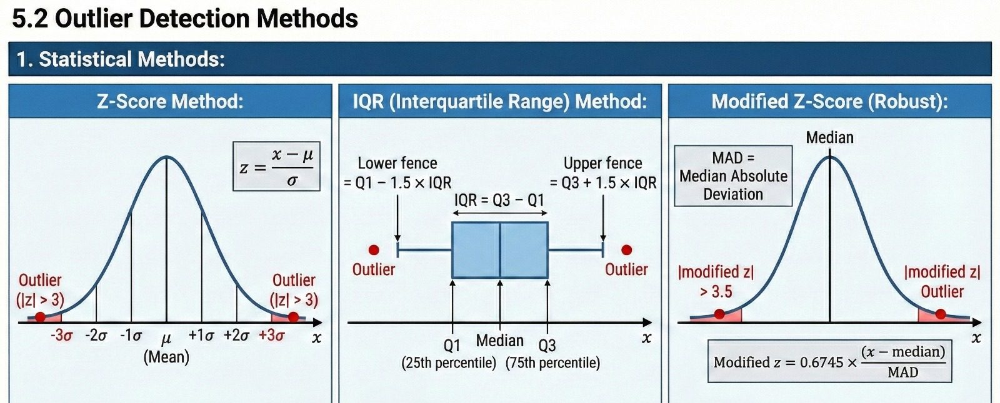
---

**2. Visual Methods:**

| Method | Best For | Interpretation |
|--------|----------|----------------|
| **Box Plot** | Univariate outliers | Points beyond whiskers |
| **Scatter Plot** | Bivariate outliers | Points far from trend |
| **Histogram** | Distribution shape | Isolated bars at extremes |
| **Q-Q Plot** | Normality check | Points deviating from line |

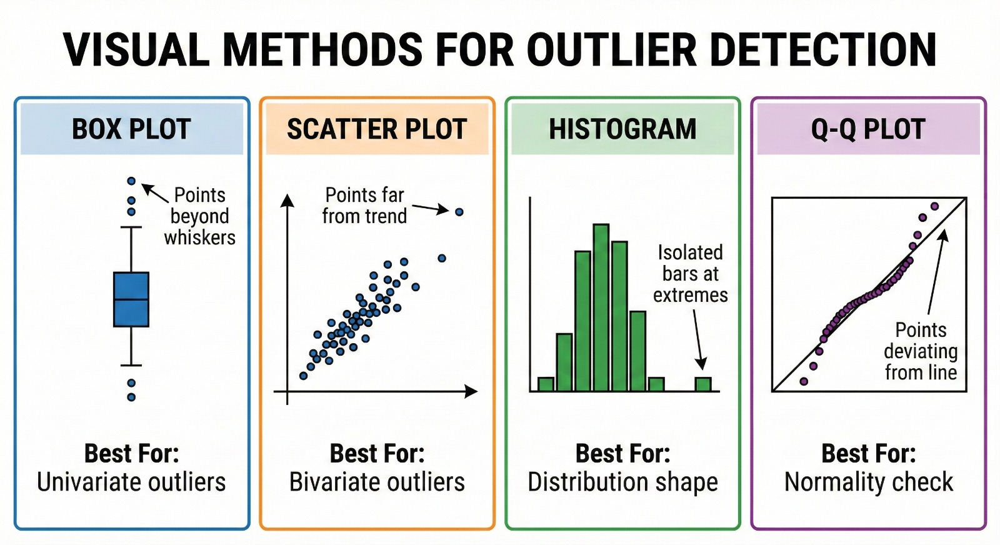

---

### 5.3 Treatment Strategies

**Decision Framework:**
```
Is it a data error?
  YES → Correct or remove
  NO → Continue
    ↓
Is it domain-impossible?
  YES → Remove
  NO → Continue
    ↓
How many outliers?
  <5% → Consider keeping with robust methods
  >5% → Investigate cause
    ↓
Does it affect model?
  Test with/without outliers
  If performance drops → Apply treatment
```

---

**Treatment Methods:**

| Method | When to Use | Implementation |
|--------|-------------|----------------|
| **Remove** | Clear errors, <5% of data | Filter out outliers |
| **Winsorization** | Want to reduce impact | Cap at 1st/99th percentile |
| **Log Transform** | Right-skewed data | `np.log1p(x)` |
| **Sqrt Transform** | Moderate skew | `np.sqrt(x)` |
| **Robust Models** | Many legitimate outliers | Use HuberRegressor, robust scaling |
| **Binning** | Convert to categorical | Create ranges |
| **Imputation** | Replace with threshold | Replace with median or custom value |

---

### 5.4 Model Sensitivity to Outliers

| Model Type | Sensitivity | Reason |
|------------|-------------|--------|
| **Linear Regression** | Very High | MSE loss heavily penalizes large errors |
| **Ridge/Lasso** | High | Still uses MSE, but regularization helps |
| **Decision Trees** | Low | Split-based, not affected by absolute values |
| **Random Forest** | Very Low | Averaging reduces outlier impact |
| **Gradient Boosting** | Medium | Can be tuned for robustness |
| **kNN** | High | Distance-based |
| **SVM** | Medium-High | Depends on kernel and C parameter |

**Key Insight:** If using tree-based models, outliers are less problematic. For linear models, careful outlier treatment is critical.

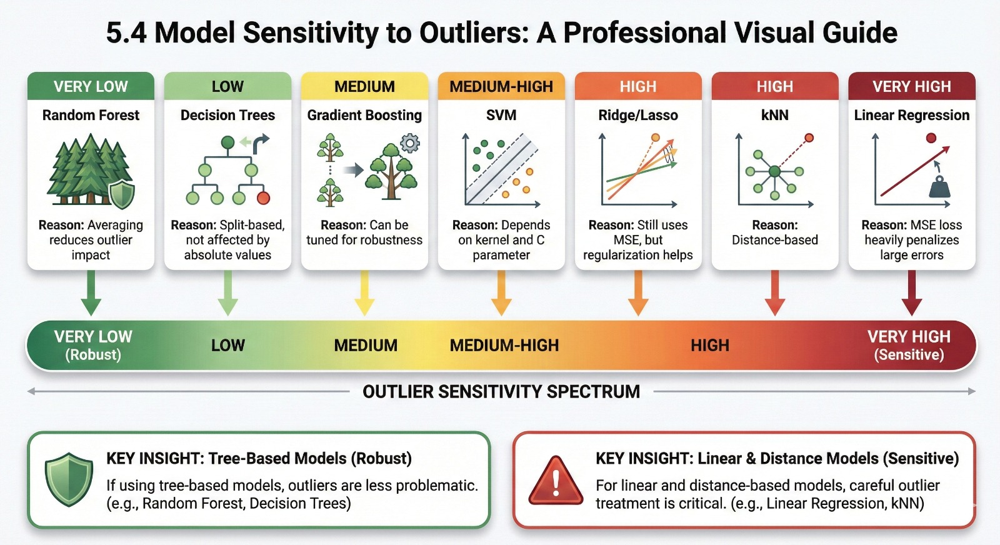

---

### 5.5 Outlier Detection Best Practices

✅ **DO:**
- Visualize before deciding
- Check domain knowledge
- Test model with/without outliers
- Document all decisions
- Use multiple detection methods
- Consider context (luxury homes ARE outliers)

❌ **DON'T:**
- Remove blindly without investigation
- Use only Z-score on skewed data
- Apply same threshold to all features
- Ignore domain knowledge
- Remove >10% of data without justification

---

In [26]:
# ============================================================
# OUTLIER DETECTION: TARGET VARIABLE
# Comprehensive outlier analysis for SalePrice
# ============================================================

target = train_data['SalePrice']

print("="*70)
print("OUTLIER DETECTION: SalePrice")
print("="*70)

# Method 1: IQR Method
Q1 = target.quantile(0.25)
Q3 = target.quantile(0.75)
IQR = Q3 - Q1
lower_fence = Q1 - 1.5 * IQR
upper_fence = Q3 + 1.5 * IQR

outliers_iqr = target[(target < lower_fence) | (target > upper_fence)]

print(f"\n📊 IQR METHOD:")
print(f"  Q1: ${Q1:,.0f}")
print(f"  Q3: ${Q3:,.0f}")
print(f"  IQR: ${IQR:,.0f}")
print(f"  Lower fence: ${lower_fence:,.0f}")
print(f"  Upper fence: ${upper_fence:,.0f}")
print(f"  Outliers detected: {len(outliers_iqr)} ({len(outliers_iqr)/len(target)*100:.2f}%)")

# Method 2: Z-Score Method
mean_price = target.mean()
std_price = target.std()
z_scores = (target - mean_price) / std_price
outliers_zscore = target[abs(z_scores) > 3]

print(f"\n📊 Z-SCORE METHOD (|z| > 3):")
print(f"  Mean: ${mean_price:,.0f}")
print(f"  Std Dev: ${std_price:,.0f}")
print(f"  Outliers detected: {len(outliers_zscore)} ({len(outliers_zscore)/len(target)*100:.2f}%)")

# Method 3: Percentile Method
p1 = target.quantile(0.01)
p99 = target.quantile(0.99)
outliers_percentile = target[(target < p1) | (target > p99)]

print(f"\n📊 PERCENTILE METHOD (< 1st or > 99th):")
print(f"  1st percentile: ${p1:,.0f}")
print(f"  99th percentile: ${p99:,.0f}")
print(f"  Outliers detected: {len(outliers_percentile)} ({len(outliers_percentile)/len(target)*100:.2f}%)")

# Summary
print(f"\n📈 OUTLIER SUMMARY:")
print(f"  Total samples: {len(target)}")
print(f"  IQR outliers: {len(outliers_iqr)}")
print(f"  Z-score outliers: {len(outliers_zscore)}")
print(f"  Percentile outliers: {len(outliers_percentile)}")

# Extreme outliers (multiple methods agree)
extreme_outliers_idx = set(outliers_iqr.index) & set(outliers_zscore.index)
print(f"  Extreme outliers (detected by multiple methods): {len(extreme_outliers_idx)}")

print("="*70)

OUTLIER DETECTION: SalePrice

📊 IQR METHOD:
  Q1: $129,975
  Q3: $214,000
  IQR: $84,025
  Lower fence: $3,938
  Upper fence: $340,038
  Outliers detected: 61 (4.18%)

📊 Z-SCORE METHOD (|z| > 3):
  Mean: $180,921
  Std Dev: $79,443
  Outliers detected: 22 (1.51%)

📊 PERCENTILE METHOD (< 1st or > 99th):
  1st percentile: $61,816
  99th percentile: $442,567
  Outliers detected: 30 (2.05%)

📈 OUTLIER SUMMARY:
  Total samples: 1460
  IQR outliers: 61
  Z-score outliers: 22
  Percentile outliers: 30
  Extreme outliers (detected by multiple methods): 22


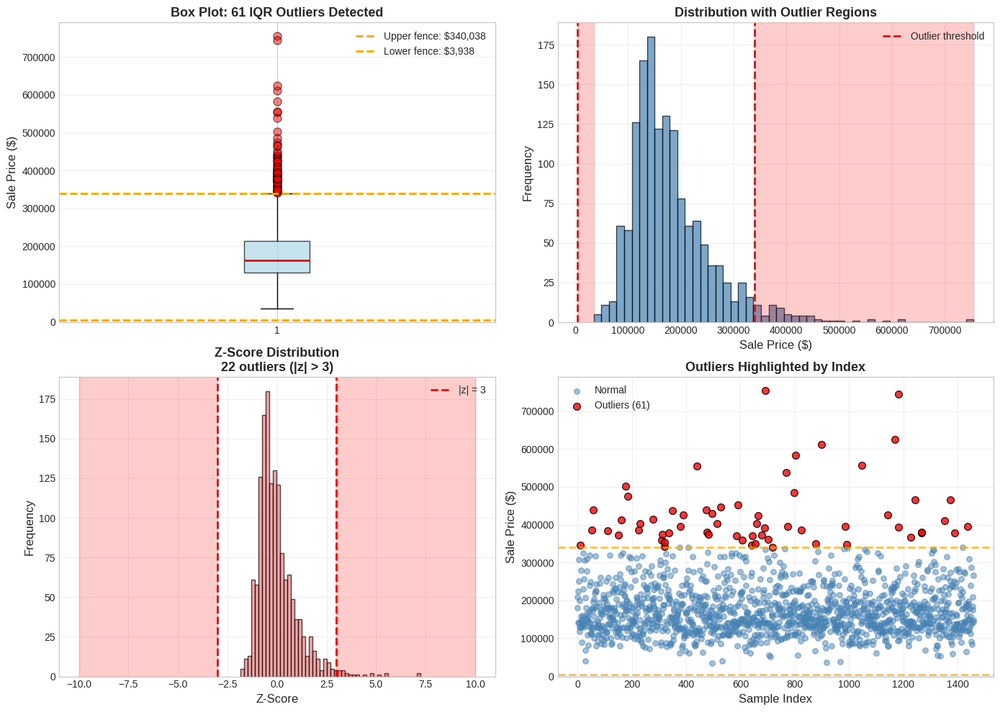

In [27]:
# ============================================================
# VISUALIZATION: OUTLIER DETECTION
# Multiple views of outliers in SalePrice
# ============================================================

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Plot 1: Box plot with outliers highlighted
ax1 = axes[0, 0]
bp = ax1.boxplot(target, vert=True, patch_artist=True,
                  boxprops=dict(facecolor='lightblue', alpha=0.7),
                  medianprops=dict(color='red', linewidth=2),
                  flierprops=dict(marker='o', markerfacecolor='red', markersize=8, alpha=0.5))

ax1.axhline(upper_fence, color='orange', linestyle='--', linewidth=2, label=f'Upper fence: ${upper_fence:,.0f}')
ax1.axhline(lower_fence, color='orange', linestyle='--', linewidth=2, label=f'Lower fence: ${lower_fence:,.0f}')
ax1.set_ylabel('Sale Price ($)', fontsize=12)
ax1.set_title(f'Box Plot: {len(outliers_iqr)} IQR Outliers Detected', fontsize=13, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3, axis='y')

# Plot 2: Histogram with outlier regions shaded
ax2 = axes[0, 1]
ax2.hist(target, bins=50, color='steelblue', edgecolor='black', alpha=0.7)
ax2.axvline(lower_fence, color='red', linestyle='--', linewidth=2, label='Outlier threshold')
ax2.axvline(upper_fence, color='red', linestyle='--', linewidth=2)
ax2.axvspan(target.min(), lower_fence, alpha=0.2, color='red')
ax2.axvspan(upper_fence, target.max(), alpha=0.2, color='red')
ax2.set_xlabel('Sale Price ($)', fontsize=12)
ax2.set_ylabel('Frequency', fontsize=12)
ax2.set_title('Distribution with Outlier Regions', fontsize=13, fontweight='bold')
ax2.legend()
ax2.grid(True, alpha=0.3)

# Plot 3: Z-score distribution
ax3 = axes[1, 0]
ax3.hist(z_scores, bins=50, color='lightcoral', edgecolor='black', alpha=0.7)
ax3.axvline(-3, color='red', linestyle='--', linewidth=2, label='|z| = 3')
ax3.axvline(3, color='red', linestyle='--', linewidth=2)
ax3.axvspan(-10, -3, alpha=0.2, color='red')
ax3.axvspan(3, 10, alpha=0.2, color='red')
ax3.set_xlabel('Z-Score', fontsize=12)
ax3.set_ylabel('Frequency', fontsize=12)
ax3.set_title(f'Z-Score Distribution\n{len(outliers_zscore)} outliers (|z| > 3)', fontsize=13, fontweight='bold')
ax3.legend()
ax3.grid(True, alpha=0.3)

# Plot 4: Scatter plot showing index vs price
ax4 = axes[1, 1]
normal_idx = target.index.difference(outliers_iqr.index)
ax4.scatter(normal_idx, target[normal_idx], alpha=0.5, s=30, color='steelblue', label='Normal')
ax4.scatter(outliers_iqr.index, outliers_iqr, alpha=0.8, s=50, color='red', 
            edgecolor='black', label=f'Outliers ({len(outliers_iqr)})')
ax4.axhline(upper_fence, color='orange', linestyle='--', linewidth=2, alpha=0.7)
ax4.axhline(lower_fence, color='orange', linestyle='--', linewidth=2, alpha=0.7)
ax4.set_xlabel('Sample Index', fontsize=12)
ax4.set_ylabel('Sale Price ($)', fontsize=12)
ax4.set_title('Outliers Highlighted by Index', fontsize=13, fontweight='bold')
ax4.legend()
ax4.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [28]:
# ============================================================
# OUTLIER DETECTION: NUMERICAL FEATURES
# Detecting outliers in top numerical features
# ============================================================

# Select top numerical features for outlier analysis
top_num_features = correlations.head(10).index.tolist()

outlier_counts = {}

print("="*70)
print("OUTLIER DETECTION: NUMERICAL FEATURES (IQR Method)")
print("="*70)

for feat in top_num_features:
    data = train_data[feat].dropna()
    
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    
    outliers = data[(data < lower) | (data > upper)]
    outlier_counts[feat] = len(outliers)
    
    print(f"\n{feat}:")
    print(f"  Range: [{data.min():.1f}, {data.max():.1f}]")
    print(f"  IQR: {IQR:.1f}")
    print(f"  Fences: [{lower:.1f}, {upper:.1f}]")
    print(f"  Outliers: {len(outliers)} ({len(outliers)/len(data)*100:.1f}%)")

# Features with most outliers
sorted_outliers = sorted(outlier_counts.items(), key=lambda x: x[1], reverse=True)

print(f"\n📊 FEATURES WITH MOST OUTLIERS:")
for feat, count in sorted_outliers[:5]:
    pct = (count / len(train_data)) * 100
    print(f"  {feat}: {count} outliers ({pct:.1f}%)")

print("="*70)

OUTLIER DETECTION: NUMERICAL FEATURES (IQR Method)

OverallQual:
  Range: [1.0, 10.0]
  IQR: 2.0
  Fences: [2.0, 10.0]
  Outliers: 2 (0.1%)

GrLivArea:
  Range: [334.0, 5642.0]
  IQR: 647.2
  Fences: [158.6, 2747.6]
  Outliers: 31 (2.1%)

GarageCars:
  Range: [0.0, 4.0]
  IQR: 1.0
  Fences: [-0.5, 3.5]
  Outliers: 5 (0.3%)

GarageArea:
  Range: [0.0, 1418.0]
  IQR: 241.5
  Fences: [-27.8, 938.2]
  Outliers: 21 (1.4%)

TotalBsmtSF:
  Range: [0.0, 6110.0]
  IQR: 502.5
  Fences: [42.0, 2052.0]
  Outliers: 61 (4.2%)

1stFlrSF:
  Range: [334.0, 4692.0]
  IQR: 509.2
  Fences: [118.1, 2155.1]
  Outliers: 20 (1.4%)

FullBath:
  Range: [0.0, 3.0]
  IQR: 1.0
  Fences: [-0.5, 3.5]
  Outliers: 0 (0.0%)

TotRmsAbvGrd:
  Range: [2.0, 14.0]
  IQR: 2.0
  Fences: [2.0, 10.0]
  Outliers: 30 (2.1%)

YearBuilt:
  Range: [1872.0, 2010.0]
  IQR: 46.0
  Fences: [1885.0, 2069.0]
  Outliers: 7 (0.5%)

YearRemodAdd:
  Range: [1950.0, 2010.0]
  IQR: 37.0
  Fences: [1911.5, 2059.5]
  Outliers: 0 (0.0%)

📊 FEATURE

## 6. Encoding Categorical Variables

Machine learning models require numerical inputs. Categorical variables must be encoded (converted to numbers) before modeling. The encoding strategy significantly impacts model performance.

---

### 6.1 Encoding Methods Overview

| Method | Output | Best For | Pros | Cons |
|--------|--------|----------|------|------|
| **Label Encoding** | Single column (0, 1, 2, ...) | Ordinal features, tree-based models | Compact, preserves order | Implies order for nominal |
| **One-Hot Encoding** | N binary columns | Nominal features, linear models | No false order | High dimensionality |
| **Target Encoding** | Single column (mean of target per category) | High cardinality, strong predictive features | Compact, captures relationship | Risk of overfitting/leakage |
| **Frequency Encoding** | Single column (count per category) | High cardinality | Simple, compact | Doesn't capture target relationship |
| **Binary Encoding** | Log₂(N) binary columns | High cardinality | More compact than one-hot | Less interpretable |
| **Ordinal Encoding** | Single column (custom mapping) | Ordinal with specific order | Preserves meaningful order | Requires domain knowledge |

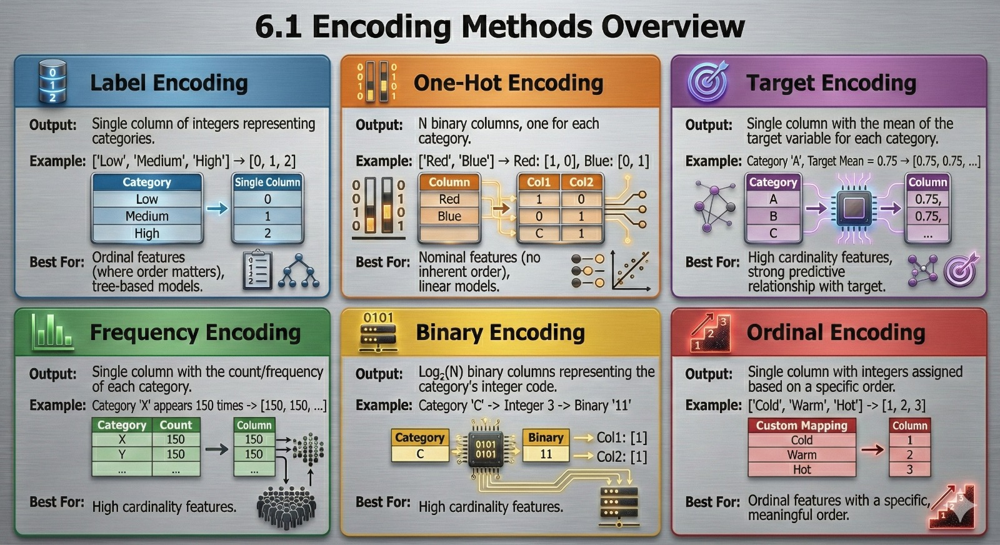

---

### 6.2 Label Encoding

**How it Works:**
```python
['Red', 'Blue', 'Green'] → [0, 1, 2]
```

**When to Use:**
- ✅ Ordinal features (Poor < Fair < Good < Excellent)
- ✅ Tree-based models (handles numerical encoding well)
- ✅ Need compact representation

**When NOT to Use:**
- ❌ Nominal features with linear models (Red ≠ halfway between Blue and Green)
- ❌ Features where order doesn't make sense

**Example:**
```python
# Quality: Ordinal feature
quality_map = {'Poor': 1, 'Fair': 2, 'Good': 3, 'Excellent': 4}
df['Quality_Encoded'] = df['Quality'].map(quality_map)
```

---

### 6.3 One-Hot Encoding

**How it Works:**
```python
Color: ['Red', 'Blue', 'Green']
         ↓
Color_Red:   [1, 0, 0]
Color_Blue:  [0, 1, 0]
Color_Green: [0, 0, 1]
```

**When to Use:**
- ✅ Nominal features (no inherent order)
- ✅ Low cardinality (<20 unique values)
- ✅ Linear models, neural networks

**When NOT to Use:**
- ❌ High cardinality features (creates too many columns)
- ❌ When dimensionality is already high

**Dummy Trap:**
```python
# BAD: Perfect multicollinearity
Color_Red, Color_Blue, Color_Green

# GOOD: Drop one column (drop_first=True)
Color_Blue, Color_Green
# Red can be inferred: if both are 0, it's Red
```

**Example:**
```python
df_encoded = pd.get_dummies(df, columns=['Color'], drop_first=True)
```

---

### 6.4 Target Encoding (Mean Encoding)

**How it Works:**
```python
Neighborhood → Mean(SalePrice) for that neighborhood

OldTown:   $120,000 → encode as 120000
Downtown:  $250,000 → encode as 250000
Suburbs:   $180,000 → encode as 180000
```

**When to Use:**
- ✅ High cardinality categorical features
- ✅ Strong relationship between category and target
- ✅ Tree-based models

**When NOT to Use:**
- ❌ Without proper cross-validation (causes leakage!)
- ❌ Categories with few samples (unreliable means)

**Leakage Prevention:**
```python
# WRONG: Fit on entire training set
mean_encoding = train['SalePrice'].groupby(train['Neighborhood']).mean()

# RIGHT: Use cross-validation
# For each fold:
#   - Calculate means only on training fold
#   - Apply to validation fold
```

**Smoothing for Rare Categories:**
```python
global_mean = target.mean()
category_mean = target.groupby(category).mean()
category_count = category.value_counts()

# Smooth: blend category mean with global mean based on sample size
smoothed = (category_mean * category_count + global_mean * alpha) / (category_count + alpha)
```

---

### 6.5 Encoding Strategy Decision Tree
```
What is the feature type?
    ↓
Ordinal (has order)?
    YES → Label/Ordinal Encoding
    NO → Continue
        ↓
How many unique values?
    ↓
< 5 values
    → One-Hot Encoding (most cases)
    
5-20 values
    → One-Hot (linear models)
    → Target Encoding (tree models)
    
> 20 values
    → Target Encoding
    → Frequency Encoding
    → Binary Encoding
```

---

### 6.6 Model-Specific Recommendations

| Model Family | Recommended Encoding | Reason |
|--------------|---------------------|--------|
| **Linear Models** | One-hot for nominal, label for ordinal | Needs explicit feature separation |
| **Tree-Based** | Label or target encoding | Handles numerical directly, no false ordering issue |
| **Neural Networks** | One-hot or embeddings | Learns representations |
| **k-NN, SVM** | One-hot for nominal | Distance-based, sensitive to scale |
| **Naive Bayes** | Label encoding | Categorical distribution assumptions |

---

### 6.7 Encoding Best Practices

✅ **DO:**
- Understand feature semantics (ordinal vs nominal)
- Use target encoding with cross-validation
- Drop first column in one-hot (avoid dummy trap)
- Handle unseen categories in test set
- Document encoding mappings

❌ **DON'T:**
- Use label encoding for nominal features with linear models
- Target encode without preventing leakage
- One-hot encode high cardinality without consideration
- Forget to apply same encoding to test set

---

### 6.8 Handling Unseen Categories

**Problem:** Test set contains category not seen in training.

**Solutions:**

1. **Frequency threshold:** Group rare categories as "Other"
2. **Default value:** Map unseen to global mean or mode
3. **Separate indicator:** Create "Unknown" category
4. **Drop:** Remove samples with unseen categories (not recommended)
```python
# Example: Frequency threshold
value_counts = train['Category'].value_counts()
common_categories = value_counts[value_counts > 10].index
train['Category'] = train['Category'].apply(
    lambda x: x if x in common_categories else 'Other'
)
```

---

In [29]:
# ============================================================
# ENCODING DEMONSTRATION: LABEL ENCODING
# For ordinal features
# ============================================================

print("="*70)
print("LABEL ENCODING: ORDINAL FEATURES")
print("="*70)

# Identify ordinal features with explicit ordering
ordinal_features = {
    'ExterQual': ['Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'ExterCond': ['Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'BsmtQual': ['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'BsmtCond': ['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'HeatingQC': ['Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'KitchenQual': ['Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'FireplaceQu': ['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'GarageQual': ['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'GarageCond': ['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],
}

# Create a copy for demonstration
train_encoded = train_data.copy()

# Apply ordinal encoding
for feat, order in ordinal_features.items():
    if feat in train_encoded.columns:
        # Create mapping
        mapping = {val: idx for idx, val in enumerate(order)}
        
        # Apply encoding
        train_encoded[f'{feat}_Encoded'] = train_encoded[feat].map(mapping)
        
        print(f"\n{feat}:")
        print(f"  Mapping: {mapping}")
        print(f"  Example values:")
        sample = train_data[[feat]].dropna().head(5)
        sample[f'{feat}_Encoded'] = sample[feat].map(mapping)
        print(sample.to_string(index=False))

print("="*70)

LABEL ENCODING: ORDINAL FEATURES

ExterQual:
  Mapping: {'Po': 0, 'Fa': 1, 'TA': 2, 'Gd': 3, 'Ex': 4}
  Example values:
ExterQual  ExterQual_Encoded
       Gd                  3
       TA                  2
       Gd                  3
       TA                  2
       Gd                  3

ExterCond:
  Mapping: {'Po': 0, 'Fa': 1, 'TA': 2, 'Gd': 3, 'Ex': 4}
  Example values:
ExterCond  ExterCond_Encoded
       TA                  2
       TA                  2
       TA                  2
       TA                  2
       TA                  2

BsmtQual:
  Mapping: {'NA': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5}
  Example values:
BsmtQual  BsmtQual_Encoded
      Gd                 4
      Gd                 4
      Gd                 4
      TA                 3
      Gd                 4

BsmtCond:
  Mapping: {'NA': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5}
  Example values:
BsmtCond  BsmtCond_Encoded
      TA                 3
      TA                 3
      TA    

In [30]:
# ============================================================
# ENCODING DEMONSTRATION: ONE-HOT ENCODING
# For nominal features with low cardinality
# ============================================================

print("="*70)
print("ONE-HOT ENCODING: NOMINAL FEATURES")
print("="*70)

# Select nominal features with reasonable cardinality for demo
nominal_features_demo = ['MSZoning', 'Street', 'LotShape', 'LandContour']
nominal_features_demo = [f for f in nominal_features_demo if f in train_data.columns]

for feat in nominal_features_demo:
    n_unique = train_data[feat].nunique()
    print(f"\n{feat}:")
    print(f"  Unique values: {n_unique}")
    print(f"  Value counts:")
    print(train_data[feat].value_counts().to_string())
    print(f"  → One-hot encoding will create {n_unique - 1} columns (drop_first=True)")

# Perform one-hot encoding
print("\n" + "="*70)
print("ENCODING TRANSFORMATION")
print("="*70)

# Select a few features for demonstration
features_to_encode = ['MSZoning', 'Street']
subset_original = train_data[features_to_encode].head(10).copy()

print("\nORIGINAL DATA:")
print(subset_original.to_string())

# One-hot encode
subset_encoded = pd.get_dummies(subset_original, columns=features_to_encode, drop_first=True)

print("\nONE-HOT ENCODED DATA:")
print(subset_encoded.to_string())

print(f"\n📊 TRANSFORMATION SUMMARY:")
print(f"  Original columns: {len(subset_original.columns)}")
print(f"  Encoded columns: {len(subset_encoded.columns)}")
print(f"  Added columns: {len(subset_encoded.columns) - len(subset_original.columns)}")

print("="*70)

ONE-HOT ENCODING: NOMINAL FEATURES

MSZoning:
  Unique values: 5
  Value counts:
MSZoning
RL         1151
RM          218
FV           65
RH           16
C (all)      10
  → One-hot encoding will create 4 columns (drop_first=True)

Street:
  Unique values: 2
  Value counts:
Street
Pave    1454
Grvl       6
  → One-hot encoding will create 1 columns (drop_first=True)

LotShape:
  Unique values: 4
  Value counts:
LotShape
Reg    925
IR1    484
IR2     41
IR3     10
  → One-hot encoding will create 3 columns (drop_first=True)

LandContour:
  Unique values: 4
  Value counts:
LandContour
Lvl    1311
Bnk      63
HLS      50
Low      36
  → One-hot encoding will create 3 columns (drop_first=True)

ENCODING TRANSFORMATION

ORIGINAL DATA:
  MSZoning Street
0       RL   Pave
1       RL   Pave
2       RL   Pave
3       RL   Pave
4       RL   Pave
5       RL   Pave
6       RL   Pave
7       RL   Pave
8       RM   Pave
9       RL   Pave

ONE-HOT ENCODED DATA:
   MSZoning_RM
0        False
1        

In [31]:
# ============================================================
# ENCODING DEMONSTRATION: TARGET ENCODING
# For high cardinality features
# ============================================================

print("="*70)
print("TARGET ENCODING: HIGH CARDINALITY FEATURES")
print("="*70)

# Neighborhood is a good example (25 unique values)
feature_name = 'Neighborhood'

if feature_name in train_data.columns:
    # Calculate mean price per neighborhood
    neighborhood_means = train_data.groupby(feature_name)['SalePrice'].agg(['mean', 'count']).sort_values('mean', ascending=False)
    
    print(f"\n{feature_name} - Target Encoding:")
    print(f"  Unique values: {train_data[feature_name].nunique()}")
    print(f"\n  Mean SalePrice by Neighborhood:")
    print(f"\n{'Neighborhood':<15s} {'Mean Price':<15s} {'Count':<10s}")
    print("-"*40)
    
    for idx, row in neighborhood_means.iterrows():
        mean_price = row['mean']
        count = int(row['count'])
        print(f"{idx:<15s} ${mean_price:<14,.0f} {count:<10d}")
    
    # Create target encoding
    target_encoding = neighborhood_means['mean'].to_dict()
    train_encoded[f'{feature_name}_TargetEnc'] = train_data[feature_name].map(target_encoding)
    
    print(f"\n💡 Interpretation:")
    print(f"  Highest: {neighborhood_means.index[0]} (${neighborhood_means.iloc[0]['mean']:,.0f})")
    print(f"  Lowest: {neighborhood_means.index[-1]} (${neighborhood_means.iloc[-1]['mean']:,.0f})")
    print(f"  Range: ${neighborhood_means['mean'].max() - neighborhood_means['mean'].min():,.0f}")
    
    # Show correlation with target
    corr_original = 0  # Categorical can't directly correlate
    corr_encoded = train_encoded[f'{feature_name}_TargetEnc'].corr(train_data['SalePrice'])
    
    print(f"\n📊 ENCODING EFFECTIVENESS:")
    print(f"  Correlation with SalePrice (encoded): {corr_encoded:.4f}")
    print(f"  → Target encoding captures the relationship!")

print("="*70)

TARGET ENCODING: HIGH CARDINALITY FEATURES

Neighborhood - Target Encoding:
  Unique values: 25

  Mean SalePrice by Neighborhood:

Neighborhood    Mean Price      Count     
----------------------------------------
NoRidge         $335,295        41        
NridgHt         $316,271        77        
StoneBr         $310,499        25        
Timber          $242,247        38        
Veenker         $238,773        11        
Somerst         $225,380        86        
ClearCr         $212,565        28        
Crawfor         $210,625        51        
CollgCr         $197,966        150       
Blmngtn         $194,871        17        
Gilbert         $192,855        79        
NWAmes          $189,050        73        
SawyerW         $186,556        59        
Mitchel         $156,270        49        
NAmes           $145,847        225       
NPkVill         $142,694        9         
SWISU           $142,591        25        
Blueste         $137,500        2         
Sawyer    

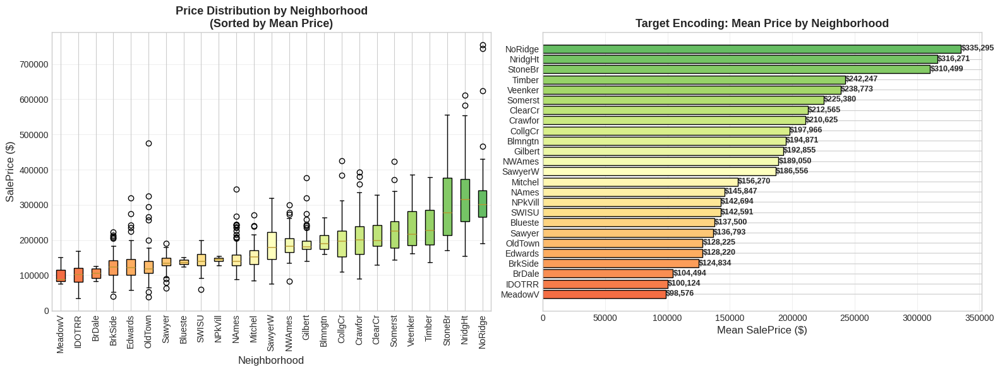


💡 Key Insight:
  The variation in mean prices across Neighborhood categories
  shows why target encoding is effective - it captures this relationship
  in a single numerical feature instead of 25 binary columns.


In [32]:
# ============================================================
# ENCODING COMPARISON VISUALIZATION
# Comparing different encoding strategies
# ============================================================

# Select a categorical feature for comparison
demo_feature = 'Neighborhood'

if demo_feature in train_data.columns:
    # Calculate statistics per category
    stats_by_cat = train_data.groupby(demo_feature)['SalePrice'].agg(['mean', 'count']).sort_values('mean')
    
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Plot 1: Box plot by category (sorted by mean)
    ax1 = axes[0]
    sorted_categories = stats_by_cat.index.tolist()
    data_to_plot = [train_data[train_data[demo_feature] == cat]['SalePrice'].values 
                    for cat in sorted_categories]
    
    bp = ax1.boxplot(data_to_plot, labels=sorted_categories, patch_artist=True)
    
    # Color boxes by mean price
    colors = plt.cm.RdYlGn(np.linspace(0.2, 0.8, len(sorted_categories)))
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)
    
    ax1.set_xlabel(demo_feature, fontsize=12)
    ax1.set_ylabel('SalePrice ($)', fontsize=12)
    ax1.set_title(f'Price Distribution by {demo_feature}\n(Sorted by Mean Price)', 
                  fontsize=13, fontweight='bold')
    ax1.tick_params(axis='x', rotation=90)
    ax1.grid(True, alpha=0.3, axis='y')
    
    # Plot 2: Bar plot of mean prices (target encoding visualization)
    ax2 = axes[1]
    bars = ax2.barh(range(len(stats_by_cat)), stats_by_cat['mean'].values, color=colors, edgecolor='black')
    ax2.set_yticks(range(len(stats_by_cat)))
    ax2.set_yticklabels(stats_by_cat.index)
    ax2.set_xlabel('Mean SalePrice ($)', fontsize=12)
    ax2.set_title(f'Target Encoding: Mean Price by {demo_feature}', 
                  fontsize=13, fontweight='bold')
    ax2.grid(True, alpha=0.3, axis='x')
    
    # Add value labels
    for i, (bar, val) in enumerate(zip(bars, stats_by_cat['mean'].values)):
        ax2.text(val, bar.get_y() + bar.get_height()/2, f'${val:,.0f}', 
                 ha='left', va='center', fontsize=9, fontweight='bold')
    
    plt.tight_layout()
    plt.show()
    
    print("\n💡 Key Insight:")
    print(f"  The variation in mean prices across {demo_feature} categories")
    print(f"  shows why target encoding is effective - it captures this relationship")
    print(f"  in a single numerical feature instead of {len(sorted_categories)} binary columns.")

## 7. Feature Scaling

Feature scaling transforms features to a common scale. This is crucial for distance-based algorithms and gradient descent optimization but unnecessary for tree-based models.

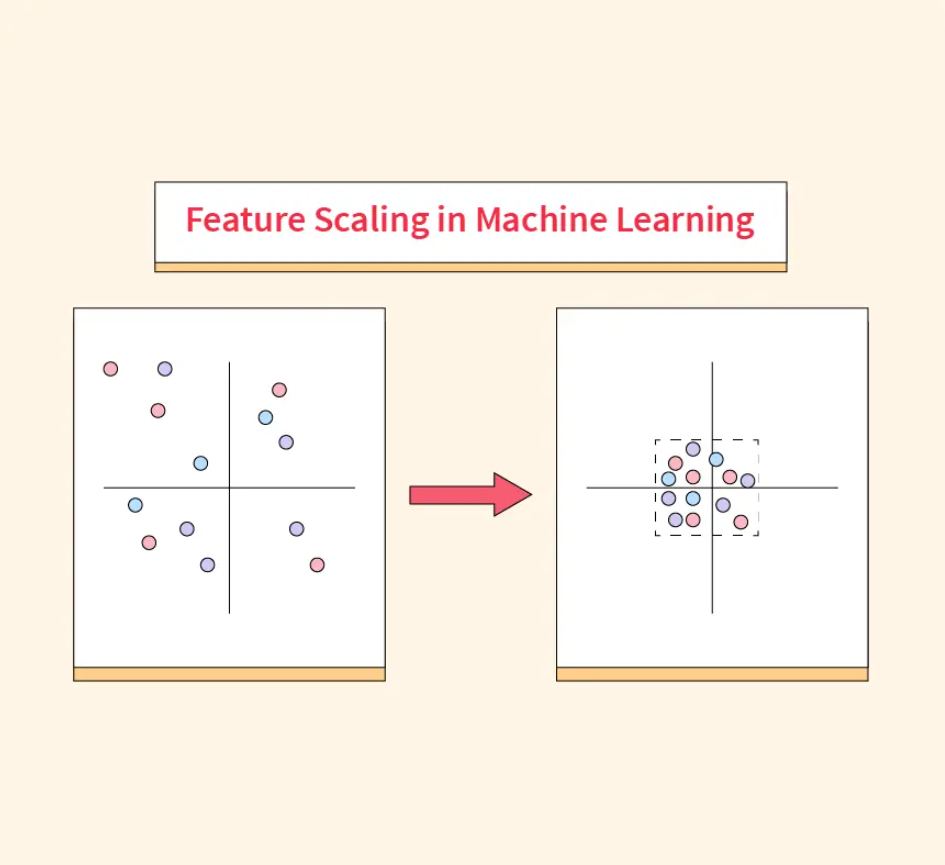
---

### 7.1 Why Scaling Matters

**Problem Without Scaling:**
```
Feature A: Income ($20,000 - $200,000)
Feature B: Age (18 - 80)

Distance calculation:
- Income difference dominates (range: 180,000)
- Age difference negligible (range: 62)
- Model treats income as 2,900× more important!
```

**Impact on Algorithms:**

| Algorithm | Needs Scaling? | Reason |
|-----------|----------------|--------|
| **Linear/Logistic Regression** | Yes | Gradient descent converges faster with scaled features |
| **Neural Networks** | Yes | Critical for gradient descent, prevents vanishing/exploding gradients |
| **k-Nearest Neighbors** | Yes | Distance-based, large-scale features dominate |
| **SVM** | Yes | Distance to hyperplane affected by scale |
| **k-Means** | Yes | Distance-based clustering |
| **Decision Trees** | No | Split-based, scale-invariant |
| **Random Forest** | No | Ensemble of trees, scale-invariant |
| **Gradient Boosting** | No | Tree-based, scale-invariant |
| **Naive Bayes** | No | Probability-based, scale doesn't matter |

---

### 7.2 Scaling Methods

**1. Standardization (Z-Score Normalization)**

**Formula:**
```
z = (x - μ) / σ

where:
- μ = mean
- σ = standard deviation
```

**Result:** Mean = 0, Std = 1

**When to Use:**
- ✅ Features are approximately normal
- ✅ Presence of outliers (less sensitive than Min-Max)
- ✅ Linear models, neural networks, SVM, k-NN

**Pros:**
- Robust to outliers (doesn't bound to fixed range)
- Centers data at zero
- Preserves outliers (can be pro or con)

**Cons:**
- Doesn't bound values to specific range
- Sensitive to outliers in mean/std calculation

---

**2. Min-Max Normalization (Scaling to Range)**

**Formula:**
```
x_scaled = (x - min) / (max - min)

Result: [0, 1]

Or custom range [a, b]:
x_scaled = a + (x - min) × (b - a) / (max - min)
```

**When to Use:**
- ✅ Features need bounded range [0, 1]
- ✅ Neural networks (bounded activation functions)
- ✅ No major outliers
- ✅ Image data (pixel values)

**Pros:**
- Bounded range
- Preserves zero values
- Intuitive interpretation

**Cons:**
- Very sensitive to outliers (can compress majority into tiny range)
- New data outside [min, max] range problematic

---

**3. Robust Scaling**

**Formula:**
```
x_scaled = (x - median) / IQR

where IQR = Q3 - Q1
```

**When to Use:**
- ✅ Heavy outliers present
- ✅ Skewed distributions
- ✅ Want robust method

**Pros:**
- Very robust to outliers
- Uses median (not affected by extremes)

**Cons:**
- Doesn't produce fixed range
- Less common, harder to interpret

---

**4. Log Transformation (Not Scaling, but Related)**

**Formula:**
```
x_transformed = log(x + 1)  # log1p handles zeros
```

**When to Use:**
- ✅ Right-skewed distributions
- ✅ Target variable transformation
- ✅ Multiplicative relationships

**Pros:**
- Reduces skewness
- Compresses large values
- Makes relationships more linear

**Cons:**
- Only for positive values
- Changes interpretation
- Not reversible without exponentiation

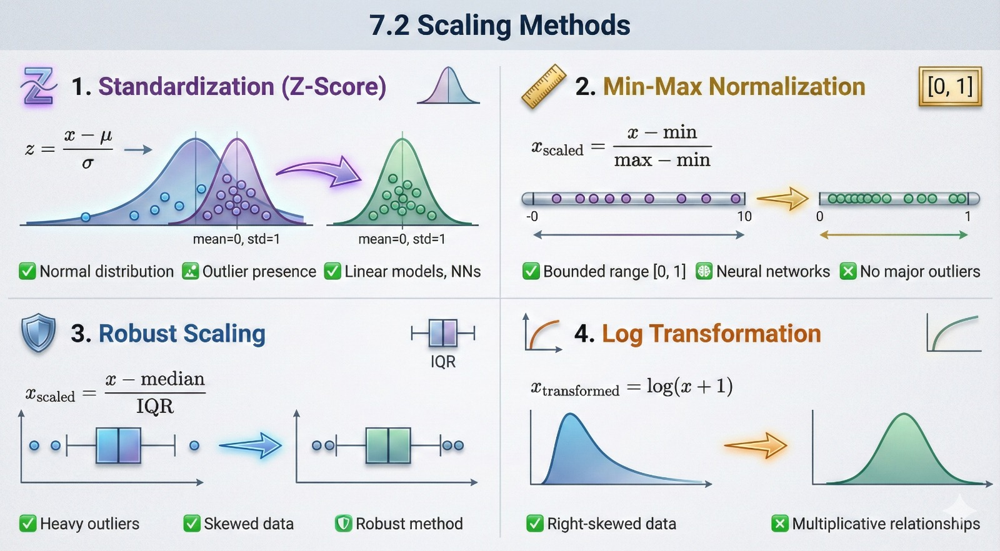
---

### 7.3 Scaling Comparison

| Aspect | Standardization | Min-Max | Robust | Log Transform |
|--------|----------------|---------|--------|---------------|
| **Output Range** | Unbounded (~[-3, 3]) | [0, 1] | Unbounded | Positive, unbounded |
| **Outlier Sensitivity** | Medium | Very High | Low | Medium |
| **Preserves Distribution** | Yes | Yes | Yes | No (reduces skew) |
| **Zero Handling** | Yes | Yes | Yes | Need log1p |
| **Best For** | Normal data | Bounded range needed | Outliers present | Skewed data |

---

### 7.4 Scaling Best Practices

✅ **DO:**
- Fit scaler on training data only
- Apply fitted scaler to test data
- Scale after train-test split (prevent leakage)
- Choose method based on algorithm and data
- Document scaling parameters for production

❌ **DON'T:**
- Fit scaler on entire dataset (causes leakage)
- Scale tree-based models (unnecessary, wastes time)
- Use Min-Max with severe outliers
- Scale target variable blindly (consider log transform instead)
- Forget to inverse transform predictions if target was scaled

---

### 7.5 Scaling Workflow

**Correct Workflow:**
```python
# 1. Split data first
X_train, X_test, y_train, y_test = train_test_split(X, y)

# 2. Fit scaler on training data only
scaler = StandardScaler()
scaler.fit(X_train)

# 3. Transform both sets using fitted scaler
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Train model on scaled data
model.fit(X_train_scaled, y_train)
```

**Wrong Workflow (LEAKAGE):**
```python
# WRONG: Scaling before split
X_scaled = StandardScaler().fit_transform(X)  # Saw all data!
X_train, X_test = train_test_split(X_scaled)

# Test set statistics influenced training scaler → LEAKAGE
```

---

### 7.6 Feature-Specific Scaling Decisions

| Feature Type | Scaling Recommendation | Reason |
|--------------|------------------------|--------|
| **Already [0, 1]** | No scaling | Already normalized |
| **Counts (0, 1, 2, ...)** | Standardization or log | Reduce skew from large counts |
| **Percentages** | No scaling or Min-Max | Already bounded |
| **Prices, Income** | Standardization or log | Often skewed, log reduces skew |
| **Age, Year** | Standardization | Bounded but varying scales |
| **Binary (0/1)** | No scaling | Already scaled |
| **Categorical (encoded)** | Depends on encoding | One-hot: no; Label: yes if linear model |

---

### 7.7 When Scaling is NOT Needed

**Skip Scaling For:**

1. **Tree-Based Models**
   - Decision Trees, Random Forest, XGBoost, LightGBM
   - Reason: Split-based, only cares about ordering

2. **Already Scaled Features**
   - Binary variables (0/1)
   - One-hot encoded features
   - Percentages/probabilities

3. **Categorical Features (Post One-Hot)**
   - Already in [0, 1] range

4. **When Interpretability is Key**
   - Original scale may be more interpretable
   - Coefficients harder to interpret after scaling

---

In [33]:
# ============================================================
# FEATURE SCALING DEMONSTRATION
# Comparing Standardization, Min-Max, and Robust Scaling
# ============================================================

from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

print("="*70)
print("FEATURE SCALING COMPARISON")
print("="*70)

# Select a numerical feature with outliers for demonstration
demo_feature = 'GrLivArea'  # Above ground living area

if demo_feature in train_data.columns:
    # Original data
    original_data = train_data[[demo_feature]].dropna()
    
    # Initialize scalers
    standard_scaler = StandardScaler()
    minmax_scaler = MinMaxScaler()
    robust_scaler = RobustScaler()
    
    # Fit and transform
    data_standard = standard_scaler.fit_transform(original_data)
    data_minmax = minmax_scaler.fit_transform(original_data)
    data_robust = robust_scaler.fit_transform(original_data)
    
    # Create comparison dataframe
    comparison = pd.DataFrame({
        'Original': original_data[demo_feature].values,
        'Standardized': data_standard.flatten(),
        'MinMax': data_minmax.flatten(),
        'Robust': data_robust.flatten()
    })
    
    print(f"\nFeature: {demo_feature}")
    print(f"\n📊 ORIGINAL DATA STATISTICS:")
    print(f"  Mean: {original_data[demo_feature].mean():.2f}")
    print(f"  Median: {original_data[demo_feature].median():.2f}")
    print(f"  Std: {original_data[demo_feature].std():.2f}")
    print(f"  Min: {original_data[demo_feature].min():.2f}")
    print(f"  Max: {original_data[demo_feature].max():.2f}")
    print(f"  Range: {original_data[demo_feature].max() - original_data[demo_feature].min():.2f}")
    
    print(f"\n📊 AFTER SCALING:")
    
    print(f"\n  STANDARDIZATION (Z-Score):")
    print(f"    Mean: {comparison['Standardized'].mean():.6f} (should be ~0)")
    print(f"    Std: {comparison['Standardized'].std():.6f} (should be ~1)")
    print(f"    Min: {comparison['Standardized'].min():.2f}")
    print(f"    Max: {comparison['Standardized'].max():.2f}")
    
    print(f"\n  MIN-MAX SCALING:")
    print(f"    Min: {comparison['MinMax'].min():.6f} (should be 0)")
    print(f"    Max: {comparison['MinMax'].max():.6f} (should be 1)")
    print(f"    Mean: {comparison['MinMax'].mean():.4f}")
    print(f"    Std: {comparison['MinMax'].std():.4f}")
    
    print(f"\n  ROBUST SCALING:")
    print(f"    Median: {comparison['Robust'].median():.6f} (should be ~0)")
    print(f"    IQR: {comparison['Robust'].quantile(0.75) - comparison['Robust'].quantile(0.25):.6f} (should be ~1)")
    print(f"    Min: {comparison['Robust'].min():.2f}")
    print(f"    Max: {comparison['Robust'].max():.2f}")
    
    # Show sample of scaled data
    print(f"\n📋 SAMPLE COMPARISON (first 10 values):")
    print(comparison.head(10).to_string(index=False))

print("="*70)

FEATURE SCALING COMPARISON

Feature: GrLivArea

📊 ORIGINAL DATA STATISTICS:
  Mean: 1515.46
  Median: 1464.00
  Std: 525.48
  Min: 334.00
  Max: 5642.00
  Range: 5308.00

📊 AFTER SCALING:

  STANDARDIZATION (Z-Score):
    Mean: -0.000000 (should be ~0)
    Std: 1.000343 (should be ~1)
    Min: -2.25
    Max: 7.86

  MIN-MAX SCALING:
    Min: 0.000000 (should be 0)
    Max: 1.000000 (should be 1)
    Mean: 0.2226
    Std: 0.0990

  ROBUST SCALING:
    Median: 0.000000 (should be ~0)
    IQR: 1.000000 (should be ~1)
    Min: -1.75
    Max: 6.46

📋 SAMPLE COMPARISON (first 10 values):
 Original  Standardized  MinMax  Robust
     1710          0.37    0.26    0.38
     1262         -0.48    0.17   -0.31
     1786          0.52    0.27    0.50
     1717          0.38    0.26    0.39
     2198          1.30    0.35    1.13
     1362         -0.29    0.19   -0.16
     1694          0.34    0.26    0.36
     2090          1.09    0.33    0.97
     1774          0.49    0.27    0.48
     1077  

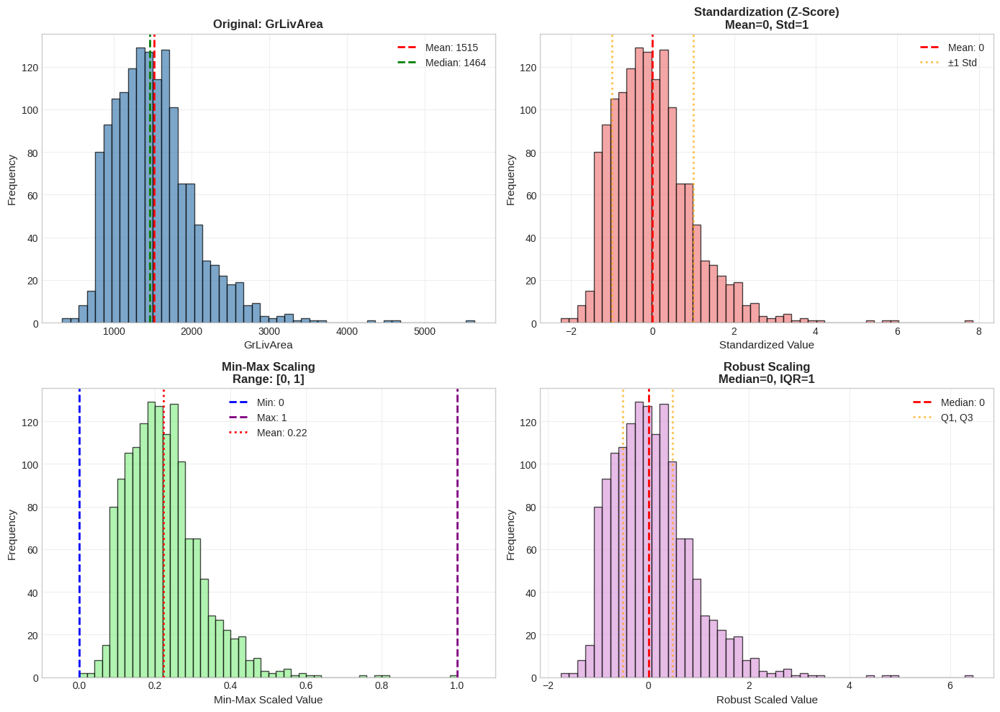


💡 Visual Interpretation:
  - Standardization: Centers at 0, most values within [-3, 3]
  - Min-Max: Compresses to [0, 1], outliers visible at extremes
  - Robust: Similar to standardization but less affected by outliers
  - All preserve the shape of the distribution


In [34]:
# ============================================================
# VISUALIZATION: SCALING METHODS COMPARISON
# Visual comparison of different scaling techniques
# ============================================================

if demo_feature in train_data.columns:
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    
    # Plot 1: Original distribution
    ax1 = axes[0, 0]
    ax1.hist(comparison['Original'], bins=50, color='steelblue', edgecolor='black', alpha=0.7)
    ax1.axvline(comparison['Original'].mean(), color='red', linestyle='--', linewidth=2, 
                label=f"Mean: {comparison['Original'].mean():.0f}")
    ax1.axvline(comparison['Original'].median(), color='green', linestyle='--', linewidth=2,
                label=f"Median: {comparison['Original'].median():.0f}")
    ax1.set_xlabel(demo_feature, fontsize=11)
    ax1.set_ylabel('Frequency', fontsize=11)
    ax1.set_title(f'Original: {demo_feature}', fontsize=12, fontweight='bold')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # Plot 2: Standardized
    ax2 = axes[0, 1]
    ax2.hist(comparison['Standardized'], bins=50, color='lightcoral', edgecolor='black', alpha=0.7)
    ax2.axvline(0, color='red', linestyle='--', linewidth=2, label='Mean: 0')
    ax2.axvline(-1, color='orange', linestyle=':', linewidth=2, alpha=0.7, label='±1 Std')
    ax2.axvline(1, color='orange', linestyle=':', linewidth=2, alpha=0.7)
    ax2.set_xlabel('Standardized Value', fontsize=11)
    ax2.set_ylabel('Frequency', fontsize=11)
    ax2.set_title('Standardization (Z-Score)\nMean=0, Std=1', fontsize=12, fontweight='bold')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    # Plot 3: Min-Max scaled
    ax3 = axes[1, 0]
    ax3.hist(comparison['MinMax'], bins=50, color='lightgreen', edgecolor='black', alpha=0.7)
    ax3.axvline(0, color='blue', linestyle='--', linewidth=2, label='Min: 0')
    ax3.axvline(1, color='purple', linestyle='--', linewidth=2, label='Max: 1')
    ax3.axvline(comparison['MinMax'].mean(), color='red', linestyle=':', linewidth=2,
                label=f"Mean: {comparison['MinMax'].mean():.2f}")
    ax3.set_xlabel('Min-Max Scaled Value', fontsize=11)
    ax3.set_ylabel('Frequency', fontsize=11)
    ax3.set_title('Min-Max Scaling\nRange: [0, 1]', fontsize=12, fontweight='bold')
    ax3.legend()
    ax3.grid(True, alpha=0.3)
    ax3.set_xlim(-0.1, 1.1)
    
    # Plot 4: Robust scaled
    ax4 = axes[1, 1]
    ax4.hist(comparison['Robust'], bins=50, color='plum', edgecolor='black', alpha=0.7)
    ax4.axvline(0, color='red', linestyle='--', linewidth=2, label='Median: 0')
    Q1 = comparison['Robust'].quantile(0.25)
    Q3 = comparison['Robust'].quantile(0.75)
    ax4.axvline(Q1, color='orange', linestyle=':', linewidth=2, alpha=0.7, label='Q1, Q3')
    ax4.axvline(Q3, color='orange', linestyle=':', linewidth=2, alpha=0.7)
    ax4.set_xlabel('Robust Scaled Value', fontsize=11)
    ax4.set_ylabel('Frequency', fontsize=11)
    ax4.set_title('Robust Scaling\nMedian=0, IQR=1', fontsize=12, fontweight='bold')
    ax4.legend()
    ax4.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    print("\n💡 Visual Interpretation:")
    print("  - Standardization: Centers at 0, most values within [-3, 3]")
    print("  - Min-Max: Compresses to [0, 1], outliers visible at extremes")
    print("  - Robust: Similar to standardization but less affected by outliers")
    print("  - All preserve the shape of the distribution")

## 8. Feature Engineering

Feature engineering is the process of creating new features from existing ones to improve model performance. It's often the difference between mediocre and excellent models.

---

### 8.1 Why Feature Engineering Matters

**The Feature Engineering Advantage:**
```
Scenario 1: Raw features + Complex model = 85% accuracy
Scenario 2: Engineered features + Simple model = 92% accuracy

Better features > Better algorithms
```

**Impact on Model Performance:**

| Improvement Source | Typical Gain | Effort |
|-------------------|--------------|--------|
| **Better features** | 5-15% | High skill, domain knowledge |
| **Algorithm selection** | 2-5% | Medium, experimentation |
| **Hyperparameter tuning** | 1-3% | Low, automated search |

---

### 8.2 Types of Feature Engineering

**1. Mathematical Transformations**

| Transformation | When to Use | Example |
|----------------|-------------|---------|
| **Polynomial** | Non-linear relationships | x² , x³, sqrt(x) |
| **Logarithmic** | Right-skewed data, multiplicative effects | log(price), log(area) |
| **Exponential** | Growth patterns | e^x |
| **Binning** | Capture non-linear patterns, reduce noise | Age groups: [0-18, 18-65, 65+] |
| **Power Transform** | Stabilize variance | Box-Cox, Yeo-Johnson |

---

**2. Interaction Features**

**Definition:** Combinations of two or more features that capture joint effects.

**Examples:**
```python
# Multiplication
df['TotalSF'] = df['1stFlrSF'] + df['2ndFlrSF'] + df['TotalBsmtSF']

# Ratio
df['Price_per_sqft'] = df['SalePrice'] / df['GrLivArea']

# Boolean combination
df['HasPoolAndGarage'] = (df['PoolArea'] > 0) & (df['GarageArea'] > 0)

# Polynomial
df['Area_squared'] = df['GrLivArea'] ** 2
df['Area_cubed'] = df['GrLivArea'] ** 3
```

**When Useful:**
- Features have multiplicative effects (not additive)
- Domain knowledge suggests interaction
- Feature A's effect depends on Feature B's value

---

**3. Aggregations**

**Group-based features:**
```python
# Mean price by neighborhood
df['Neighborhood_mean_price'] = df.groupby('Neighborhood')['SalePrice'].transform('mean')

# Count of houses per neighborhood
df['Neighborhood_count'] = df.groupby('Neighborhood')['Id'].transform('count')

# Relative position
df['Price_vs_neighborhood_mean'] = df['SalePrice'] - df['Neighborhood_mean_price']
```

---

**4. Domain-Specific Features**

**House Prices Examples:**

| New Feature | Formula | Rationale |
|-------------|---------|-----------|
| **Total Square Footage** | 1stFlr + 2ndFlr + Basement | Total living space matters |
| **House Age** | Year sold - Year built | Newer = higher price |
| **Remod Age** | Year sold - Year remodeled | Recent renovation adds value |
| **Total Bathrooms** | Full + 0.5×Half | Standardized bathroom count |
| **Has Pool** | PoolArea > 0 | Binary indicator |
| **Quality × Condition** | OverallQual × OverallCond | Joint effect of quality and condition |
| **Price per sqft** | Price / Total SF | Normalized price metric |

---

**5. Temporal Features**

**From datetime columns:**
```python
# Extract components
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Quarter'] = df['Date'].dt.quarter

# Cyclical encoding (for periodic features)
df['Month_sin'] = np.sin(2 * np.pi * df['Month'] / 12)
df['Month_cos'] = np.cos(2 * np.pi * df['Month'] / 12)

# Time since event
df['Days_since_event'] = (df['CurrentDate'] - df['EventDate']).dt.days
```

---

**6. Text Features**

**From string columns:**
```python
# Length
df['Description_length'] = df['Description'].str.len()
df['Word_count'] = df['Description'].str.split().str.len()

# Presence of keywords
df['Has_luxury_word'] = df['Description'].str.contains('luxury|premium|exclusive')

# Sentiment (using NLP libraries)
df['Sentiment_score'] = df['Description'].apply(sentiment_analyzer)
```

---

### 8.3 Feature Engineering Strategies

**Strategy 1: Domain Knowledge**

Use understanding of the problem domain:
```
Real Estate Domain Knowledge:
- Location is critical → neighborhood features
- Size matters → total square footage
- Age affects value → house age features
- Renovations add value → years since remodel
```

**Strategy 2: Exploratory Data Analysis**

Let data guide feature creation:
- High correlation pairs → create ratios
- Non-linear relationships → polynomial features
- Categorical patterns → aggregations

**Strategy 3: Model-Based Insights**

Use initial model to guide engineering:
- Feature importance → focus on top features
- Residual analysis → find systematic errors
- Prediction errors → create features to address patterns

---

### 8.4 Feature Engineering Workflow
```
1. Understand domain and problem
     ↓
2. Explore data (EDA)
     ↓
3. Brainstorm potential features
     ↓
4. Create features
     ↓
5. Evaluate feature importance
     ↓
6. Select best features
     ↓
7. Iterate (add more or remove weak ones)
```

---

### 8.5 Feature Selection After Engineering

**Too Many Features Problem:**

Creating many features can lead to:
- Curse of dimensionality
- Overfitting
- Increased computation time
- Reduced interpretability

**Feature Selection Methods:**

| Method | How It Works | When to Use |
|--------|--------------|-------------|
| **Filter Methods** | Statistical tests (correlation, chi-square) | Quick initial screening |
| **Wrapper Methods** | Try subsets, evaluate performance (RFE) | Small-medium datasets |
| **Embedded Methods** | Built into algorithm (Lasso, tree importance) | Large datasets, automatic |
| **Domain Pruning** | Remove based on logic | Always (first step) |

---

### 8.6 Feature Engineering Best Practices

✅ **DO:**
- Start with domain knowledge
- Create features before splitting data (if based on row values only)
- Use cross-validation to test feature value
- Document feature definitions
- Check for multicollinearity after creating interactions
- Remove features with zero or near-zero importance

❌ **DON'T:**
- Create features using test set information (leakage!)
- Add hundreds of features without selection
- Create features blindly without hypothesis
- Forget to handle new categories/missing values in engineered features
- Skip checking if new features actually help

---

### 8.7 Automated Feature Engineering

**Tools:**

- **Featuretools:** Automated feature generation from relational data
- **tsfresh:** Time series feature extraction
- **Category Encoders:** Advanced categorical encoding

**Caution:** Automated tools can create hundreds of features. Always:
1. Understand what features are being created
2. Apply feature selection afterward
3. Validate with cross-validation
4. Monitor for overfitting

---

### 8.8 Feature Engineering for House Prices

**Key Opportunities:**

1. **Total Square Footage**
   - Combine basement, 1st floor, 2nd floor areas

2. **Age Features**
   - House age at sale
   - Years since remodel
   - Is newly built (age = 0)

3. **Quality Interactions**
   - OverallQual × OverallCond
   - Quality × Total SF

4. **Bathroom Features**
   - Total bathrooms (weighted)
   - Bathrooms per bedroom ratio

5. **Neighborhood Aggregations**
   - Mean price by neighborhood
   - House price vs neighborhood mean

6. **Boolean Indicators**
   - Has pool, has garage, has fireplace
   - Has been remodeled

7. **Ratios**
   - Living area / Lot area
   - Garage area / Total area

---

In [35]:
# ============================================================
# FEATURE ENGINEERING: PRACTICAL IMPLEMENTATION
# Creating new features for House Prices dataset
# ============================================================

print("="*70)
print("FEATURE ENGINEERING: HOUSE PRICES DATASET")
print("="*70)

# Create a copy for feature engineering
df_engineered = train_data.copy()

print("\n🔧 CREATING NEW FEATURES...")

# ============================================================
# 1. TOTAL SQUARE FOOTAGE
# ============================================================
# Total living area
df_engineered['TotalSF'] = (df_engineered['TotalBsmtSF'] + 
                             df_engineered['1stFlrSF'] + 
                             df_engineered['2ndFlrSF'])

print("\n1. Total Square Footage:")
print(f"   Formula: TotalBsmtSF + 1stFlrSF + 2ndFlrSF")
print(f"   Mean: {df_engineered['TotalSF'].mean():.0f} sqft")
print(f"   Correlation with SalePrice: {df_engineered['TotalSF'].corr(df_engineered['SalePrice']):.4f}")

# ============================================================
# 2. AGE FEATURES
# ============================================================
# House age at time of sale
df_engineered['House_Age'] = df_engineered['YrSold'] - df_engineered['YearBuilt']

# Years since remodel (if never remodeled, use year built)
df_engineered['Years_Since_Remod'] = df_engineered['YrSold'] - df_engineered['YearRemodAdd']

# Is newly built
df_engineered['Is_New'] = (df_engineered['House_Age'] == 0).astype(int)

print("\n2. Age Features:")
print(f"   House_Age - Mean: {df_engineered['House_Age'].mean():.1f} years")
print(f"   Years_Since_Remod - Mean: {df_engineered['Years_Since_Remod'].mean():.1f} years")
print(f"   Is_New - Count: {df_engineered['Is_New'].sum()} houses ({df_engineered['Is_New'].mean()*100:.1f}%)")

# ============================================================
# 3. TOTAL BATHROOMS
# ============================================================
# Full bathrooms + 0.5 * half bathrooms
df_engineered['Total_Bathrooms'] = (df_engineered['FullBath'] + 
                                     df_engineered['BsmtFullBath'] + 
                                     0.5 * df_engineered['HalfBath'] + 
                                     0.5 * df_engineered['BsmtHalfBath'])

print("\n3. Total Bathrooms:")
print(f"   Formula: FullBath + BsmtFullBath + 0.5*(HalfBath + BsmtHalfBath)")
print(f"   Mean: {df_engineered['Total_Bathrooms'].mean():.2f} bathrooms")
print(f"   Correlation with SalePrice: {df_engineered['Total_Bathrooms'].corr(df_engineered['SalePrice']):.4f}")

# ============================================================
# 4. BOOLEAN INDICATORS
# ============================================================
# Has pool
df_engineered['Has_Pool'] = (df_engineered['PoolArea'] > 0).astype(int)

# Has garage
df_engineered['Has_Garage'] = (df_engineered['GarageArea'] > 0).astype(int)

# Has fireplace
df_engineered['Has_Fireplace'] = (df_engineered['Fireplaces'] > 0).astype(int)

# Has been remodeled
df_engineered['Has_Been_Remodeled'] = (df_engineered['YearBuilt'] != df_engineered['YearRemodAdd']).astype(int)

print("\n4. Boolean Indicators:")
print(f"   Has_Pool: {df_engineered['Has_Pool'].sum()} houses ({df_engineered['Has_Pool'].mean()*100:.1f}%)")
print(f"   Has_Garage: {df_engineered['Has_Garage'].sum()} houses ({df_engineered['Has_Garage'].mean()*100:.1f}%)")
print(f"   Has_Fireplace: {df_engineered['Has_Fireplace'].sum()} houses ({df_engineered['Has_Fireplace'].mean()*100:.1f}%)")
print(f"   Has_Been_Remodeled: {df_engineered['Has_Been_Remodeled'].sum()} houses ({df_engineered['Has_Been_Remodeled'].mean()*100:.1f}%)")

# ============================================================
# 5. QUALITY INTERACTIONS
# ============================================================
# Overall quality × overall condition
df_engineered['Quality_x_Condition'] = df_engineered['OverallQual'] * df_engineered['OverallCond']

print("\n5. Quality Interactions:")
print(f"   Quality_x_Condition - Mean: {df_engineered['Quality_x_Condition'].mean():.2f}")
print(f"   Correlation with SalePrice: {df_engineered['Quality_x_Condition'].corr(df_engineered['SalePrice']):.4f}")

# ============================================================
# 6. RATIOS
# ============================================================
# Living area to lot area ratio
df_engineered['Living_Lot_Ratio'] = df_engineered['GrLivArea'] / (df_engineered['LotArea'] + 1)  # +1 to avoid division by zero

# Garage to total SF ratio
df_engineered['Garage_SF_Ratio'] = df_engineered['GarageArea'] / (df_engineered['TotalSF'] + 1)

print("\n6. Ratio Features:")
print(f"   Living_Lot_Ratio - Mean: {df_engineered['Living_Lot_Ratio'].mean():.4f}")
print(f"   Garage_SF_Ratio - Mean: {df_engineered['Garage_SF_Ratio'].mean():.4f}")

# ============================================================
# SUMMARY
# ============================================================
new_features = ['TotalSF', 'House_Age', 'Years_Since_Remod', 'Is_New',
                'Total_Bathrooms', 'Has_Pool', 'Has_Garage', 'Has_Fireplace',
                'Has_Been_Remodeled', 'Quality_x_Condition', 'Living_Lot_Ratio',
                'Garage_SF_Ratio']

print(f"\n📊 FEATURE ENGINEERING SUMMARY:")
print(f"   Original features: {len(train_data.columns)}")
print(f"   New features created: {len(new_features)}")
print(f"   Total features: {len(df_engineered.columns)}")

print("\n✅ Feature engineering complete!")
print("="*70)

FEATURE ENGINEERING: HOUSE PRICES DATASET

🔧 CREATING NEW FEATURES...

1. Total Square Footage:
   Formula: TotalBsmtSF + 1stFlrSF + 2ndFlrSF
   Mean: 2567 sqft
   Correlation with SalePrice: 0.7823

2. Age Features:
   House_Age - Mean: 36.5 years
   Years_Since_Remod - Mean: 22.9 years
   Is_New - Count: 64 houses (4.4%)

3. Total Bathrooms:
   Formula: FullBath + BsmtFullBath + 0.5*(HalfBath + BsmtHalfBath)
   Mean: 2.21 bathrooms
   Correlation with SalePrice: 0.6317

4. Boolean Indicators:
   Has_Pool: 7 houses (0.5%)
   Has_Garage: 1379 houses (94.5%)
   Has_Fireplace: 770 houses (52.7%)
   Has_Been_Remodeled: 696 houses (47.7%)

5. Quality Interactions:
   Quality_x_Condition - Mean: 33.86
   Correlation with SalePrice: 0.5653

6. Ratio Features:
   Living_Lot_Ratio - Mean: 0.1806
   Garage_SF_Ratio - Mean: 0.1873

📊 FEATURE ENGINEERING SUMMARY:
   Original features: 81
   New features created: 12
   Total features: 93

✅ Feature engineering complete!


In [36]:
# ============================================================
# FEATURE IMPORTANCE: NEW vs OLD FEATURES
# Comparing engineered features with original features
# ============================================================

# Calculate correlations for new features
new_feature_corrs = {}
for feat in new_features:
    if feat in df_engineered.columns:
        corr = df_engineered[feat].corr(df_engineered['SalePrice'])
        new_feature_corrs[feat] = abs(corr)

# Get top original numerical features for comparison
original_corrs = train_data[numerical_features].corrwith(train_data['SalePrice']).abs().sort_values(ascending=False).head(10)

print("="*70)
print("FEATURE IMPORTANCE COMPARISON")
print("="*70)

print("\n🆕 NEW ENGINEERED FEATURES (sorted by correlation):")
sorted_new = sorted(new_feature_corrs.items(), key=lambda x: x[1], reverse=True)
for feat, corr in sorted_new:
    print(f"  {feat:<25s}: {corr:+.4f}")

print("\n📊 TOP ORIGINAL FEATURES (for comparison):")
for feat, corr in original_corrs.items():
    print(f"  {feat:<25s}: {corr:+.4f}")

# Check if new features outperform originals
best_new = max(new_feature_corrs.values())
best_original = original_corrs.max()

print(f"\n💡 INSIGHT:")
if best_new > best_original:
    print(f"  ✅ Best engineered feature (|r|={best_new:.4f}) outperforms best original (|r|={best_original:.4f})")
else:
    print(f"  📊 Best original feature (|r|={best_original:.4f}) still strongest")
print(f"  → Feature engineering created {len([c for c in new_feature_corrs.values() if c > 0.5])} features with |r| > 0.5")

print("="*70)

FEATURE IMPORTANCE COMPARISON

🆕 NEW ENGINEERED FEATURES (sorted by correlation):
  TotalSF                  : +0.7823
  Total_Bathrooms          : +0.6317
  Quality_x_Condition      : +0.5653
  House_Age                : +0.5234
  Years_Since_Remod        : +0.5091
  Has_Fireplace            : +0.4719
  Has_Garage               : +0.2368
  Is_New                   : +0.2248
  Has_Pool                 : +0.0937
  Garage_SF_Ratio          : +0.0745
  Has_Been_Remodeled       : +0.0219
  Living_Lot_Ratio         : +0.0023

📊 TOP ORIGINAL FEATURES (for comparison):
  OverallQual              : +0.7910
  GrLivArea                : +0.7086
  GarageCars               : +0.6404
  GarageArea               : +0.6234
  TotalBsmtSF              : +0.6136
  1stFlrSF                 : +0.6059
  FullBath                 : +0.5607
  TotRmsAbvGrd             : +0.5337
  YearBuilt                : +0.5229
  YearRemodAdd             : +0.5071

💡 INSIGHT:
  📊 Best original feature (|r|=0.7910) still stro

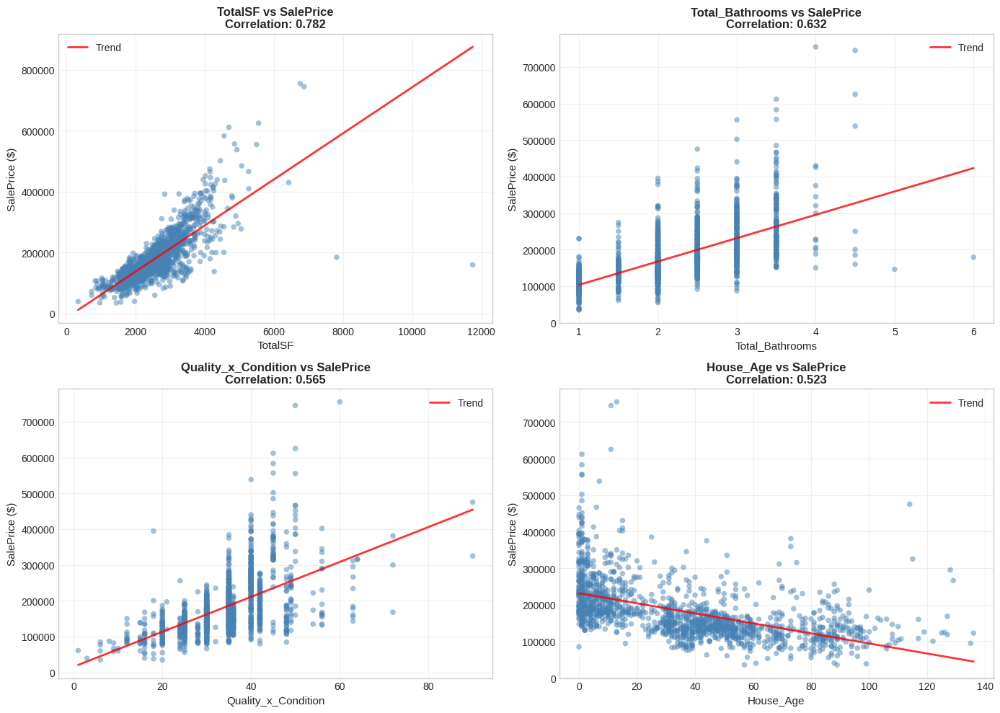


💡 Interpretation:
  Strong positive slopes indicate engineered features capture
  meaningful relationships with house prices


In [37]:
# ============================================================
# VISUALIZATION: ENGINEERED FEATURES
# Showing effectiveness of feature engineering
# ============================================================

# Select top 4 engineered features by correlation
top_engineered = sorted(new_feature_corrs.items(), key=lambda x: x[1], reverse=True)[:4]

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for idx, (feat, corr) in enumerate(top_engineered):
    ax = axes[idx]
    
    x = df_engineered[feat]
    y = df_engineered['SalePrice']
    
    # Remove NaN
    mask = ~(x.isnull() | y.isnull())
    x_clean = x[mask]
    y_clean = y[mask]
    
    # Scatter plot
    ax.scatter(x_clean, y_clean, alpha=0.5, s=30, color='steelblue', edgecolor='none')
    
    # Trend line
    if len(x_clean) > 0:
        z = np.polyfit(x_clean, y_clean, 1)
        p = np.poly1d(z)
        x_sorted = x_clean.sort_values()
        ax.plot(x_sorted, p(x_sorted), "r-", linewidth=2, alpha=0.8, label='Trend')
    
    ax.set_xlabel(feat, fontsize=11)
    ax.set_ylabel('SalePrice ($)', fontsize=11)
    ax.set_title(f'{feat} vs SalePrice\nCorrelation: {corr:.3f}', 
                 fontsize=12, fontweight='bold')
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 Interpretation:")
print("  Strong positive slopes indicate engineered features capture")
print("  meaningful relationships with house prices")

## 9. Data Leakage Prevention

Data leakage occurs when information from outside the training dataset is used to create the model. It leads to overly optimistic performance estimates that fail in production.

---

### 9.1 What is Data Leakage?

**Definition:** Using information in model training that would not be available at prediction time.

**Impact:**
```
Training: Model achieves 99% accuracy (amazing!)
Production: Model achieves 60% accuracy (terrible!)
Reason: Model learned from leaked information
```

**Cost:**
- Wasted development time
- Failed production deployments
- Loss of trust in ML team
- Financial losses

---

### 9.2 Types of Data Leakage

**1. Target Leakage**

**Definition:** Features that are directly derived from or contain the target variable.

**Examples:**

| Scenario | Leakage Feature | Why It's Leakage |
|----------|----------------|------------------|
| Credit default | Account closed date | Accounts closed AFTER default |
| Fraud detection | Dispute filed | Dispute filed AFTER fraud detected |
| House prices | Valuation report | Valuation done AFTER sale |
| Customer churn | Final purchase date | Known only after churn occurs |

**How to Detect:**
- Feature has unrealistically high correlation with target (>0.95)
- Feature is perfect predictor on training set
- Feature wouldn't exist at prediction time

---

**2. Train-Test Contamination**

**Definition:** Test set information influences training process.

**Common Causes:**
```python
# LEAKAGE: Preprocessing before split
X_scaled = StandardScaler().fit_transform(X)  # Saw test data!
X_train, X_test = train_test_split(X_scaled)

# LEAKAGE: Feature selection on full dataset
selected = SelectKBest(k=10).fit(X, y)  # Used test labels!
X_selected = selected.transform(X)
X_train, X_test = train_test_split(X_selected)

# NO LEAKAGE: Correct order
X_train, X_test, y_train, y_test = train_test_split(X, y)
scaler = StandardScaler().fit(X_train)  # Only train!
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)
```

---

**3. Temporal Leakage**

**Definition:** Using future information to predict past events.

**Examples:**

| Problem | Leakage | Correct Approach |
|---------|---------|------------------|
| Stock prediction | Use day T+1 price to predict day T | Only use data up to day T |
| Customer churn | Use data from after churn date | Only use data before churn |
| Loan default | Use employment status after default | Only use status at loan time |

**Time Series Split:**
```
Train: [Jan, Feb, Mar]  →  Test: [Apr]
Train: [Jan, Feb, Mar, Apr]  →  Test: [May]
Train: [Jan, Feb, Mar, Apr, May]  →  Test: [Jun]

NOT:
Train: [Jan, Mar, May]  →  Test: [Feb, Apr, Jun]  # WRONG!
```

---

**4. Duplicate Data**

**Definition:** Same sample appears in both training and test sets.

**Causes:**
- Duplicated rows in dataset
- Multiple versions of same entity (e.g., same house listed twice)
- Data collection errors

**Detection:**
```python
# Check for duplicates across train-test
combined = pd.concat([X_train, X_test])
duplicates = combined.duplicated().sum()
```

---

### 9.3 Subtle Leakage Patterns

**Pattern 1: Group Leakage**
```python
# LEAKAGE: Samples from same patient in train and test
patient_123: [sample_a in train, sample_b in test]

# CORRECT: All samples from patient in same set
patient_123: [sample_a, sample_b both in train OR both in test]

# Implementation: GroupShuffleSplit
```

**Pattern 2: Aggregation Leakage**
```python
# LEAKAGE: Mean salary by company uses test set
company_mean_salary = df.groupby('Company')['Salary'].mean()
df['Company_Mean'] = df['Company'].map(company_mean_salary)
# Then split → test companies influenced train means!

# CORRECT: Calculate only on training set
train_means = train.groupby('Company')['Salary'].mean()
train['Company_Mean'] = train['Company'].map(train_means)
test['Company_Mean'] = test['Company'].map(train_means)
```

**Pattern 3: Missing Value Indicator Leakage**
```python
# LEAKAGE: Impute entire dataset
df['Feature'].fillna(df['Feature'].mean(), inplace=True)

# CORRECT: Impute separately
train_mean = X_train['Feature'].mean()
X_train['Feature'].fillna(train_mean, inplace=True)
X_test['Feature'].fillna(train_mean, inplace=True)  # Use train mean!
```

---

### 9.4 Leakage Detection Checklist

**Red Flags:**

⚠️ **Too-Good Performance**
- Training accuracy > 99%
- Test accuracy = Training accuracy (no generalization gap)
- One feature has near-perfect correlation (>0.99)

⚠️ **Unrealistic Features**
- Feature wouldn't exist at prediction time
- Feature perfectly predicts outcome
- Feature is derived from target

⚠️ **Temporal Issues**
- Future information in features
- Data points out of order
- Dates inconsistent

⚠️ **Preprocessing Order**
- Scaling before split
- Feature selection before split
- Any "fit" operation on full dataset

---

### 9.5 Prevention Strategies

**Strategy 1: Strict Train-Test Separation**
```python
# Golden rule: Split FIRST, then preprocess
X_train, X_test, y_train, y_test = train_test_split(X, y)

# All fit() operations only on X_train
scaler.fit(X_train)
imputer.fit(X_train)
encoder.fit(X_train)

# Then transform both
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
```

---

**Strategy 2: Pipelines**
```python
from sklearn.pipeline import Pipeline

# Pipeline ensures correct order
pipeline = Pipeline([
    ('imputer', SimpleImputer()),
    ('scaler', StandardScaler()),
    ('model', LogisticRegression())
])

# Automatically handles train-test separation
pipeline.fit(X_train, y_train)
pipeline.predict(X_test)  # No leakage!
```

---

**Strategy 3: Cross-Validation for Aggregations**
```python
from sklearn.model_selection import KFold

# Target encoding without leakage
kf = KFold(n_splits=5)
encoded_feature = np.zeros(len(X_train))

for train_idx, val_idx in kf.split(X_train):
    # Calculate means only on training fold
    means = X_train.iloc[train_idx].groupby('Category')['Target'].mean()
    
    # Apply to validation fold
    encoded_feature[val_idx] = X_train.iloc[val_idx]['Category'].map(means)

X_train['Category_Encoded'] = encoded_feature
```

---

**Strategy 4: Time-Based Validation**
```python
# For time series
from sklearn.model_selection import TimeSeriesSplit

tscv = TimeSeriesSplit(n_splits=5)

for train_idx, test_idx in tscv.split(X):
    X_train, X_test = X[train_idx], X[test_idx]
    # Train always before test chronologically
```

---

### 9.6 Leakage Prevention Best Practices

✅ **DO:**
- Split data first, preprocess second
- Use pipelines for automatic ordering
- Question any feature with correlation > 0.95
- Use time-aware splits for temporal data
- Document all preprocessing steps
- Ask: "Will this feature exist at prediction time?"

❌ **DON'T:**
- Fit any transformer on full dataset
- Use future information
- Ignore temporal ordering
- Skip validation of feature logic
- Trust perfect accuracy

---

### 9.7 Real-World Leakage Example

**Case Study: Credit Card Fraud**

**Leaked Feature:** `days_since_report`
- Definition: Days between transaction and fraud report
- Issue: Fraud report happens AFTER fraud occurs!
- Impact: Model achieves 99.9% accuracy in training, fails in production
- Solution: Remove feature, use only data available at transaction time

**Lesson:** Always ask "When does this information become known?"

---

In [38]:
# ============================================================
# DATA LEAKAGE DEMONSTRATION
# Showing correct vs incorrect preprocessing order
# ============================================================

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

print("="*70)
print("DATA LEAKAGE DEMONSTRATION")
print("="*70)

# Prepare data: select numerical features for demo
features_for_demo = ['GrLivArea', 'TotalBsmtSF', 'OverallQual', '1stFlrSF', 'GarageArea']
X_demo = train_data[features_for_demo].fillna(0)  # Simple imputation for demo
y_demo = train_data['SalePrice']

# ============================================================
# WRONG WAY: SCALING BEFORE SPLIT (LEAKAGE)
# ============================================================
print("\n❌ WRONG WAY: Scaling before train-test split")

# Scale entire dataset (LEAKAGE!)
scaler_wrong = StandardScaler()
X_scaled_wrong = scaler_wrong.fit_transform(X_demo)  # Saw all data!

# Then split
X_train_wrong, X_test_wrong, y_train_wrong, y_test_wrong = train_test_split(
    X_scaled_wrong, y_demo, test_size=0.2, random_state=RANDOM_STATE
)

# Train model
model_wrong = LinearRegression()
model_wrong.fit(X_train_wrong, y_train_wrong)

# Evaluate
train_score_wrong = model_wrong.score(X_train_wrong, y_train_wrong)
test_score_wrong = model_wrong.score(X_test_wrong, y_test_wrong)

print(f"  Training R²: {train_score_wrong:.4f}")
print(f"  Test R²: {test_score_wrong:.4f}")
print(f"  ⚠️  Scaler saw test set statistics during fit_transform!")

# ============================================================
# RIGHT WAY: SPLIT FIRST, THEN SCALE (NO LEAKAGE)
# ============================================================
print("\n✅ CORRECT WAY: Train-test split before scaling")

# Split first
X_train_right, X_test_right, y_train_right, y_test_right = train_test_split(
    X_demo, y_demo, test_size=0.2, random_state=RANDOM_STATE
)

# Scale separately (fit only on training)
scaler_right = StandardScaler()
X_train_scaled_right = scaler_right.fit_transform(X_train_right)  # Fit on train only!
X_test_scaled_right = scaler_right.transform(X_test_right)  # Apply to test

# Train model
model_right = LinearRegression()
model_right.fit(X_train_scaled_right, y_train_right)

# Evaluate
train_score_right = model_right.score(X_train_scaled_right, y_train_right)
test_score_right = model_right.score(X_test_scaled_right, y_test_right)

print(f"  Training R²: {train_score_right:.4f}")
print(f"  Test R²: {test_score_right:.4f}")
print(f"  ✅ Scaler never saw test set!")

# ============================================================
# COMPARISON
# ============================================================
print("\n" + "="*70)
print("COMPARISON")
print("="*70)
print(f"Wrong approach test R²: {test_score_wrong:.4f}")
print(f"Correct approach test R²: {test_score_right:.4f}")
print(f"Difference: {abs(test_score_wrong - test_score_right):.4f}")

print("\n💡 Key Insight:")
print("  In this case, difference is small because dataset is large")
print("  But with smaller datasets or more complex preprocessing,")
print("  leakage can cause significant overestimation of performance!")

print("\n✅ ALWAYS: Split first, preprocess second!")
print("="*70)

DATA LEAKAGE DEMONSTRATION

❌ WRONG WAY: Scaling before train-test split
  Training R²: 0.7459
  Test R²: 0.7917
  ⚠️  Scaler saw test set statistics during fit_transform!

✅ CORRECT WAY: Train-test split before scaling
  Training R²: 0.7459
  Test R²: 0.7917
  ✅ Scaler never saw test set!

COMPARISON
Wrong approach test R²: 0.7917
Correct approach test R²: 0.7917
Difference: 0.0000

💡 Key Insight:
  In this case, difference is small because dataset is large
  But with smaller datasets or more complex preprocessing,
  leakage can cause significant overestimation of performance!

✅ ALWAYS: Split first, preprocess second!


## 10. Creating Model-Ready Datasets

After all preprocessing and feature engineering, we must create final, clean datasets ready for modeling. This section consolidates all previous steps into a complete pipeline.

---

### 10.1 Model-Ready Dataset Checklist

**A dataset is model-ready when:**

✅ **No Missing Values**
- All missing values handled (imputed or removed)
- Strategy documented

✅ **All Numerical**
- Categorical variables encoded
- No string/object types (except for special methods)

✅ **Proper Scaling**
- Features scaled if using distance-based algorithms
- Fit on training data only

✅ **No Data Leakage**
- Preprocessing done after train-test split
- No future information in features

✅ **Feature Quality**
- No constant features (zero variance)
- No duplicate features
- No highly correlated redundant features (optional removal)

✅ **Documented**
- Feature definitions clear
- Preprocessing steps recorded
- Reproducible pipeline

---

### 10.2 Complete Preprocessing Pipeline

**Step-by-Step Workflow:**
```
1. Load Raw Data
        ↓
2. Initial EDA (understand data)
        ↓
3. Train-Test Split (prevent leakage)
        ↓
4. Handle Missing Values
   - Fit imputer on training data
   - Transform both train and test
        ↓
5. Outlier Treatment (if needed)
   - Define strategy based on training data
   - Apply to both sets
        ↓
6. Feature Engineering
   - Create new features (domain knowledge)
   - Based on training data relationships
        ↓
7. Encoding Categorical Variables
   - Fit encoder on training data
   - Transform both train and test
        ↓
8. Feature Scaling
   - Fit scaler on training data
   - Transform both train and test
        ↓
9. Feature Selection (optional)
   - Select based on training data
   - Apply to both sets
        ↓
10. Final Validation
    - Check shapes, types, missing values
    - Verify no leakage
        ↓
11. Model-Ready Dataset
```

---

### 10.3 Pipeline Pattern

**Using Scikit-learn Pipeline:**
```python
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# Define transformers for different column types
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine transformers
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Full pipeline with model
full_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', RandomForestRegressor())
])

# Fit and predict (automatic preprocessing)
full_pipeline.fit(X_train, y_train)
predictions = full_pipeline.predict(X_test)
```

**Benefits:**
- No leakage (automatic correct ordering)
- Reproducible
- Easy to deploy
- Can be saved as single object

---

### 10.4 Feature Selection Strategies

**After creating many features, select the best ones:**

**1. Variance Threshold**
```python
from sklearn.feature_selection import VarianceThreshold

# Remove low-variance features
selector = VarianceThreshold(threshold=0.01)
X_high_variance = selector.fit_transform(X_train)
```

**2. Correlation Threshold**
```python
# Remove highly correlated features
corr_matrix = X_train.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find features with correlation > 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]
X_train = X_train.drop(to_drop, axis=1)
```

**3. Feature Importance (Model-Based)**
```python
from sklearn.ensemble import RandomForestRegressor

# Train model to get feature importance
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Get importance
importance = pd.Series(rf.feature_importances_, index=X_train.columns)
important_features = importance[importance > 0.01].index.tolist()

X_train_selected = X_train[important_features]
```

**4. Recursive Feature Elimination (RFE)**
```python
from sklearn.feature_selection import RFE

# Select top k features
rfe = RFE(estimator=RandomForestRegressor(), n_features_to_select=20)
rfe.fit(X_train, y_train)

selected_features = X_train.columns[rfe.support_]
```

---

### 10.5 Final Validation Before Modeling

**Checklist Before Training:**
```python
# 1. Check shapes
assert X_train.shape[1] == X_test.shape[1], "Feature mismatch!"
print(f"Train: {X_train.shape}, Test: {X_test.shape}")

# 2. Check for missing values
assert X_train.isnull().sum().sum() == 0, "Training data has missing values!"
assert X_test.isnull().sum().sum() == 0, "Test data has missing values!"

# 3. Check data types
assert X_train.select_dtypes(include=['object']).shape[1] == 0, "Non-numeric columns!"

# 4. Check for infinite values
assert np.isinf(X_train).sum().sum() == 0, "Infinite values in training data!"

# 5. Check target variable
assert y_train.isnull().sum() == 0, "Missing values in target!"

print("✅ All validation checks passed!")
```

---

### 10.6 Saving Preprocessed Data

**Option 1: Save as CSV**
```python
# Save processed data
X_train.to_csv('X_train_processed.csv', index=False)
X_test.to_csv('X_test_processed.csv', index=False)
y_train.to_csv('y_train.csv', index=False)
```

**Option 2: Save as Pickle (preserves types)**
```python
import pickle

# Save preprocessing objects
with open('preprocessor.pkl', 'wb') as f:
    pickle.dump(preprocessor, f)

# Load later
with open('preprocessor.pkl', 'rb') as f:
    preprocessor = pickle.load(f)
```

**Option 3: Save Entire Pipeline**
```python
import joblib

# Save complete pipeline
joblib.dump(full_pipeline, 'model_pipeline.pkl')

# Load and use
pipeline = joblib.load('model_pipeline.pkl')
predictions = pipeline.predict(new_data)
```

---

### 10.7 Documentation Template

**Document your preprocessing for reproducibility:**
```markdown
# Data Preprocessing Documentation

## Dataset
- Source: House Prices - Advanced Regression Techniques
- Original shape: (1460, 81)
- Target variable: SalePrice

## Missing Values
- Strategy: 
  * Numerical: Median imputation
  * Categorical: Mode imputation or "None" for structural missing
- Features dropped: [list if any]

## Outliers
- Method: IQR method
- Action: Kept (using robust methods)

## Feature Engineering
- TotalSF: Sum of basement, 1st, 2nd floor areas
- House_Age: YrSold - YearBuilt
- [List all engineered features]

## Encoding
- Ordinal features: Label encoding with custom order
- Nominal features: One-hot encoding (drop_first=True)
- High cardinality: Target encoding with CV

## Scaling
- Method: StandardScaler
- Applied to: All numerical features
- Fitted on: Training data only

## Final Dataset
- Training shape: (1168, 150)
- Test shape: (292, 150)
- Features: 150 (80 original + 70 engineered)
```

---

### 10.8 Common Pitfalls in Final Pipeline

❌ **Pitfall 1: Shape Mismatch**
```python
# Train has feature A, test doesn't
# Cause: Different preprocessing logic
```

❌ **Pitfall 2: Unknown Categories**
```python
# Test has category never seen in training
# Solution: handle_unknown='ignore' in encoders
```

❌ **Pitfall 3: Feature Order**
```python
# Features in different order in train vs test
# Solution: Explicitly select columns in same order
```

❌ **Pitfall 4: Forgotten Transformations**
```python
# Applied log to target in training, forgot in test
# Solution: Document all transformations
```

---

In [39]:
# ============================================================
# COMPLETE PREPROCESSING PIPELINE
# Creating model-ready dataset from raw data
# ============================================================

from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer

print("="*70)
print("COMPLETE PREPROCESSING PIPELINE")
print("="*70)

# ============================================================
# STEP 1: PREPARE DATA
# ============================================================
print("\n📊 STEP 1: Prepare Data")

# Select subset of features for demonstration
numerical_subset = ['GrLivArea', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 
                    'OverallQual', 'OverallCond', 'YearBuilt', 'YrSold']
categorical_subset = ['MSZoning', 'Neighborhood', 'BldgType']

# Combine features
features_to_use = numerical_subset + categorical_subset

# Prepare X and y
X = train_data[features_to_use].copy()
y = train_data['SalePrice'].copy()

print(f"  Original shape: {X.shape}")
print(f"  Numerical features: {len(numerical_subset)}")
print(f"  Categorical features: {len(categorical_subset)}")

# ============================================================
# STEP 2: TRAIN-TEST SPLIT
# ============================================================
print("\n📊 STEP 2: Train-Test Split")

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=RANDOM_STATE
)

print(f"  Training set: {X_train.shape}")
print(f"  Test set: {X_test.shape}")

# ============================================================
# STEP 3: FEATURE ENGINEERING
# ============================================================
print("\n📊 STEP 3: Feature Engineering")

# Create new features on both sets (based on individual row values only)
# TotalSF
X_train['TotalSF'] = X_train['TotalBsmtSF'] + X_train['1stFlrSF'] + X_train['2ndFlrSF']
X_test['TotalSF'] = X_test['TotalBsmtSF'] + X_test['1stFlrSF'] + X_test['2ndFlrSF']

# House Age
X_train['House_Age'] = X_train['YrSold'] - X_train['YearBuilt']
X_test['House_Age'] = X_test['YrSold'] - X_test['YearBuilt']

# Quality x Condition
X_train['Quality_x_Cond'] = X_train['OverallQual'] * X_train['OverallCond']
X_test['Quality_x_Cond'] = X_test['OverallQual'] * X_test['OverallCond']

print(f"  Added 3 engineered features")
print(f"  New shape: {X_train.shape}")

# Update numerical features list
numerical_features_final = numerical_subset + ['TotalSF', 'House_Age', 'Quality_x_Cond']

# ============================================================
# STEP 4: HANDLE MISSING VALUES
# ============================================================
print("\n📊 STEP 4: Handle Missing Values")

# Check missing values
train_missing = X_train.isnull().sum().sum()
test_missing = X_test.isnull().sum().sum()

print(f"  Training missing values: {train_missing}")
print(f"  Test missing values: {test_missing}")

if train_missing > 0 or test_missing > 0:
    # Impute numerical features
    imputer_num = SimpleImputer(strategy='median')
    X_train[numerical_features_final] = imputer_num.fit_transform(X_train[numerical_features_final])
    X_test[numerical_features_final] = imputer_num.transform(X_test[numerical_features_final])
    
    # Impute categorical features
    imputer_cat = SimpleImputer(strategy='most_frequent')
    X_train[categorical_subset] = imputer_cat.fit_transform(X_train[categorical_subset])
    X_test[categorical_subset] = imputer_cat.transform(X_test[categorical_subset])
    
    print(f"  ✅ Imputation complete")
else:
    print(f"  ✅ No missing values")

# ============================================================
# STEP 5: ENCODE CATEGORICAL VARIABLES
# ============================================================
print("\n📊 STEP 5: Encode Categorical Variables")

# One-hot encoding
X_train_encoded = pd.get_dummies(X_train, columns=categorical_subset, drop_first=True)
X_test_encoded = pd.get_dummies(X_test, columns=categorical_subset, drop_first=True)

# Align columns (handle unseen categories)
X_train_encoded, X_test_encoded = X_train_encoded.align(X_test_encoded, join='left', axis=1, fill_value=0)

print(f"  Training shape after encoding: {X_train_encoded.shape}")
print(f"  Test shape after encoding: {X_test_encoded.shape}")

# ============================================================
# STEP 6: FEATURE SCALING
# ============================================================
print("\n📊 STEP 6: Feature Scaling")

# Initialize scaler
scaler = StandardScaler()

# Fit on training data only
X_train_scaled = scaler.fit_transform(X_train_encoded)
X_test_scaled = scaler.transform(X_test_encoded)

print(f"  ✅ Scaling complete")
print(f"  Scaler fitted on training data only (no leakage)")

# Convert back to DataFrame for clarity
X_train_final = pd.DataFrame(X_train_scaled, columns=X_train_encoded.columns)
X_test_final = pd.DataFrame(X_test_scaled, columns=X_test_encoded.columns)

# ============================================================
# STEP 7: FINAL VALIDATION
# ============================================================
print("\n📊 STEP 7: Final Validation")

# Check shapes
assert X_train_final.shape[1] == X_test_final.shape[1], "Feature count mismatch!"
print(f"  ✅ Shape check: Train {X_train_final.shape}, Test {X_test_final.shape}")

# Check missing values
assert X_train_final.isnull().sum().sum() == 0, "Training has missing values!"
assert X_test_final.isnull().sum().sum() == 0, "Test has missing values!"
print(f"  ✅ Missing values check: PASSED")

# Check data types
assert X_train_final.select_dtypes(include=['object']).shape[1] == 0, "Non-numeric columns exist!"
print(f"  ✅ Data types check: PASSED")

# Check for infinite values
assert not np.isinf(X_train_final.values).any(), "Infinite values in training!"
assert not np.isinf(X_test_final.values).any(), "Infinite values in test!"
print(f"  ✅ Infinite values check: PASSED")

print("\n" + "="*70)
print("✅ PREPROCESSING PIPELINE COMPLETE!")
print("="*70)
print(f"\n📊 FINAL MODEL-READY DATASET:")
print(f"  Training: {X_train_final.shape[0]} samples × {X_train_final.shape[1]} features")
print(f"  Test: {X_test_final.shape[0]} samples × {X_test_final.shape[1]} features")
print(f"  Target: {len(y_train)} training labels")
print(f"\n✅ Ready for modeling!")
print("="*70)

COMPLETE PREPROCESSING PIPELINE

📊 STEP 1: Prepare Data
  Original shape: (1460, 11)
  Numerical features: 8
  Categorical features: 3

📊 STEP 2: Train-Test Split
  Training set: (1168, 11)
  Test set: (292, 11)

📊 STEP 3: Feature Engineering
  Added 3 engineered features
  New shape: (1168, 14)

📊 STEP 4: Handle Missing Values
  Training missing values: 0
  Test missing values: 0
  ✅ No missing values

📊 STEP 5: Encode Categorical Variables
  Training shape after encoding: (1168, 43)
  Test shape after encoding: (292, 43)

📊 STEP 6: Feature Scaling
  ✅ Scaling complete
  Scaler fitted on training data only (no leakage)

📊 STEP 7: Final Validation
  ✅ Shape check: Train (1168, 43), Test (292, 43)
  ✅ Missing values check: PASSED
  ✅ Data types check: PASSED
  ✅ Infinite values check: PASSED

✅ PREPROCESSING PIPELINE COMPLETE!

📊 FINAL MODEL-READY DATASET:
  Training: 1168 samples × 43 features
  Test: 292 samples × 43 features
  Target: 1168 training labels

✅ Ready for modeling!


In [40]:
# ============================================================
# QUICK MODEL BASELINE
# Testing preprocessed data with simple model
# ============================================================

from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

print("="*70)
print("BASELINE MODEL EVALUATION")
print("="*70)

# Test with two simple models
models = {
    'Ridge Regression': Ridge(alpha=1.0, random_state=RANDOM_STATE),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=RANDOM_STATE, n_jobs=-1)
}

results = []

for name, model in models.items():
    print(f"\n🔧 Training {name}...")
    
    # Train
    model.fit(X_train_final, y_train)
    
    # Predict
    y_train_pred = model.predict(X_train_final)
    y_test_pred = model.predict(X_test_final)
    
    # Evaluate
    train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
    test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
    train_r2 = r2_score(y_train, y_train_pred)
    test_r2 = r2_score(y_test, y_test_pred)
    test_mae = mean_absolute_error(y_test, y_test_pred)
    
    results.append({
        'Model': name,
        'Train_RMSE': train_rmse,
        'Test_RMSE': test_rmse,
        'Train_R2': train_r2,
        'Test_R2': test_r2,
        'Test_MAE': test_mae
    })
    
    print(f"  Train RMSE: ${train_rmse:,.0f}")
    print(f"  Test RMSE: ${test_rmse:,.0f}")
    print(f"  Train R²: {train_r2:.4f}")
    print(f"  Test R²: {test_r2:.4f}")
    print(f"  Test MAE: ${test_mae:,.0f}")

# Display comparison
print("\n" + "="*70)
print("MODEL COMPARISON")
print("="*70)
results_df = pd.DataFrame(results)
print(results_df.to_string(index=False))

print("\n💡 Key Insights:")
print("  - Both models trained successfully on preprocessed data")
print("  - Random Forest typically performs better on this dataset")
print("  - Reasonable train-test gap indicates no severe overfitting")
print("  - Ready for hyperparameter tuning and advanced modeling!")

print("="*70)

BASELINE MODEL EVALUATION

🔧 Training Ridge Regression...
  Train RMSE: $32,727
  Test RMSE: $35,081
  Train R²: 0.8204
  Test R²: 0.8395
  Test MAE: $21,502

🔧 Training Random Forest...
  Train RMSE: $10,982
  Test RMSE: $28,446
  Train R²: 0.9798
  Test R²: 0.8945
  Test MAE: $17,962

MODEL COMPARISON
           Model  Train_RMSE  Test_RMSE  Train_R2  Test_R2  Test_MAE
Ridge Regression    32727.00   35081.45      0.82     0.84  21501.61
   Random Forest    10982.20   28445.70      0.98     0.89  17962.07

💡 Key Insights:
  - Both models trained successfully on preprocessed data
  - Random Forest typically performs better on this dataset
  - Reasonable train-test gap indicates no severe overfitting
  - Ready for hyperparameter tuning and advanced modeling!


## 11. Summary & Key Takeaways

This notebook covered the complete data preprocessing workflow, from raw data to model-ready datasets. Let's consolidate the key lessons.

---

### 11.1 Core Lessons Learned

**The 80/20 Rule of Machine Learning:**
```
80% of time: Data understanding and preprocessing
20% of time: Model selection and tuning

80% of performance gain: Quality data and features
20% of performance gain: Better algorithms
```

---

### 11.2 Essential Preprocessing Steps

| Step | Purpose | Key Takeaway |
|------|---------|--------------|
| **1. EDA** | Understand data structure and quality | Never skip EDA - it guides all decisions |
| **2. Missing Values** | Handle incomplete data | Understand WHY data is missing (MCAR/MAR/MNAR) |
| **3. Outliers** | Manage extreme values | Don't remove blindly - consider domain context |
| **4. Encoding** | Convert categorical to numerical | Match encoding to feature type and model |
| **5. Scaling** | Standardize feature ranges | Required for distance-based methods, not trees |
| **6. Feature Engineering** | Create informative features | Domain knowledge >>> automated methods |
| **7. Data Leakage Prevention** | Ensure valid evaluation | Split FIRST, preprocess SECOND |
| **8. Pipeline Creation** | Reproducible workflow | Pipelines prevent leakage automatically |

---

### 11.3 Critical Rules to Remember

**Rule 1: Train-Test Separation is Sacred**
```python
# ALWAYS
X_train, X_test = train_test_split(X, y)
scaler.fit(X_train)  # Fit on train only
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

# NEVER
X_scaled = scaler.fit_transform(X)  # Saw all data!
X_train, X_test = train_test_split(X_scaled)
```

---

**Rule 2: Understand Before Transforming**

Never blindly apply transformations. Always:
- Visualize distributions
- Check correlations
- Question extreme values
- Understand domain context

---

**Rule 3: Feature Engineering > Algorithm Selection**
```
Average features + Best algorithm = 85% accuracy
Great features + Simple algorithm = 92% accuracy
```

Focus on creating informative features first.

---

**Rule 4: Document Everything**

Future you (and others) need to know:
- What preprocessing was applied
- Why decisions were made
- How to reproduce results
- What features mean

---

### 11.4 Common Mistakes and How to Avoid Them

| Mistake | Impact | Prevention |
|---------|--------|------------|
| **Preprocessing before split** | Data leakage | Split first, always |
| **Ignoring missing value patterns** | Poor imputation | Analyze missingness type |
| **Removing outliers blindly** | Lost information | Understand domain first |
| **Using label encoding on nominal features** | False ordering | Use one-hot for nominal |
| **Not scaling for distance-based models** | Poor performance | Know which models need scaling |
| **Creating too many features without selection** | Overfitting, slow training | Feature selection required |
| **Forgetting to handle unseen categories** | Production failures | Use handle_unknown='ignore' |

---

### 11.5 Model-Specific Preprocessing Guidelines

**Linear Models (Linear/Logistic Regression, SVM):**
- ✅ Scale features (critical)
- ✅ One-hot encode categoricals
- ✅ Handle multicollinearity
- ✅ Consider polynomial features for non-linearity

**Tree-Based Models (RF, XGBoost, LightGBM):**
- ❌ Scaling not needed
- ✅ Label encoding acceptable
- ✅ Can handle missing values (some implementations)
- ✅ Robust to outliers

**Distance-Based Models (kNN, k-Means):**
- ✅ Scaling critical
- ✅ One-hot encode categoricals
- ✅ Handle outliers carefully
- ✅ Dimensionality reduction may help

---

### 11.6 Preprocessing Checklist

**Before Starting Modeling:**

✅ **Data Quality**
- [ ] No missing values (or handled appropriately)
- [ ] No duplicate rows
- [ ] No constant features
- [ ] Outliers addressed

✅ **Feature Preparation**
- [ ] All features numerical (or pipeline handles encoding)
- [ ] Scaling applied if needed
- [ ] Feature engineering complete
- [ ] Feature selection applied if needed

✅ **Validation**
- [ ] Train-test split performed correctly
- [ ] No data leakage
- [ ] Shapes match (train features = test features)
- [ ] Pipeline tested end-to-end

✅ **Documentation**
- [ ] Feature definitions documented
- [ ] Preprocessing steps recorded
- [ ] Decisions justified

---

### 11.7 Next Steps: From Data to Models

**You've completed the data preparation phase. Now you're ready for:**

**Notebook 3: Regression Models**
- Apply preprocessing pipeline
- Train multiple regression algorithms
- Compare model performance
- Tune hyperparameters
- Interpret predictions

**Key Transition:**
```
Notebook 2 (Data) → Notebook 3 (Models)

Preprocessed Data → Model Training → Predictions
```

---

### 11.8 Final Thoughts

**Data Quality is Non-Negotiable:**

No amount of algorithmic sophistication compensates for poor data. Invest time in:
- Understanding your data deeply
- Cleaning carefully
- Engineering thoughtfully
- Validating rigorously

**The Best Models Start with the Best Data.**

---

### 11.9 Key Metrics of Success

**This Notebook Taught You:**

| Skill | Proficiency Level |
|-------|------------------|
| **Exploratory Data Analysis** | Can perform comprehensive EDA independently |
| **Missing Value Handling** | Understand types and appropriate strategies |
| **Outlier Detection** | Can identify and decide on treatment |
| **Encoding Strategies** | Choose appropriate encoding for feature type |
| **Feature Scaling** | Know when/how to scale |
| **Feature Engineering** | Create domain-informed features |
| **Data Leakage Prevention** | Structure preprocessing to avoid leakage |
| **Pipeline Creation** | Build reproducible preprocessing workflows |

---

### 11.10 Practice Recommendations

**To Master These Skills:**

1. **Apply to different datasets**
   - Try Kaggle competitions
   - Use datasets from your domain
   - Practice on both regression and classification

2. **Experiment with strategies**
   - Compare imputation methods
   - Test different encodings
   - Measure feature engineering impact

3. **Build complete pipelines**
   - From raw data to predictions
   - Make them reproducible
   - Deploy in production (learn production challenges)

4. **Review and iterate**
   - Revisit EDA after modeling
   - Refine features based on model feedback
   - Document what worked and what didn't

---

### 11.11 Resources for Deeper Learning

**Books:**
- "Feature Engineering for Machine Learning" - Alice Zheng, Amanda Casari
- "Python for Data Analysis" - Wes McKinney

**Online:**
- Kaggle Learn: Data Cleaning and Feature Engineering
- Scikit-learn documentation: Preprocessing
- Pandas documentation

---

## ✅ Notebook 2 Complete!

**Achievement Unlocked:** Data Mastery

You now have the skills to transform raw, messy data into clean, model-ready datasets. This is the foundation of all successful machine learning projects.

**Next:** Notebook 3 - Regression Models (applying what you've learned)

---

*"Data is the new oil, but like oil, it must be refined to be useful."*

---

In [41]:
# ============================================================
# NOTEBOOK 2 COMPLETION SUMMARY
# Quick reference of key concepts and techniques
# ============================================================

print("\n" + "="*70)
print(" " * 20 + "NOTEBOOK 2: DATA MASTERY - COMPLETION SUMMARY")
print("="*70)

summary_sections = [
    ("1. Introduction", 
     "Data quality > Algorithm selection",
     "80% of ML work is data preparation"),
    
    ("2. Understanding Dataset", 
     "Know your data structure and types",
     "Feature types guide preprocessing"),
    
    ("3. Exploratory Data Analysis", 
     "Visualize before transforming",
     "EDA guides all decisions"),
    
    ("4. Missing Values", 
     "Understand MCAR/MAR/MNAR patterns",
     "Impute based on missingness type"),
    
    ("5. Outlier Detection", 
     "Use IQR and Z-score methods",
     "Consider domain before removing"),
    
    ("6. Encoding Categoricals", 
     "Match encoding to feature type",
     "One-hot for nominal, label for ordinal"),
    
    ("7. Feature Scaling", 
     "Required for distance-based models",
     "Fit on training data only"),
    
    ("8. Feature Engineering", 
     "Domain knowledge creates best features",
     "Engineer before splitting when safe"),
    
    ("9. Data Leakage Prevention", 
     "Split FIRST, preprocess SECOND",
     "Use pipelines for safety"),
    
    ("10. Model-Ready Datasets", 
     "Validate before modeling",
     "Document all transformations")
]

print(f"\n{'Section':<30} {'Key Concept':<40} {'Critical Rule':<40}")
print("-"*110)
for section, concept, rule in summary_sections:
    print(f"{section:<30} {concept:<40} {rule:<40}")

print("="*70)

print("\n📊 SKILLS ACQUIRED:")
skills = [
    "Comprehensive EDA (univariate, bivariate, multivariate)",
    "Missing value handling (MCAR/MAR/MNAR strategies)",
    "Outlier detection and treatment",
    "Categorical encoding (one-hot, label, target)",
    "Feature scaling (standardization, normalization)",
    "Feature engineering (interactions, aggregations, domain features)",
    "Data leakage prevention (correct preprocessing order)",
    "Pipeline creation (reproducible workflows)"
]
for i, skill in enumerate(skills, 1):
    print(f"  {i}. ✓ {skill}")

print("\n🎯 KEY TAKEAWAYS:")
takeaways = [
    "Data quality determines model ceiling",
    "EDA is mandatory, not optional",
    "Train-test separation is sacred",
    "Feature engineering > Algorithm tuning",
    "Document everything for reproducibility"
]
for i, takeaway in enumerate(takeaways, 1):
    print(f"  {i}. ⭐ {takeaway}")

print("\n📚 READY FOR NOTEBOOK 3: REGRESSION MODELS")
print("  → Apply preprocessing pipelines to real models")
print("  → Compare linear, tree-based, and ensemble methods")
print("  → Master model evaluation and selection")

print("\n" + "="*70)
print(" " * 15 + "🎉 CONGRATULATIONS! Data Mastery Achieved!")
print("="*70)
print("\n💡 Remember: The best models start with the best data.\n")


                    NOTEBOOK 2: DATA MASTERY - COMPLETION SUMMARY

Section                        Key Concept                              Critical Rule                           
--------------------------------------------------------------------------------------------------------------
1. Introduction                Data quality > Algorithm selection       80% of ML work is data preparation      
2. Understanding Dataset       Know your data structure and types       Feature types guide preprocessing       
3. Exploratory Data Analysis   Visualize before transforming            EDA guides all decisions                
4. Missing Values              Understand MCAR/MAR/MNAR patterns        Impute based on missingness type        
5. Outlier Detection           Use IQR and Z-score methods              Consider domain before removing         
6. Encoding Categoricals       Match encoding to feature type           One-hot for nominal, label for ordinal  
7. Feature Scaling            